VD 

In [63]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import math
import plotly.graph_objs as go
%pylab inline

circuits = pd.read_csv("circuits.csv")
constructor_results = pd.read_csv("constructor_results.csv")
constructor_standings = pd.read_csv("constructor_standings.csv")
constructors = pd.read_csv("constructors.csv")
driver_standings = pd.read_csv("driver_standings.csv")
drivers = pd.read_csv("drivers.csv")
lap_times = pd.read_csv("lap_times.csv")
pit_stops = pd.read_csv("pit_stops.csv")
qualifying =pd.read_csv("qualifying.csv")
races = pd.read_csv("races.csv")
results = pd.read_csv("results.csv")
seasons = pd.read_csv("seasons.csv")
sprint_results = pd.read_csv("sprint_results.csv")
status = pd.read_csv("status.csv")



Populating the interactive namespace from numpy and matplotlib


In [64]:
df = pd.merge(lap_times,drivers[['driverId','code','driverRef']],how='left',on='driverId')
df = pd.merge(df,races[['raceId','name','date','year']],how='left',on='raceId')
df

,raceId,driverId,lap,position,time,milliseconds,code,driverRef,name,date,year
0,841,20,1,1,1:38.109,98109,VET,vettel,Australian Grand Prix,2011-03-27,2011
1,841,20,2,1,1:33.006,93006,VET,vettel,Australian Grand Prix,2011-03-27,2011
2,841,20,3,1,1:32.713,92713,VET,vettel,Australian Grand Prix,2011-03-27,2011
3,841,20,4,1,1:32.803,92803,VET,vettel,Australian Grand Prix,2011-03-27,2011
4,841,20,5,1,1:32.342,92342,VET,vettel,Australian Grand Prix,2011-03-27,2011
...,...,...,...,...,...,...,...,...,...,...,...
528780,1086,842,65,13,1:25.989,85989,GAS,gasly,Hungarian Grand Prix,2022-07-31,2022
528781,1086,842,66,12,1:25.187,85187,GAS,gasly,Hungarian Grand Prix,2022-07-31,2022
528782,1086,842,67,12,1:47.355,107355,GAS,gasly,Hungarian Grand Prix,2022-07-31,2022
528783,1086,842,68,12,1:37.587,97587,GAS,gasly,Hungarian Grand Prix,2022-07-31,2022


In [65]:
df2 = df
#df2 = pd.merge(lap_times,drivers[['driverId','code','driverRef']],how='left',on='driverId')
df2 = pd.merge(df2,driver_standings[['driverStandingsId','raceId','points']],how='left',on='raceId')
#df2
df_2019_2 = df2[df2['year'] == 2019]
df_2019_2


,raceId,driverId,lap,position,time,milliseconds,code,driverRef,name,date,year,driverStandingsId,points
10065278,1010,822,1,1,1:33.813,93813,BOT,bottas,Australian Grand Prix,2019-03-17,2019,69768,0.0
10065279,1010,822,1,1,1:33.813,93813,BOT,bottas,Australian Grand Prix,2019-03-17,2019,69767,0.0
10065280,1010,822,1,1,1:33.813,93813,BOT,bottas,Australian Grand Prix,2019-03-17,2019,69766,0.0
10065281,1010,822,1,1,1:33.813,93813,BOT,bottas,Australian Grand Prix,2019-03-17,2019,69765,0.0
10065282,1010,822,1,1,1:33.813,93813,BOT,bottas,Australian Grand Prix,2019-03-17,2019,69764,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10537773,1030,842,53,18,1:42.414,102414,GAS,gasly,Abu Dhabi Grand Prix,2019-12-01,2019,69744,0.0
10537774,1030,842,53,18,1:42.414,102414,GAS,gasly,Abu Dhabi Grand Prix,2019-12-01,2019,69745,1.0
10537775,1030,842,53,18,1:42.414,102414,GAS,gasly,Abu Dhabi Grand Prix,2019-12-01,2019,69746,8.0
10537776,1030,842,53,18,1:42.414,102414,GAS,gasly,Abu Dhabi Grand Prix,2019-12-01,2019,69747,54.0


In [66]:
driver_position = drivers.merge(driver_standings,left_on='driverId',right_on='driverId',how = 'left')
driver_position = driver_position.merge(races,on = 'raceId',how = 'left')
#driver_position

In [67]:
historic_points = df_2019_2.groupby('driverRef').agg({'points':'sum'}).sort_values('points',ascending=False).reset_index().head(10)
#historic_points

In [68]:
driver_standings

,driverStandingsId,raceId,driverId,points,position,positionText,wins
0,1,18,1,10.0,1,1,1
1,2,18,2,8.0,2,2,0
2,3,18,3,6.0,3,3,0
3,4,18,4,5.0,4,4,0
4,5,18,5,4.0,5,5,0
...,...,...,...,...,...,...,...
33681,71559,1086,807,0.0,21,21,0
33682,71560,1086,815,173.0,3,3,1
33683,71561,1086,830,258.0,1,1,8
33684,71562,1086,842,16.0,13,13,0


In [69]:
# For Final Position Per Race

df_results = results
df_results = df_results.merge(drivers[['driverId','code','driverRef']],how='left',on='driverId')
df_results = df_results.merge(races[['raceId','name','date','year']],how='left',on='raceId')

df_results.drop_duplicates(inplace=True)

df_results[df_results['position']==r'\N']=0
df_results['position'] = df_results['position'].astype(int)

In [70]:
## For Season points per race 
#driver_standings
season_Points =driver_standings

#a.info()

season_Points = season_Points.merge(drivers[['driverId','code','driverRef']],how='left',on='driverId')
season_Points1 = season_Points
season_Points1 = season_Points1.merge(races[['raceId','name','date','year']],how='left',on='raceId')
#a1.info()
season_Points_2019 = season_Points1
season_Points_2020 = season_Points1
season_Points_2021 = season_Points1
season_Points_2022 = season_Points1

season_Points_2019 = season_Points_2019[(season_Points_2019['year']==2019)&((season_Points_2019['code']=='VER')|(season_Points_2019['code']=='GAS')|
                                                             (season_Points_2019['code']=='ALB')|(season_Points_2019['code']=='PER'))]
season_Points_2020 = season_Points_2020[(season_Points_2020['year']==2020)&((season_Points_2020['code']=='VER')|(season_Points_2020['code']=='GAS')|
                                            (season_Points_2020['code']=='ALB')|(season_Points_2020['code']=='PER'))]
season_Points_2021 = season_Points_2021[(season_Points_2021['year']==2021)&((season_Points_2021['code']=='VER')|
                                (season_Points_2021['code']=='GAS')|(season_Points_2021['code']=='ALB')|(season_Points_2021['code']=='PER'))]
season_Points_2022 = season_Points_2022[(season_Points_2022['year']==2022)&((season_Points_2022['code']=='VER')|
                                                                            (season_Points_2022['code']=='GAS')|(season_Points_2022['code']=='ALB')|(season_Points_2022['code']=='PER'))]
season_Points_2019.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 84 entries, 32152 to 32559
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   driverStandingsId  84 non-null     int64  
 1   raceId             84 non-null     int64  
 2   driverId           84 non-null     int64  
 3   points             84 non-null     float64
 4   position           84 non-null     int64  
 5   positionText       84 non-null     object 
 6   wins               84 non-null     int64  
 7   code               84 non-null     object 
 8   driverRef          84 non-null     object 
 9   name               84 non-null     object 
 10  date               84 non-null     object 
 11  year               84 non-null     int64  
dtypes: float64(1), int64(6), object(5)
memory usage: 8.5+ KB


In [71]:

# LAYOUTS

layout = go.Layout(
    paper_bgcolor="white", plot_bgcolor="white",
    font=dict(color="black", family="Roboto"),

    xaxis = dict(
        ticklen=10, ticks="outside", tickcolor="white", # simple workaround to move labels from the ticks
        zeroline=True, zerolinecolor="#000", zerolinewidth=1, # zeroline
        gridcolor="#BBB", gridwidth=0.5, griddash='dot', showgrid=True, # grids
        layer="above traces", # axis and grid above traces
        showline=True, linewidth=2, linecolor='black', # baseline
        rangemode="tozero",
        dtick=5
    ),

    yaxis = dict(
        ticklen=10, ticks="outside", tickcolor="white", # simple workaround to move labels from the ticks
        zeroline=True, zerolinecolor="#000", zerolinewidth=1, # zeroline
        gridcolor="#BBB", gridwidth=0.5, griddash='dot', showgrid=True, # grids
        layer="above traces", # axis and grid above traces
        showline=True, linewidth=2, linecolor='black',
        # baseline
    ),

    polar=dict(
        angularaxis=dict(
            ticklen=10, ticks="outside", tickcolor="rgba(0, 0, 0, 0)",
            gridcolor="#BBB", gridwidth=0.5, griddash='dot', showgrid=True,
            layer="above traces", # axis and grid above traces
            showline=True, linewidth=2, linecolor='black', # baseline
        ),

        radialaxis=dict(
            ticklen=10, ticks="outside", tickcolor="rgba(0, 0, 0, 0)",
            gridcolor="#BBB", gridwidth=0.5, griddash='dot', showgrid=True,
            layer="above traces", # axis and grid above traces
            showline=True, linewidth=2, linecolor='black', # baseline
        ),
        bgcolor="white",
    ),

    margin={"r":60,"t":60,"l":60,"b":60}
)

marker = dict(
    color='black'
)

layout_results = go.Layout(
    paper_bgcolor="white", plot_bgcolor="white",
    font=dict(color="black", family="Roboto"),

    xaxis = dict(
        ticklen=10, ticks="outside", tickcolor="white", # simple workaround to move labels from the ticks
        zeroline=True, zerolinecolor="#000", zerolinewidth=1, # zeroline
        gridcolor="#BBB", gridwidth=0.5, griddash='dot', showgrid=True, # grids
        layer="above traces", # axis and grid above traces
        showline=True, linewidth=2, linecolor='black', # baseline
        rangemode="tozero",
        dtick=1
    ),

    yaxis = dict(
        ticklen=10, ticks="outside", tickcolor="white", # simple workaround to move labels from the ticks
        zeroline=True, zerolinecolor="#000", zerolinewidth=1, # zeroline
        gridcolor="#BBB", gridwidth=0.5, griddash='dot', showgrid=True, # grids
        layer="above traces", # axis and grid above traces
        showline=True, linewidth=2, linecolor='black', # baseline
    ),

    polar=dict(
        angularaxis=dict(
            ticklen=10, ticks="outside", tickcolor="rgba(0, 0, 0, 0)",
            gridcolor="#BBB", gridwidth=0.5, griddash='dot', showgrid=True,
            layer="above traces", # axis and grid above traces
            showline=True, linewidth=2, linecolor='black', # baseline
        ),

        radialaxis=dict(
            ticklen=10, ticks="outside", tickcolor="rgba(0, 0, 0, 0)",
            gridcolor="#BBB", gridwidth=0.5, griddash='dot', showgrid=True,
            layer="above traces", # axis and grid above traces
            showline=True, linewidth=2, linecolor='black', # baseline
        ),
        bgcolor="white",
    ),

    margin={"r":60,"t":60,"l":60,"b":60}
)

marker = dict(
    color='black'
)

## 2019
##### Verstappen - Main driver
##### Gasly - Second driver
##### Albon - Toro roso

In [72]:
# df 2019 season
df_2019 = df[df['year'] == 2019]
df_2019

,raceId,driverId,lap,position,time,milliseconds,code,driverRef,name,date,year
448879,1010,822,1,1,1:33.813,93813,BOT,bottas,Australian Grand Prix,2019-03-17,2019
448880,1010,822,2,1,1:29.662,89662,BOT,bottas,Australian Grand Prix,2019-03-17,2019
448881,1010,822,3,1,1:29.246,89246,BOT,bottas,Australian Grand Prix,2019-03-17,2019
448882,1010,822,4,1,1:28.641,88641,BOT,bottas,Australian Grand Prix,2019-03-17,2019
448883,1010,822,5,1,1:28.759,88759,BOT,bottas,Australian Grand Prix,2019-03-17,2019
...,...,...,...,...,...,...,...,...,...,...,...
472499,1030,842,49,18,1:43.719,103719,GAS,gasly,Abu Dhabi Grand Prix,2019-12-01,2019
472500,1030,842,50,18,1:42.820,102820,GAS,gasly,Abu Dhabi Grand Prix,2019-12-01,2019
472501,1030,842,51,18,1:42.814,102814,GAS,gasly,Abu Dhabi Grand Prix,2019-12-01,2019
472502,1030,842,52,18,1:45.254,105254,GAS,gasly,Abu Dhabi Grand Prix,2019-12-01,2019


In [73]:
#df_2019.info()

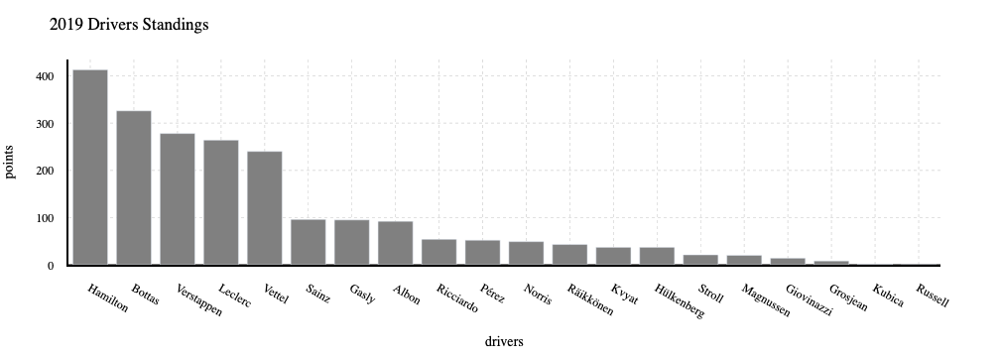

In [74]:
# 2019 ALL Drivers Standings 

h = driver_position.merge(circuits,left_on='circuitId',right_on='circuitId',how = 'left')
h.rename(columns={'name_y':'circuit_name'},inplace=True)
viz = h.loc[:,['date','year','circuit_name','surname','points','wins']]

viz.dropna(inplace = True)

viz.points = viz.points.astype('int64')
viz.wins = viz.wins.astype('int64')
viz.date = pd.to_datetime(viz.date)
    
top = viz[viz.loc[:,'year'] == 2019]
top = top.groupby(['surname'])[['points','wins']].max().sort_values('points',ascending = False).head(20).reset_index()

fig = go.Figure()
fig.add_trace(go.Bar(
    x=top['surname'],
    y=top['points'],
    name='2019 Drivers Standings',
    marker_color='grey'
))
fig.update_layout(layout_results)
fig.update_layout(title ="2019 Drivers Standings", xaxis_title="drivers",yaxis_title="points")
#fig = px.bar(top, x='surname', y='points',hover_data=['wins'], color='points',height=400,color_continuous_scale= 'turbo')
#fig.update_traces(textfont_size=20,marker=dict(line=dict(color='#000000', width=2)))
#fig.update_xaxes(showgrid=False)
#fig.update_yaxes(showgrid=False)
#fig.update_layout({
#'plot_bgcolor': 'rgba(0, 0, 0, 0)',
#'paper_bgcolor': 'rgba(0, 0, 0, 0)',
#})

fig.show()

In [75]:
# 2019 with just RB drivers(RB & Toro roso)

indexRB_2019 = df_2019[ (df_2019['code'] != 'VER') & (df_2019['code'] != 'GAS')  & (df_2019['code'] != 'ALB')].index

df_2019.drop(indexRB_2019 , inplace=True)
df_2019



/Users/diogodoria/opt/anaconda3/lib/python3.9/site-packages/pandas/core/frame.py:4906: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,raceId,driverId,lap,position,time,milliseconds,code,driverRef,name,date,year
449053,1010,830,1,4,1:36.291,96291,VER,max_verstappen,Australian Grand Prix,2019-03-17,2019
449054,1010,830,2,4,1:30.053,90053,VER,max_verstappen,Australian Grand Prix,2019-03-17,2019
449055,1010,830,3,4,1:29.370,89370,VER,max_verstappen,Australian Grand Prix,2019-03-17,2019
449056,1010,830,4,4,1:29.301,89301,VER,max_verstappen,Australian Grand Prix,2019-03-17,2019
449057,1010,830,5,4,1:29.723,89723,VER,max_verstappen,Australian Grand Prix,2019-03-17,2019
...,...,...,...,...,...,...,...,...,...,...,...
472499,1030,842,49,18,1:43.719,103719,GAS,gasly,Abu Dhabi Grand Prix,2019-12-01,2019
472500,1030,842,50,18,1:42.820,102820,GAS,gasly,Abu Dhabi Grand Prix,2019-12-01,2019
472501,1030,842,51,18,1:42.814,102814,GAS,gasly,Abu Dhabi Grand Prix,2019-12-01,2019
472502,1030,842,52,18,1:45.254,105254,GAS,gasly,Abu Dhabi Grand Prix,2019-12-01,2019


In [76]:
# df Every lap of every GP 2019 SEASON

df_laps = df[(df['year']==2019)&((df['code']=='VER')|(df['code']=='GAS'))|(df['driverRef']=='albon')].copy()
df_laps.rename(columns={'position':'lap position'},inplace=True)
df_laps = df_laps.merge(results[['raceId','driverId','position']],how='left',on=['raceId','driverId'])
df_laps = df_laps.merge(pit_stops[['raceId','driverId','lap','stop']],how='left',on=['raceId','driverId','lap'])
df_laps['stop'].fillna(0,inplace=True)
df_laps['stop']=df_laps['stop'].astype(int)
df_laps['stop'][df_laps['stop']==0] = ''
df_laps['seconds']=df_laps['milliseconds']/1000
df_laps

/var/folders/s8/zqdvt79d34nd7fs16cr64b7r0000gn/T/ipykernel_3968/498093113.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,raceId,driverId,lap,lap position,time,milliseconds,code,driverRef,name,date,year,position,stop,seconds
0,1010,830,1,4,1:36.291,96291,VER,max_verstappen,Australian Grand Prix,2019-03-17,2019,3,,96.291
1,1010,830,2,4,1:30.053,90053,VER,max_verstappen,Australian Grand Prix,2019-03-17,2019,3,,90.053
2,1010,830,3,4,1:29.370,89370,VER,max_verstappen,Australian Grand Prix,2019-03-17,2019,3,,89.370
3,1010,830,4,4,1:29.301,89301,VER,max_verstappen,Australian Grand Prix,2019-03-17,2019,3,,89.301
4,1010,830,5,4,1:29.723,89723,VER,max_verstappen,Australian Grand Prix,2019-03-17,2019,3,,89.723
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5353,1086,848,65,18,1:26.377,86377,ALB,albon,Hungarian Grand Prix,2022-07-31,2022,17,,86.377
5354,1086,848,66,17,1:34.127,94127,ALB,albon,Hungarian Grand Prix,2022-07-31,2022,17,,94.127
5355,1086,848,67,17,1:49.545,109545,ALB,albon,Hungarian Grand Prix,2022-07-31,2022,17,,109.545
5356,1086,848,68,16,1:28.621,88621,ALB,albon,Hungarian Grand Prix,2022-07-31,2022,17,,88.621


In [77]:
# Gran Prixs of 2019 season
df_2019_F = df_laps[(df_laps['year'] == 2019)]
df_2019_F['name'].unique()


array(['Australian Grand Prix', 'Bahrain Grand Prix',
       'Chinese Grand Prix', 'Azerbaijan Grand Prix',
       'Spanish Grand Prix', 'Monaco Grand Prix', 'Canadian Grand Prix',
       'French Grand Prix', 'Austrian Grand Prix', 'British Grand Prix',
       'German Grand Prix', 'Hungarian Grand Prix', 'Belgian Grand Prix',
       'Italian Grand Prix', 'Singapore Grand Prix', 'Russian Grand Prix',
       'Japanese Grand Prix', 'Mexican Grand Prix',
       'United States Grand Prix', 'Brazilian Grand Prix',
       'Abu Dhabi Grand Prix'], dtype=object)

In [78]:
df_2019_F.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3659 entries, 0 to 3658
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   raceId        3659 non-null   int64  
 1   driverId      3659 non-null   int64  
 2   lap           3659 non-null   int64  
 3   lap position  3659 non-null   int64  
 4   time          3659 non-null   object 
 5   milliseconds  3659 non-null   int64  
 6   code          3659 non-null   object 
 7   driverRef     3659 non-null   object 
 8   name          3659 non-null   object 
 9   date          3659 non-null   object 
 10  year          3659 non-null   int64  
 11  position      3659 non-null   object 
 12  stop          3659 non-null   object 
 13  seconds       3659 non-null   float64
dtypes: float64(1), int64(6), object(7)
memory usage: 428.8+ KB


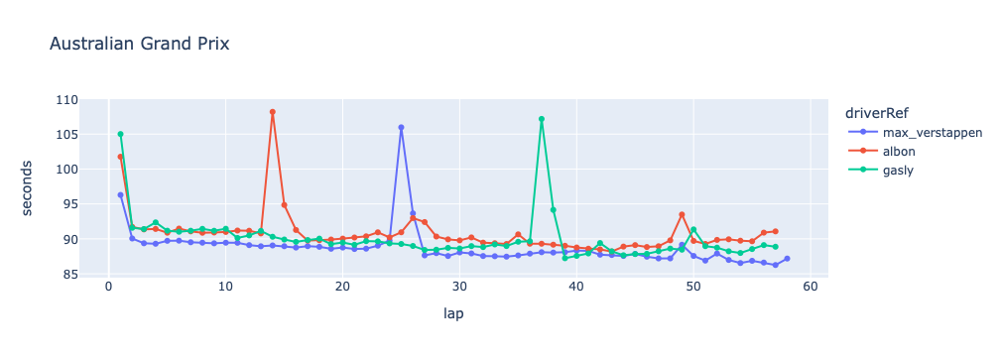

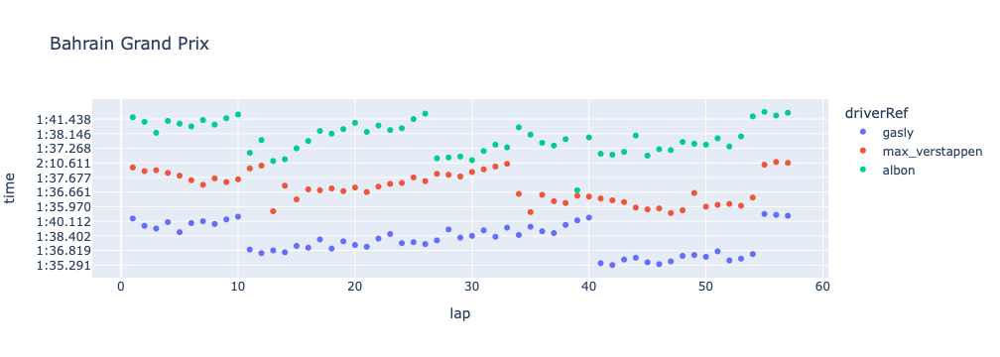

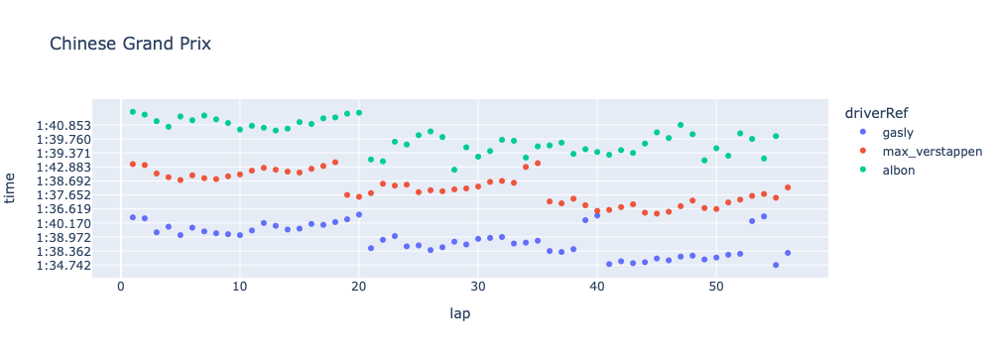

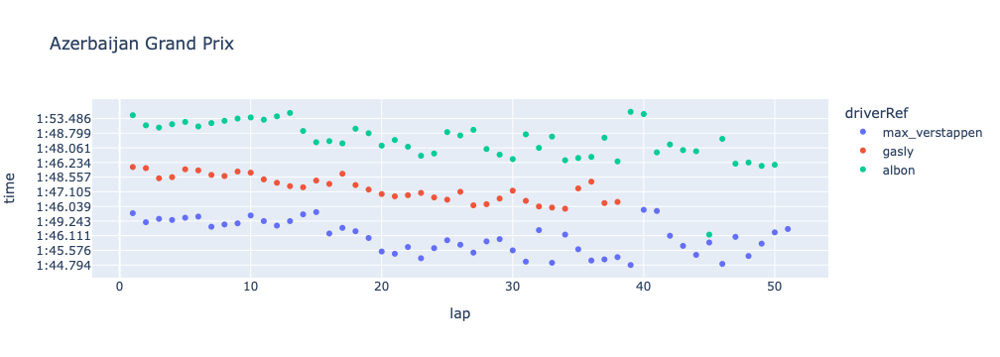

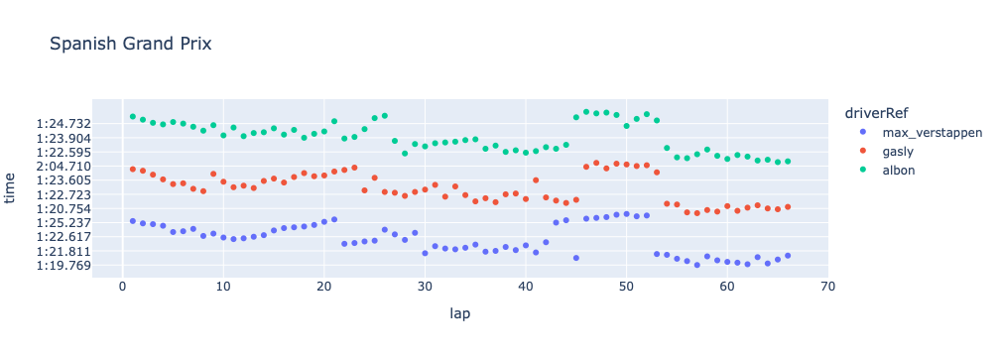

...

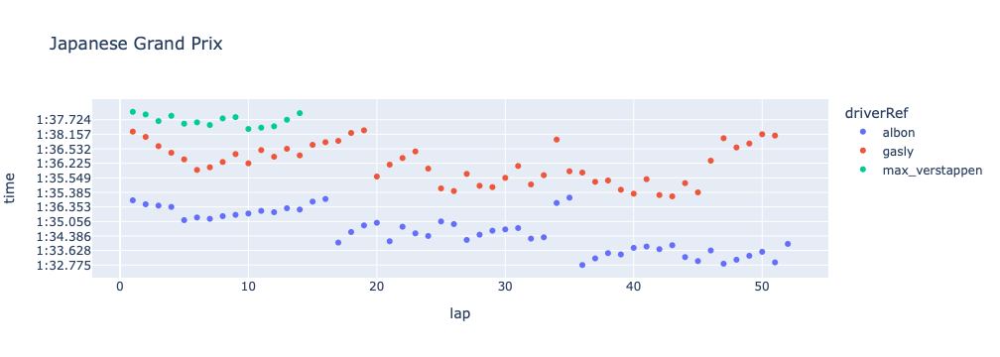

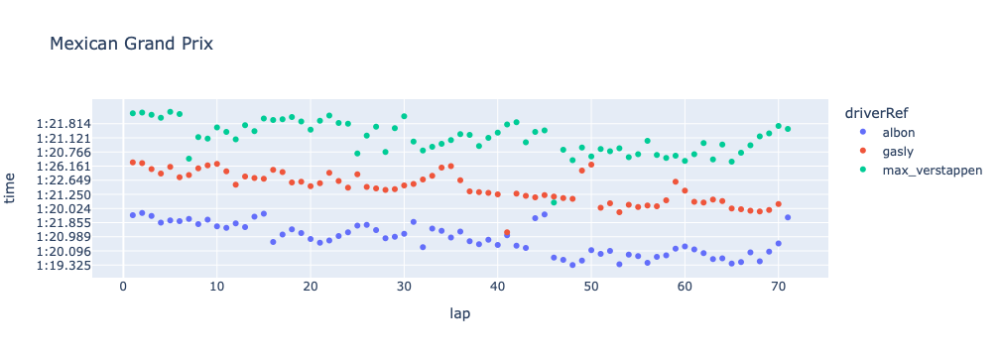

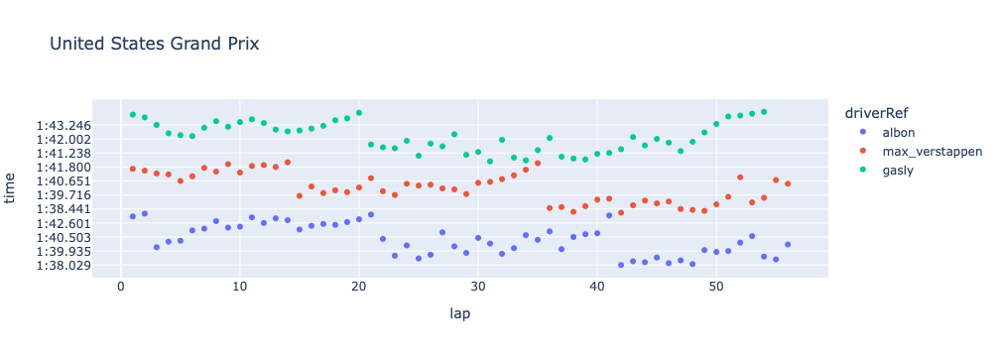

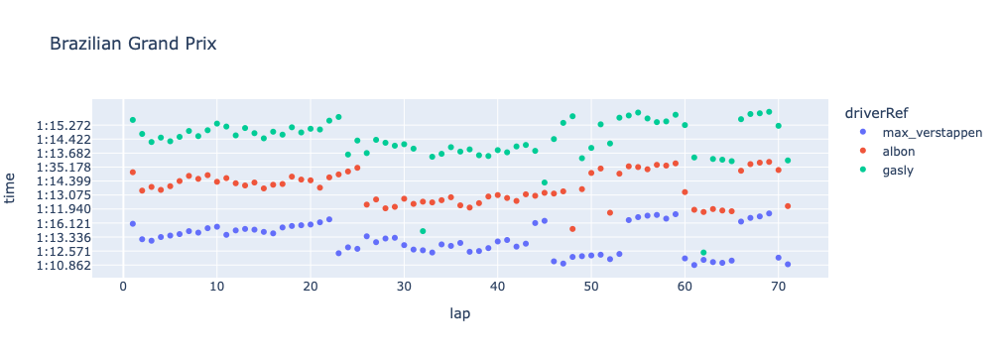

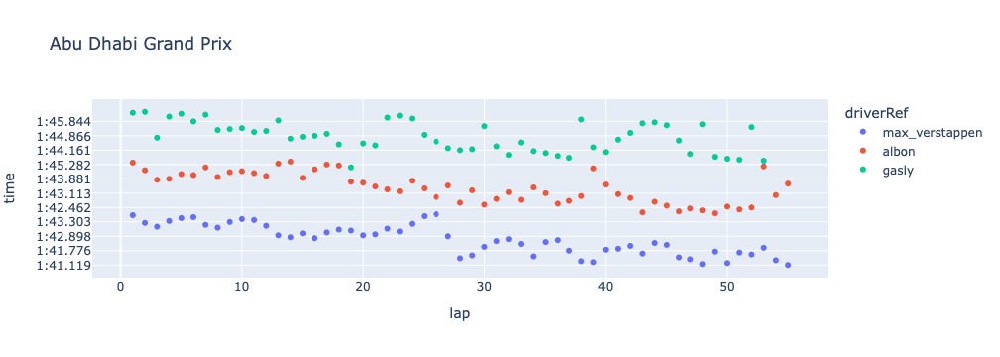

In [61]:

# RACES: PLOTLY EXPRESS


#['Australian Grand Prix', 'Bahrain Grand Prix',
 #      'Chinese Grand Prix', 'Azerbaijan Grand Prix',
  #     'Spanish Grand Prix', 'Monaco Grand Prix', 'Canadian Grand Prix',
   #    'French Grand Prix', 'Austrian Grand Prix', 'British Grand Prix',
    #   'German Grand Prix', 'Hungarian Grand Prix', 'Belgian Grand Prix',
     #  'Italian Grand Prix', 'Singapore Grand Prix', 'Russian Grand Prix',
      # 'Japanese Grand Prix', 'Mexican Grand Prix',
       #'United States Grand Prix', 'Brazilian Grand Prix',
       #'Abu Dhabi Grand Prix']

# Australian Grand Prix

df_2019_F_AUST = df_2019_F[(df_2019_F['name'] == 'Australian Grand Prix')]
df_2019_AUST = df_2019_F_AUST.query("driverRef in ['gasly', 'max_verstappen','albon']")
#df_2019_AUST = df_2019_AUST.sort_values(by="seconds")
df_2019_AUST = df_2019_AUST.sort_values(by="lap")

fig_2019_1 = px.line(df_2019_AUST, x="lap", y="seconds", color = "driverRef", title = "Australian Grand Prix",markers=True)
#fig_2019_1 = px.scatter(df_2019_AUST, x="lap", y="seconds", color = "driverRef", title = "Australian Grand Prix")
fig_2019_1.update_traces(textposition="bottom right")
#fig_2019_1.update_layout(layout)
fig_2019_1.show()

# Bahrain Grand Prix

df_2019_F_BAH = df_2019_F[(df_2019_F['name'] == 'Bahrain Grand Prix')]
df_2019_BAH = df_2019_F_BAH.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_BAH = df_2019_BAH.sort_values(by="time")

fig_2019_2 = px.scatter(df_2019_BAH, x="lap", y="time", color = "driverRef", title = "Bahrain Grand Prix")
fig_2019_2.update_traces(textposition="bottom right")
fig_2019_2.show()


# Chinese Grand Prix

df_2019_F_CHN = df_2019_F[(df_2019_F['name'] == 'Chinese Grand Prix')]
df_2019_CHN = df_2019_F_CHN.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_CHN = df_2019_CHN.sort_values(by="time")

fig_2019_3 = px.scatter(df_2019_CHN, x="lap", y="time", color = "driverRef", title = "Chinese Grand Prix")
fig_2019_3.update_traces(textposition="bottom right")
fig_2019_3.show()

# Azerbaijan Grand Prix

df_2019_F_AZB = df_2019_F[(df_2019_F['name'] == 'Azerbaijan Grand Prix')]
df_2019_AZB = df_2019_F_AZB.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_AZB = df_2019_AZB.sort_values(by="time")

fig_2019_4 = px.scatter(df_2019_AZB, x="lap", y="time", color = "driverRef", title = "Azerbaijan Grand Prix")
fig_2019_4.update_traces(textposition="bottom right")
fig_2019_4.show()

# Spanish Grand Prix

df_2019_F_SPN = df_2019_F[(df_2019_F['name'] == 'Spanish Grand Prix')]
df_2019_SPN = df_2019_F_SPN.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_SPN = df_2019_SPN.sort_values(by="time")

fig_2019_5 = px.scatter(df_2019_SPN, x="lap", y="time", color = "driverRef", title = "Spanish Grand Prix")
fig_2019_5.update_traces(textposition="bottom right")
fig_2019_5.show()

# Monaco Grand Prix

df_2019_F_MON = df_2019_F[(df_2019_F['name'] == 'Monaco Grand Prix')]
df_2019_MON = df_2019_F_MON.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_MON = df_2019_MON.sort_values(by="time")

fig_2019_6 = px.scatter(df_2019_MON, x="lap", y="time", color = "driverRef", title = "Monaco Grand Prix")
fig_2019_6.update_traces(textposition="bottom right")
fig_2019_6.show()

# Canadian Grand Prix

df_2019_F_CAN = df_2019_F[(df_2019_F['name'] == 'Canadian Grand Prix')]
df_2019_CAN = df_2019_F_CAN.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_CAN = df_2019_CAN.sort_values(by="time")

fig_2019_7 = px.scatter(df_2019_CAN, x="lap", y="time", color = "driverRef", title = "Canadian Grand Prix")
fig_2019_7.update_traces(textposition="bottom right")
fig_2019_7.show()

# French Grand Prix

df_2019_F_FRA = df_2019_F[(df_2019_F['name'] == 'French Grand Prix')]
df_2019_FRA = df_2019_F_FRA.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_FRA = df_2019_FRA.sort_values(by="time")

fig_2019_8 = px.scatter(df_2019_FRA, x="lap", y="time", color = "driverRef", title = "French Grand Prix")
fig_2019_8.update_traces(textposition="bottom right")
fig_2019_8.show()


# Austrian Grand Prix

df_2019_F_AUT = df_2019_F[(df_2019_F['name'] == 'Austrian Grand Prix')]
df_2019_AUT = df_2019_F_AUT.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_AUT = df_2019_AUT.sort_values(by="time")

fig_2019_9 = px.scatter(df_2019_AUT, x="lap", y="time", color = "driverRef", title = "Austrian Grand Prix")
fig_2019_9.update_traces(textposition="bottom right")
fig_2019_9.show()



# British Grand Prix

df_2019_F_BRIT = df_2019_F[(df_2019_F['name'] == 'British Grand Prix')]
df_2019_BRIT = df_2019_F_BRIT.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_BRIT = df_2019_BRIT.sort_values(by="time")

fig_2019_10 = px.scatter(df_2019_BRIT, x="lap", y="time", color = "driverRef", title = "British Grand Prix")
fig_2019_10.update_traces(textposition="bottom right")
fig_2019_10.show()

# German Grand Prix

df_2019_F_GER = df_2019_F[(df_2019_F['name'] == 'German Grand Prix')]
df_2019_GER = df_2019_F_GER.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_GER = df_2019_GER.sort_values(by="time")

fig_2019_11 = px.scatter(df_2019_GER, x="lap", y="time", color = "driverRef", title = "German Grand Prix")
fig_2019_11.update_traces(textposition="bottom right")
fig_2019_11.show()

# Hungarian Grand Prix

df_2019_F_HUN = df_2019_F[(df_2019_F['name'] == 'Hungarian Grand Prix')]
df_2019_HUN = df_2019_F_HUN.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_HUN = df_2019_HUN.sort_values(by="time")

fig_2019_12 = px.scatter(df_2019_HUN, x="lap", y="time", color = "driverRef", title = "Hungarian Grand Prix")
fig_2019_12.update_traces(textposition="bottom right")
fig_2019_12.show()

# Belgian Grand Prix

df_2019_F_BEL = df_2019_F[(df_2019_F['name'] == 'Belgian Grand Prix')]
df_2019_BEL = df_2019_F_BEL.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_BEL = df_2019_BEL.sort_values(by="time")

fig_2019_13 = px.scatter(df_2019_BEL, x="lap", y="time", color = "driverRef", title = "Belgian Grand Prix")
fig_2019_13.update_traces(textposition="bottom right")
fig_2019_13.show()

# Italian Grand Prix

df_2019_F_ITA = df_2019_F[(df_2019_F['name'] == 'Italian Grand Prix')]
df_2019_ITA = df_2019_F_ITA.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_ITA = df_2019_ITA.sort_values(by="time")

fig_2019_14 = px.scatter(df_2019_ITA, x="lap", y="time", color = "driverRef", title = "Italian Grand Prix")
fig_2019_14.update_traces(textposition="bottom right")
fig_2019_14.show()

# Singapore Grand Prix

df_2019_F_SGP = df_2019_F[(df_2019_F['name'] == 'Singapore Grand Prix')]
df_2019_SGP = df_2019_F_ITA.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_SGP = df_2019_ITA.sort_values(by="time")

fig_2019_15 = px.scatter(df_2019_SGP, x="lap", y="time", color = "driverRef", title = "Singapore Grand Prix")
fig_2019_15.update_traces(textposition="bottom right")
fig_2019_15.show()

# Russian Grand Prix

df_2019_F_RUS = df_2019_F[(df_2019_F['name'] == 'Russian Grand Prix')]
df_2019_RUS = df_2019_F_RUS.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_RUS = df_2019_RUS.sort_values(by="time")

fig_2019_16 = px.scatter(df_2019_RUS, x="lap", y="time", color = "driverRef", title = "Russian Grand Prix")
fig_2019_16.update_traces(textposition="bottom right")
fig_2019_16.show()

# Japanese Grand Prix

df_2019_F_JAP = df_2019_F[(df_2019_F['name'] == 'Japanese Grand Prix')]
df_2019_JAP = df_2019_F_JAP.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_JAP = df_2019_JAP.sort_values(by="time")

fig_2019_17 = px.scatter(df_2019_JAP, x="lap", y="time", color = "driverRef", title = "Japanese Grand Prix")
fig_2019_17.update_traces(textposition="bottom right")
fig_2019_17.show()

# Mexican Grand Prix

df_2019_F_MEX = df_2019_F[(df_2019_F['name'] == 'Mexican Grand Prix')]
df_2019_MEX = df_2019_F_MEX.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_MEX = df_2019_MEX.sort_values(by="time")

fig_2019_18 = px.scatter(df_2019_MEX, x="lap", y="time", color = "driverRef", title = "Mexican Grand Prix")
fig_2019_18.update_traces(textposition="bottom right")
fig_2019_18.show()

# United States Grand Prix

df_2019_F_US = df_2019_F[(df_2019_F['name'] == 'United States Grand Prix')]
df_2019_US  = df_2019_F_US.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_US  = df_2019_US.sort_values(by="time")

fig_2019_19 = px.scatter(df_2019_US, x="lap", y="time", color = "driverRef", title = "United States Grand Prix")
fig_2019_19.update_traces(textposition="bottom right")
fig_2019_19.show()

# Brazilian Grand Prix

df_2019_F_BRZ = df_2019_F[(df_2019_F['name'] == 'Brazilian Grand Prix')]
df_2019_BRZ  = df_2019_F_BRZ.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_BRZ  = df_2019_BRZ.sort_values(by="time")

fig_2019_20 = px.scatter(df_2019_BRZ, x="lap", y="time", color = "driverRef", title = "Brazilian Grand Prix")
fig_2019_20.update_traces(textposition="bottom right")
fig_2019_20.show()

# Abu Dhabi Grand Prix

df_2019_F_ABH = df_2019_F[(df_2019_F['name'] == 'Abu Dhabi Grand Prix')]
df_2019_ABH  = df_2019_F_ABH.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_ABH  = df_2019_ABH.sort_values(by="time")

fig_2019_21 = px.scatter(df_2019_ABH, x="lap", y="time", color = "driverRef", title = "Abu Dhabi Grand Prix")
fig_2019_21.update_traces(textposition="bottom right")
fig_2019_21.show()


In [62]:
df_2019_F['name'].unique()

array(['Australian Grand Prix', 'Bahrain Grand Prix',
       'Chinese Grand Prix', 'Azerbaijan Grand Prix',
       'Spanish Grand Prix', 'Monaco Grand Prix', 'Canadian Grand Prix',
       'French Grand Prix', 'Austrian Grand Prix', 'British Grand Prix',
       'German Grand Prix', 'Hungarian Grand Prix', 'Belgian Grand Prix',
       'Italian Grand Prix', 'Singapore Grand Prix', 'Russian Grand Prix',
       'Japanese Grand Prix', 'Mexican Grand Prix',
       'United States Grand Prix', 'Brazilian Grand Prix',
       'Abu Dhabi Grand Prix'], dtype=object)

/Users/diogodoria/opt/anaconda3/lib/python3.9/site-packages/pandas/core/indexing.py:1684: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/diogodoria/opt/anaconda3/lib/python3.9/site-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



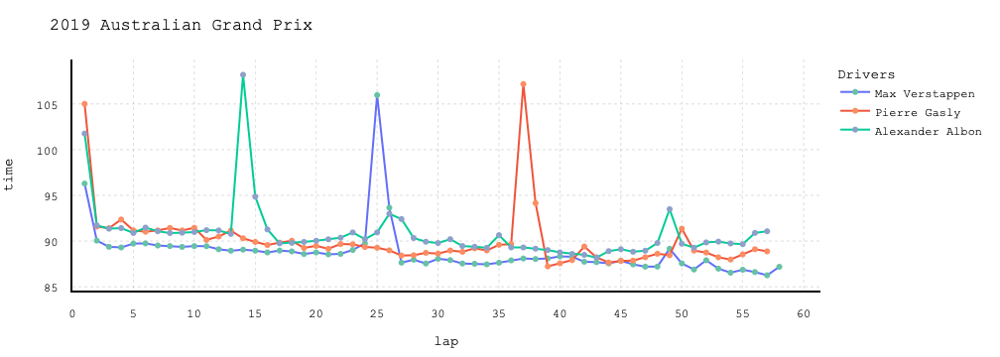

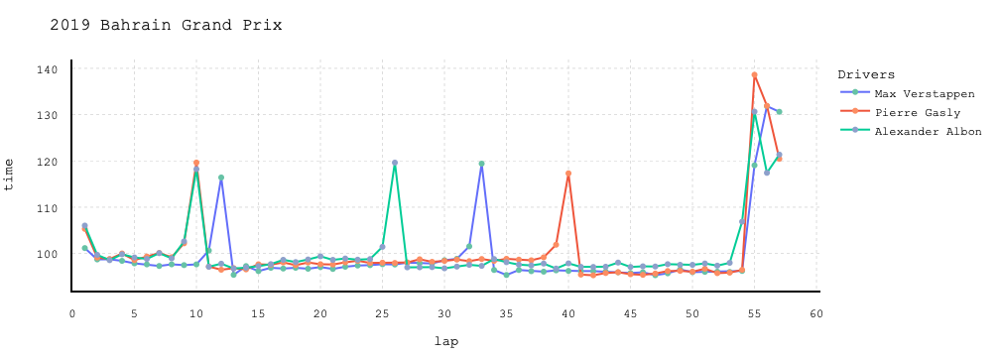

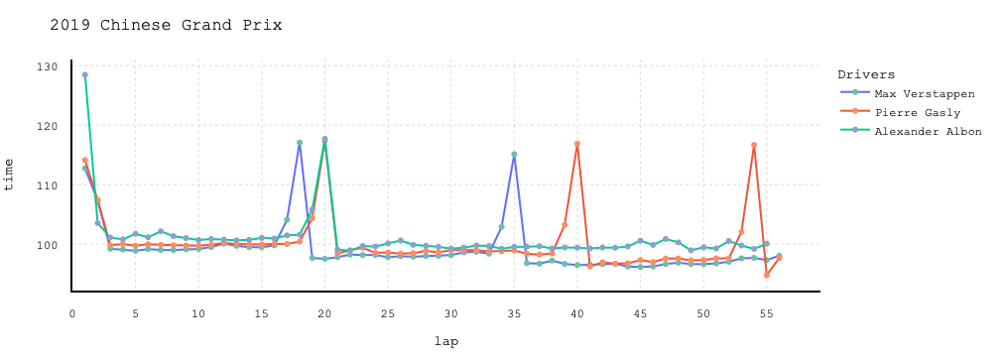

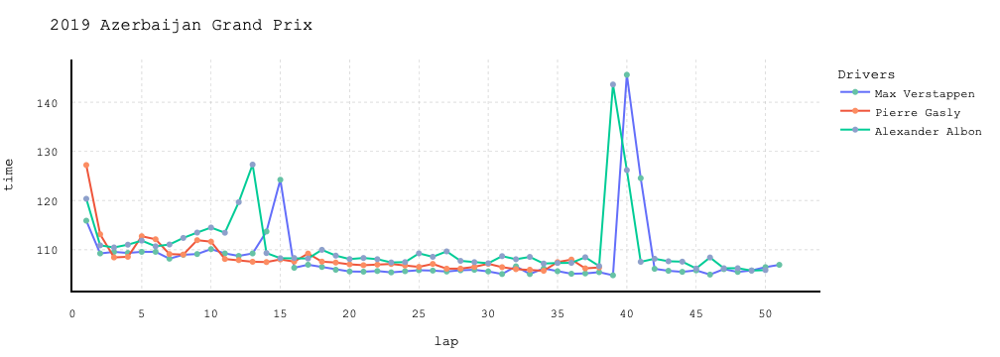

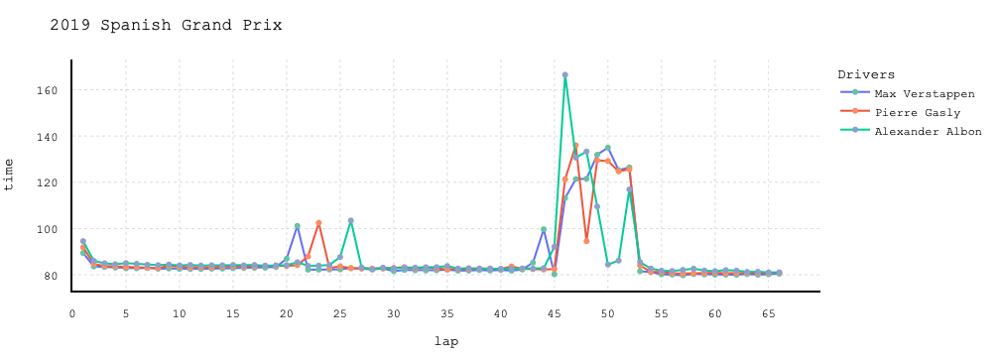

...

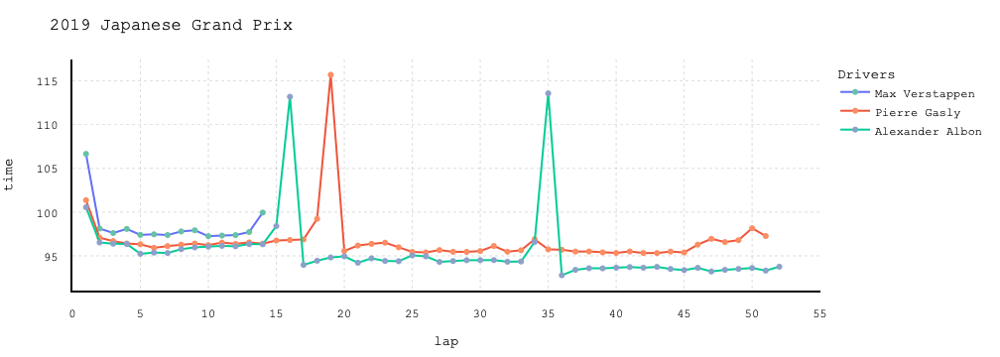

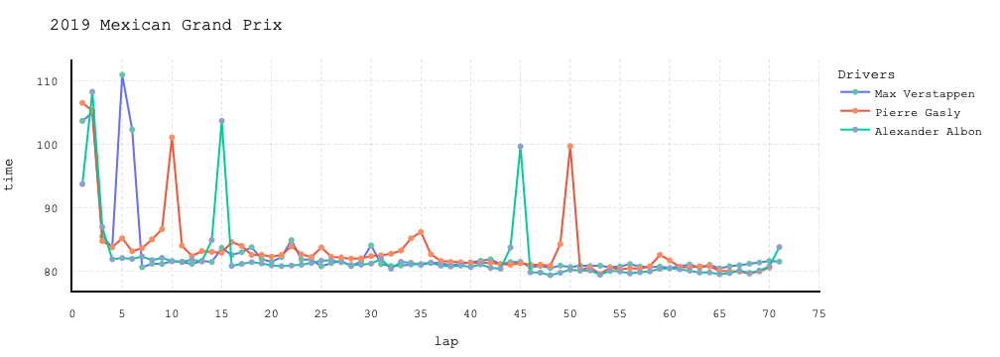

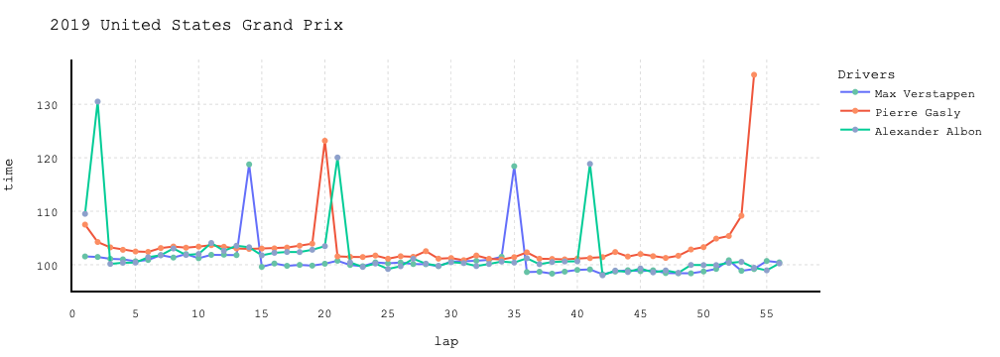

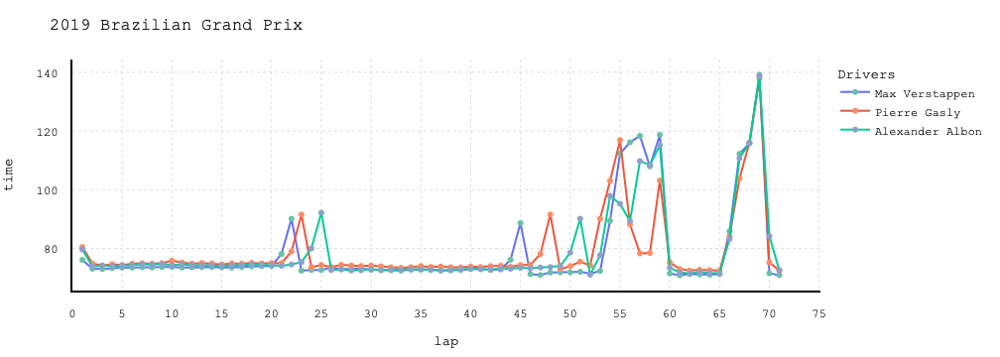

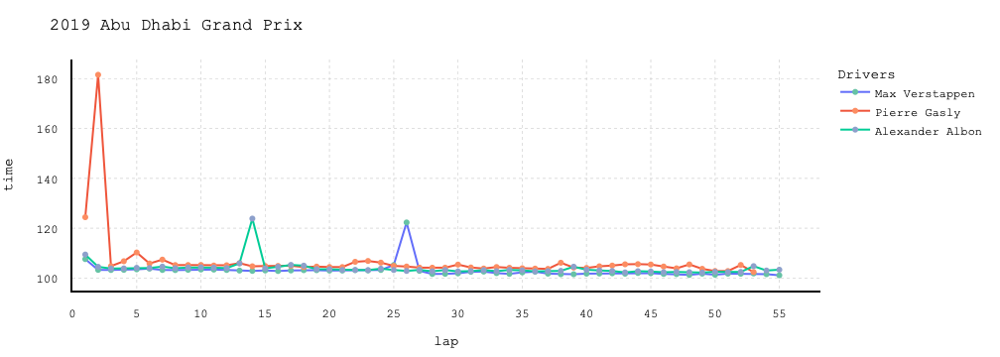

In [19]:

# Races: Graph Objects


#fig2019_1 = go.Figure()
#df_2019_AUST['color']='#ffa007'
#indices_gasly = [0,1,3,6,10,15]
#df.loc[indices,'A'] = 16

# Defining Colors for each driver 
indexRB_ver_19 = df_2019_F[(df_2019_F['code'] == 'VER')].index
df_2019_F.loc[indexRB_ver_19,'color'] = '#66c2a5'

indexRB_gasly_19 = df_2019_F[(df_2019_F['code'] == 'GAS')].index
df_2019_F.loc[indexRB_gasly_19,'color'] = '#fc8d62'

indexRB_albon_19 = df_2019_F[(df_2019_F['code'] == 'ALB')].index
df_2019_F.loc[indexRB_albon_19,'color'] = '#8da0cb'

# Australian Grand Prix

df_2019_F_AUST = df_2019_F[(df_2019_F['name'] == 'Australian Grand Prix')]
df_2019_AUST = df_2019_F_AUST.query("driverRef in ['gasly', 'max_verstappen','albon']")
#df_2019_AUST = df_2019_AUST.sort_values(by="seconds")
df_2019_AUST = df_2019_AUST.sort_values(by="lap")


df_2019_AUST_ver =df_2019_AUST[df_2019_AUST['code']=='VER']

df_2019_AUST_gas=df_2019_AUST[df_2019_AUST['code']=='GAS']

df_2019_AUST_alb =df_2019_AUST[df_2019_AUST['code']=='ALB']

fig2019_1 = go.Figure()

fig2019_1.add_trace(go.Scatter(x=df_2019_AUST_ver['lap'], y=df_2019_AUST_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2019_AUST_ver['color'],
                           marker=dict(color=df_2019_AUST_ver['color'])
))
fig2019_1.add_trace(go.Scatter(x=df_2019_AUST_gas['lap'], y=df_2019_AUST_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2019_AUST_gas['color'],
                           marker=dict(color=df_2019_AUST_gas['color'])
))


fig2019_1.add_trace(go.Scatter(x=df_2019_AUST_alb['lap'], y=df_2019_AUST_alb['seconds'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=df_2019_AUST_alb['color'])
))

fig2019_1.update_layout(layout)
fig2019_1.update_layout(title = '2019 Australian Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2019_1.show()

# Bahrain Grand Prix

df_2019_F_BAH = df_2019_F[(df_2019_F['name'] == 'Bahrain Grand Prix')]
df_2019_BAH = df_2019_F_BAH.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_BAH = df_2019_BAH.sort_values(by="lap")

df_2019_BAH_ver =df_2019_BAH[df_2019_BAH['code']=='VER']

df_2019_BAH_gas=df_2019_BAH[df_2019_BAH['code']=='GAS']

df_2019_BAH_alb =df_2019_BAH[df_2019_BAH['code']=='ALB']

fig2019_2 = go.Figure()

fig2019_2.add_trace(go.Scatter(x=df_2019_BAH_ver['lap'], y=df_2019_BAH_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2019_BAH_ver['color'],
                           marker=dict(color=df_2019_BAH_ver['color'])
))
fig2019_2.add_trace(go.Scatter(x=df_2019_BAH_gas['lap'], y=df_2019_BAH_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2019_BAH_gas['color'],
                           marker=dict(color=df_2019_BAH_gas['color'])
))


fig2019_2.add_trace(go.Scatter(x=df_2019_BAH_alb['lap'], y=df_2019_BAH_alb['seconds'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=df_2019_BAH_alb['color'])
))

fig2019_2.update_layout(layout)
fig2019_2.update_layout(title = '2019 Bahrain Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2019_2.show()

# Chinese Grand Prix

df_2019_F_CHN = df_2019_F[(df_2019_F['name'] == 'Chinese Grand Prix')]
df_2019_CHN = df_2019_F_CHN.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_CHN = df_2019_CHN.sort_values(by="lap")

df_2019_CHN_ver =df_2019_CHN[df_2019_CHN['code']=='VER']

df_2019_CHN_gas=df_2019_CHN[df_2019_CHN['code']=='GAS']

df_2019_CHN_alb =df_2019_CHN[df_2019_CHN['code']=='ALB']

fig2019_3 = go.Figure()

fig2019_3.add_trace(go.Scatter(x=df_2019_CHN_ver['lap'], y=df_2019_CHN_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2019_CHN_ver['color'],
                           marker=dict(color=df_2019_CHN_ver['color'])
))
fig2019_3.add_trace(go.Scatter(x=df_2019_CHN_gas['lap'], y=df_2019_CHN_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2019_CHN_gas['color'],
                           marker=dict(color=df_2019_CHN_gas['color'])
))


fig2019_3.add_trace(go.Scatter(x=df_2019_CHN_alb['lap'], y=df_2019_CHN_alb['seconds'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=df_2019_CHN_alb['color'])
))

fig2019_3.update_layout(layout)
fig2019_3.update_layout(title = '2019 Chinese Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2019_3.show()

# Azerbaijan Grand Prix

df_2019_F_AZB = df_2019_F[(df_2019_F['name'] == 'Azerbaijan Grand Prix')]
df_2019_AZB = df_2019_F_AZB.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_AZB = df_2019_AZB.sort_values(by="lap")

df_2019_AZB_ver =df_2019_AZB[df_2019_AZB['code']=='VER']

df_2019_AZB_gas=df_2019_AZB[df_2019_AZB['code']=='GAS']

df_2019_AZB_alb =df_2019_AZB[df_2019_AZB['code']=='ALB']

fig2019_4 = go.Figure()

fig2019_4.add_trace(go.Scatter(x=df_2019_AZB_ver['lap'], y=df_2019_AZB_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2019_AZB_ver['color'],
                           marker=dict(color=df_2019_AZB_ver['color'])
))
fig2019_4.add_trace(go.Scatter(x=df_2019_AZB_gas['lap'], y=df_2019_AZB_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2019_AZB_gas['color'],
                           marker=dict(color=df_2019_AZB_gas['color'])
))


fig2019_4.add_trace(go.Scatter(x=df_2019_AZB_alb['lap'], y=df_2019_AZB_alb['seconds'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=df_2019_AZB_alb['color'])
))

fig2019_4.update_layout(layout)
fig2019_4.update_layout(title = '2019 Azerbaijan Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2019_4.show()

# Spanish Grand Prix

df_2019_F_SPN = df_2019_F[(df_2019_F['name'] == 'Spanish Grand Prix')]
df_2019_SPN = df_2019_F_SPN.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_SPN = df_2019_SPN.sort_values(by="lap")

df_2019_SPN_ver =df_2019_SPN[df_2019_SPN['code']=='VER']

df_2019_SPN_gas=df_2019_SPN[df_2019_SPN['code']=='GAS']

df_2019_SPN_alb =df_2019_SPN[df_2019_SPN['code']=='ALB']

fig2019_5 = go.Figure()

fig2019_5.add_trace(go.Scatter(x=df_2019_SPN_ver['lap'], y=df_2019_SPN_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2019_SPN_ver['color'],
                           marker=dict(color=df_2019_SPN_ver['color'])
))
fig2019_5.add_trace(go.Scatter(x=df_2019_SPN_gas['lap'], y=df_2019_SPN_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2019_SPN_gas['color'],
                           marker=dict(color=df_2019_SPN_gas['color'])
))


fig2019_5.add_trace(go.Scatter(x=df_2019_SPN_alb['lap'], y=df_2019_SPN_alb['seconds'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=df_2019_SPN_alb['color'])
))

fig2019_5.update_layout(layout)
fig2019_5.update_layout(title = '2019 Spanish Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2019_5.show()


# Monaco Grand Prix

df_2019_F_MON = df_2019_F[(df_2019_F['name'] == 'Monaco Grand Prix')]
df_2019_MON = df_2019_F_MON.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_MON = df_2019_MON.sort_values(by="lap")

df_2019_MON_ver =df_2019_MON[df_2019_MON['code']=='VER']

df_2019_MON_gas=df_2019_MON[df_2019_MON['code']=='GAS']

df_2019_MON_alb =df_2019_MON[df_2019_MON['code']=='ALB']

fig2019_6 = go.Figure()

fig2019_6.add_trace(go.Scatter(x=df_2019_MON_ver['lap'], y=df_2019_MON_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2019_MON_ver['color'],
                           marker=dict(color=df_2019_MON_ver['color'])
))
fig2019_6.add_trace(go.Scatter(x=df_2019_MON_gas['lap'], y=df_2019_MON_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2019_MON_gas['color'],
                           marker=dict(color=df_2019_MON_gas['color'])
))


fig2019_6.add_trace(go.Scatter(x=df_2019_MON_alb['lap'], y=df_2019_MON_alb['seconds'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=df_2019_MON_alb['color'])
))

fig2019_6.update_layout(layout)
fig2019_6.update_layout(title = '2019 Monaco Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2019_6.show()


# Canadian Grand Prix

df_2019_F_CAN = df_2019_F[(df_2019_F['name'] == 'Canadian Grand Prix')]
df_2019_CAN = df_2019_F_CAN.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_CAN = df_2019_CAN.sort_values(by="lap")

df_2019_CAN_ver =df_2019_CAN[df_2019_CAN['code']=='VER']

df_2019_CAN_gas=df_2019_CAN[df_2019_CAN['code']=='GAS']

df_2019_CAN_alb =df_2019_CAN[df_2019_CAN['code']=='ALB']

fig2019_7 = go.Figure()

fig2019_7.add_trace(go.Scatter(x=df_2019_CAN_ver['lap'], y=df_2019_CAN_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2019_CAN_ver['color'],
                           marker=dict(color=df_2019_CAN_ver['color'])
))
fig2019_7.add_trace(go.Scatter(x=df_2019_CAN_gas['lap'], y=df_2019_CAN_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2019_CAN_gas['color'],
                           marker=dict(color=df_2019_CAN_gas['color'])
))


fig2019_7.add_trace(go.Scatter(x=df_2019_CAN_alb['lap'], y=df_2019_CAN_alb['seconds'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=df_2019_CAN_alb['color'])
))

fig2019_7.update_layout(layout)
fig2019_7.update_layout(title = '2019 Canadian Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2019_7.show()



# French Grand Prix

df_2019_F_FRA = df_2019_F[(df_2019_F['name'] == 'French Grand Prix')]
df_2019_FRA = df_2019_F_FRA.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_FRA = df_2019_FRA.sort_values(by="lap")

df_2019_FRA_ver =df_2019_FRA[df_2019_FRA['code']=='VER']

df_2019_FRA_gas=df_2019_FRA[df_2019_FRA['code']=='GAS']

df_2019_FRA_alb =df_2019_FRA[df_2019_FRA['code']=='ALB']

fig2019_8 = go.Figure()

fig2019_8.add_trace(go.Scatter(x=df_2019_FRA_ver['lap'], y=df_2019_FRA_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2019_FRA_ver['color'],
                           marker=dict(color=df_2019_FRA_ver['color'])
))
fig2019_8.add_trace(go.Scatter(x=df_2019_FRA_gas['lap'], y=df_2019_FRA_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2019_FRA_gas['color'],
                           marker=dict(color=df_2019_FRA_gas['color'])
))


fig2019_8.add_trace(go.Scatter(x=df_2019_FRA_alb['lap'], y=df_2019_FRA_alb['seconds'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=df_2019_FRA_alb['color'])
))

fig2019_8.update_layout(layout)
fig2019_8.update_layout(title = '2019 French Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2019_8.show()


# Austrian Grand Prix

df_2019_F_AUT = df_2019_F[(df_2019_F['name'] == 'Austrian Grand Prix')]
df_2019_AUT = df_2019_F_AUT.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_AUT = df_2019_AUT.sort_values(by="lap")

df_2019_AUT_ver =df_2019_AUT[df_2019_AUT['code']=='VER']

df_2019_AUT_gas=df_2019_AUT[df_2019_AUT['code']=='GAS']

df_2019_AUT_alb =df_2019_AUT[df_2019_AUT['code']=='ALB']

fig2019_9 = go.Figure()

fig2019_9.add_trace(go.Scatter(x=df_2019_AUT_ver['lap'], y=df_2019_AUT_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2019_AUT_ver['color'],
                           marker=dict(color=df_2019_AUT_ver['color'])
))
fig2019_9.add_trace(go.Scatter(x=df_2019_AUT_gas['lap'], y=df_2019_AUT_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2019_AUT_gas['color'],
                           marker=dict(color=df_2019_AUT_gas['color'])
))


fig2019_9.add_trace(go.Scatter(x=df_2019_AUT_alb['lap'], y=df_2019_AUT_alb['seconds'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=df_2019_AUT_alb['color'])
))

fig2019_9.update_layout(layout)
fig2019_9.update_layout(title = '2019 Austrian Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2019_9.show()



# British Grand Prix

df_2019_F_BRIT = df_2019_F[(df_2019_F['name'] == 'British Grand Prix')]
df_2019_BRIT = df_2019_F_BRIT.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_BRIT = df_2019_BRIT.sort_values(by="lap")

df_2019_BRIT_ver =df_2019_BRIT[df_2019_BRIT['code']=='VER']

df_2019_BRIT_gas=df_2019_BRIT[df_2019_BRIT['code']=='GAS']

df_2019_BRIT_alb =df_2019_BRIT[df_2019_BRIT['code']=='ALB']

fig2019_10 = go.Figure()

fig2019_10.add_trace(go.Scatter(x=df_2019_BRIT_ver['lap'], y=df_2019_BRIT_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2019_BRIT_ver['color'],
                           marker=dict(color=df_2019_BRIT_ver['color'])
))
fig2019_10.add_trace(go.Scatter(x=df_2019_BRIT_gas['lap'], y=df_2019_BRIT_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2019_BRIT_gas['color'],
                           marker=dict(color=df_2019_BRIT_gas['color'])
))


fig2019_10.add_trace(go.Scatter(x=df_2019_BRIT_alb['lap'], y=df_2019_BRIT_alb['seconds'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=df_2019_BRIT_alb['color'])
))

fig2019_10.update_layout(layout)
fig2019_10.update_layout(title = '2019 British Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2019_10.show()

# German Grand Prix

df_2019_F_GER = df_2019_F[(df_2019_F['name'] == 'German Grand Prix')]
df_2019_GER = df_2019_F_GER.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_GER = df_2019_GER.sort_values(by="lap")

df_2019_GER_ver =df_2019_GER[df_2019_GER['code']=='VER']

df_2019_GER_gas=df_2019_GER[df_2019_GER['code']=='GAS']

df_2019_GER_alb =df_2019_GER[df_2019_GER['code']=='ALB']

fig2019_11 = go.Figure()

fig2019_11.add_trace(go.Scatter(x=df_2019_GER_ver['lap'], y=df_2019_GER_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2019_GER_ver['color'],
                           marker=dict(color=df_2019_GER_ver['color'])
))
fig2019_11.add_trace(go.Scatter(x=df_2019_GER_gas['lap'], y=df_2019_GER_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2019_GER_gas['color'],
                           marker=dict(color=df_2019_GER_gas['color'])
))


fig2019_11.add_trace(go.Scatter(x=df_2019_GER_alb['lap'], y=df_2019_GER_alb['seconds'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=df_2019_GER_alb['color'])
))

fig2019_11.update_layout(layout)
fig2019_11.update_layout(title = '2019 German Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2019_11.show()

# Hungarian Grand Prix

df_2019_F_HUN = df_2019_F[(df_2019_F['name'] == 'Hungarian Grand Prix')]
df_2019_HUN = df_2019_F_HUN.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_HUN = df_2019_HUN.sort_values(by="lap")


df_2019_HUN_ver =df_2019_HUN[df_2019_HUN['code']=='VER']

df_2019_HUN_gas=df_2019_HUN[df_2019_HUN['code']=='GAS']

df_2019_HUN_alb =df_2019_HUN[df_2019_HUN['code']=='ALB']

fig2019_12 = go.Figure()

fig2019_12.add_trace(go.Scatter(x=df_2019_HUN_ver['lap'], y=df_2019_HUN_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2019_HUN_ver['color'],
                           marker=dict(color=df_2019_HUN_ver['color'])
))
fig2019_12.add_trace(go.Scatter(x=df_2019_HUN_gas['lap'], y=df_2019_HUN_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2019_HUN_gas['color'],
                           marker=dict(color=df_2019_HUN_gas['color'])
))


fig2019_12.add_trace(go.Scatter(x=df_2019_HUN_alb['lap'], y=df_2019_HUN_alb['seconds'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=df_2019_HUN_alb['color'])
))

fig2019_12.update_layout(layout)
fig2019_12.update_layout(title = '2019 Hungarian Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2019_12.show()



# Belgian Grand Prix

df_2019_F_BEL = df_2019_F[(df_2019_F['name'] == 'Belgian Grand Prix')]
df_2019_BEL = df_2019_F_BEL.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_BEL = df_2019_BEL.sort_values(by="lap")

df_2019_BEL_ver =df_2019_BEL[df_2019_BEL['code']=='VER']

df_2019_BEL_gas=df_2019_BEL[df_2019_BEL['code']=='GAS']

df_2019_BEL_alb =df_2019_BEL[df_2019_BEL['code']=='ALB']

fig2019_13 = go.Figure()

fig2019_13.add_trace(go.Scatter(x=df_2019_BEL_ver['lap'], y=df_2019_BEL_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2019_BEL_ver['color'],
                           marker=dict(color=df_2019_BEL_ver['color'])
))
fig2019_13.add_trace(go.Scatter(x=df_2019_BEL_gas['lap'], y=df_2019_BEL_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2019_BEL_gas['color'],
                           marker=dict(color=df_2019_BEL_gas['color'])
))


fig2019_13.add_trace(go.Scatter(x=df_2019_BEL_alb['lap'], y=df_2019_BEL_alb['seconds'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=df_2019_BEL_alb['color'])
))

fig2019_13.update_layout(layout)
fig2019_13.update_layout(title = '2019 Belgian Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2019_13.show()

# Italian Grand Prix

df_2019_F_ITA = df_2019_F[(df_2019_F['name'] == 'Italian Grand Prix')]
df_2019_ITA = df_2019_F_ITA.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_ITA = df_2019_ITA.sort_values(by="lap")

df_2019_ITA_ver =df_2019_ITA[df_2019_ITA['code']=='VER']

df_2019_ITA_gas=df_2019_ITA[df_2019_ITA['code']=='GAS']

df_2019_ITA_alb =df_2019_ITA[df_2019_ITA['code']=='ALB']

fig2019_14 = go.Figure()

fig2019_14.add_trace(go.Scatter(x=df_2019_ITA_ver['lap'], y=df_2019_ITA_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2019_ITA_ver['color'],
                           marker=dict(color=df_2019_ITA_ver['color'])
))
fig2019_14.add_trace(go.Scatter(x=df_2019_ITA_gas['lap'], y=df_2019_ITA_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2019_ITA_gas['color'],
                           marker=dict(color=df_2019_ITA_gas['color'])
))


fig2019_14.add_trace(go.Scatter(x=df_2019_ITA_alb['lap'], y=df_2019_ITA_alb['seconds'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=df_2019_ITA_alb['color'])
))

fig2019_14.update_layout(layout)
fig2019_14.update_layout(title = '2019 Italian Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2019_14.show()



# Singapore Grand Prix

df_2019_F_SGP = df_2019_F[(df_2019_F['name'] == 'Singapore Grand Prix')]
df_2019_SGP = df_2019_F_SGP.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_SGP = df_2019_SGP.sort_values(by="lap")

df_2019_SGP_ver =df_2019_SGP[df_2019_SGP['code']=='VER']

df_2019_SGP_gas=df_2019_SGP[df_2019_SGP['code']=='GAS']

df_2019_SGP_alb =df_2019_SGP[df_2019_SGP['code']=='ALB']

fig2019_15 = go.Figure()

fig2019_15.add_trace(go.Scatter(x=df_2019_SGP_ver['lap'], y=df_2019_SGP_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2019_SGP_ver['color'],
                           marker=dict(color=df_2019_SGP_ver['color'])
))
fig2019_15.add_trace(go.Scatter(x=df_2019_SGP_gas['lap'], y=df_2019_SGP_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2019_SGP_gas['color'],
                           marker=dict(color=df_2019_SGP_gas['color'])
))


fig2019_15.add_trace(go.Scatter(x=df_2019_SGP_alb['lap'], y=df_2019_SGP_alb['seconds'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=df_2019_SGP_alb['color'])
))

fig2019_15.update_layout(layout)
fig2019_15.update_layout(title = '2019 Singapore Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2019_15.show()

# Russian Grand Prix

df_2019_F_RUS = df_2019_F[(df_2019_F['name'] == 'Russian Grand Prix')]
df_2019_RUS = df_2019_F_RUS.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_RUS = df_2019_RUS.sort_values(by="lap")


df_2019_RUS_ver =df_2019_RUS[df_2019_RUS['code']=='VER']

df_2019_RUS_gas=df_2019_RUS[df_2019_RUS['code']=='GAS']

df_2019_RUS_alb =df_2019_RUS[df_2019_RUS['code']=='ALB']

fig2019_16 = go.Figure()

fig2019_16.add_trace(go.Scatter(x=df_2019_RUS_ver['lap'], y=df_2019_RUS_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2019_RUS_ver['color'],
                           marker=dict(color=df_2019_RUS_ver['color'])
))
fig2019_16.add_trace(go.Scatter(x=df_2019_RUS_gas['lap'], y=df_2019_RUS_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2019_RUS_gas['color'],
                           marker=dict(color=df_2019_RUS_gas['color'])
))


fig2019_16.add_trace(go.Scatter(x=df_2019_RUS_alb['lap'], y=df_2019_RUS_alb['seconds'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=df_2019_RUS_alb['color'])
))

fig2019_16.update_layout(layout)
fig2019_16.update_layout(title = '2019 Russian Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2019_16.show()

# Japanese Grand Prix

df_2019_F_JAP = df_2019_F[(df_2019_F['name'] == 'Japanese Grand Prix')]
df_2019_JAP = df_2019_F_JAP.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_JAP = df_2019_JAP.sort_values(by="lap")

df_2019_JAP_ver =df_2019_JAP[df_2019_JAP['code']=='VER']

df_2019_JAP_gas=df_2019_JAP[df_2019_JAP['code']=='GAS']

df_2019_JAP_alb =df_2019_JAP[df_2019_JAP['code']=='ALB']

fig2019_17 = go.Figure()

fig2019_17.add_trace(go.Scatter(x=df_2019_JAP_ver['lap'], y=df_2019_JAP_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2019_JAP_ver['color'],
                           marker=dict(color=df_2019_JAP_ver['color'])
))
fig2019_17.add_trace(go.Scatter(x=df_2019_JAP_gas['lap'], y=df_2019_JAP_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2019_JAP_gas['color'],
                           marker=dict(color=df_2019_JAP_gas['color'])
))


fig2019_17.add_trace(go.Scatter(x=df_2019_JAP_alb['lap'], y=df_2019_JAP_alb['seconds'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=df_2019_JAP_alb['color'])
))

fig2019_17.update_layout(layout)
fig2019_17.update_layout(title = '2019 Japanese Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2019_17.show()

# Mexican Grand Prix

df_2019_F_MEX = df_2019_F[(df_2019_F['name'] == 'Mexican Grand Prix')]
df_2019_MEX = df_2019_F_MEX.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_MEX = df_2019_MEX.sort_values(by="lap")

df_2019_MEX_ver =df_2019_MEX[df_2019_MEX['code']=='VER']

df_2019_MEX_gas=df_2019_MEX[df_2019_MEX['code']=='GAS']

df_2019_MEX_alb =df_2019_MEX[df_2019_MEX['code']=='ALB']

fig2019_18 = go.Figure()

fig2019_18.add_trace(go.Scatter(x=df_2019_MEX_ver['lap'], y=df_2019_MEX_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2019_MEX_ver['color'],
                           marker=dict(color=df_2019_MEX_ver['color'])
))
fig2019_18.add_trace(go.Scatter(x=df_2019_MEX_gas['lap'], y=df_2019_MEX_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2019_MEX_gas['color'],
                           marker=dict(color=df_2019_MEX_gas['color'])
))


fig2019_18.add_trace(go.Scatter(x=df_2019_MEX_alb['lap'], y=df_2019_MEX_alb['seconds'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=df_2019_MEX_alb['color'])
))

fig2019_18.update_layout(layout)
fig2019_18.update_layout(title = '2019 Mexican Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2019_18.show()

# United States Grand Prix

df_2019_F_US = df_2019_F[(df_2019_F['name'] == 'United States Grand Prix')]
df_2019_US  = df_2019_F_US.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_US  = df_2019_US.sort_values(by="lap")

df_2019_US_ver =df_2019_US[df_2019_US['code']=='VER']

df_2019_US_gas=df_2019_US[df_2019_US['code']=='GAS']

df_2019_US_alb =df_2019_US[df_2019_US['code']=='ALB']

fig2019_19 = go.Figure()

fig2019_19.add_trace(go.Scatter(x=df_2019_US_ver['lap'], y=df_2019_US_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2019_US_ver['color'],
                           marker=dict(color=df_2019_US_ver['color'])
))
fig2019_19.add_trace(go.Scatter(x=df_2019_US_gas['lap'], y=df_2019_US_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2019_US_gas['color'],
                           marker=dict(color=df_2019_US_gas['color'])
))


fig2019_19.add_trace(go.Scatter(x=df_2019_US_alb['lap'], y=df_2019_US_alb['seconds'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=df_2019_US_alb['color'])
))

fig2019_19.update_layout(layout)
fig2019_19.update_layout(title = '2019 United States Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2019_19.show()

# Brazilian Grand Prix

df_2019_F_BRZ = df_2019_F[(df_2019_F['name'] == 'Brazilian Grand Prix')]
df_2019_BRZ  = df_2019_F_BRZ.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_BRZ  = df_2019_BRZ.sort_values(by="lap")

df_2019_BRZ_ver =df_2019_BRZ[df_2019_BRZ['code']=='VER']

df_2019_BRZ_gas=df_2019_BRZ[df_2019_BRZ['code']=='GAS']

df_2019_BRZ_alb =df_2019_BRZ[df_2019_BRZ['code']=='ALB']

fig2019_20 = go.Figure()

fig2019_20.add_trace(go.Scatter(x=df_2019_BRZ_ver['lap'], y=df_2019_BRZ_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2019_BRZ_ver['color'],
                           marker=dict(color=df_2019_BRZ_ver['color'])
))
fig2019_20.add_trace(go.Scatter(x=df_2019_BRZ_gas['lap'], y=df_2019_BRZ_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2019_BRZ_gas['color'],
                           marker=dict(color=df_2019_BRZ_gas['color'])
))


fig2019_20.add_trace(go.Scatter(x=df_2019_BRZ_alb['lap'], y=df_2019_BRZ_alb['seconds'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=df_2019_BRZ_alb['color'])
))

fig2019_20.update_layout(layout)
fig2019_20.update_layout(title = '2019 Brazilian Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2019_20.show()



# Abu Dhabi Grand Prix

df_2019_F_ABH = df_2019_F[(df_2019_F['name'] == 'Abu Dhabi Grand Prix')]
df_2019_ABH  = df_2019_F_ABH.query("driverRef in ['gasly', 'max_verstappen','albon']")
df_2019_ABH  = df_2019_ABH.sort_values(by="lap")

df_2019_ABH_ver =df_2019_ABH[df_2019_ABH['code']=='VER']

df_2019_ABH_gas=df_2019_ABH[df_2019_ABH['code']=='GAS']

df_2019_ABH_alb =df_2019_ABH[df_2019_ABH['code']=='ALB']

fig2019_21 = go.Figure()

fig2019_21.add_trace(go.Scatter(x=df_2019_ABH_ver['lap'], y=df_2019_ABH_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2019_ABH_ver['color'],
                           marker=dict(color=df_2019_ABH_ver['color'])
))
fig2019_21.add_trace(go.Scatter(x=df_2019_ABH_gas['lap'], y=df_2019_ABH_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2019_ABH_gas['color'],
                           marker=dict(color=df_2019_ABH_gas['color'])
))


fig2019_21.add_trace(go.Scatter(x=df_2019_ABH_alb['lap'], y=df_2019_ABH_alb['seconds'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=df_2019_ABH_alb['color'])
))

fig2019_21.update_layout(layout)
fig2019_21.update_layout(title = '2019 Abu Dhabi Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2019_21.show()

/Users/diogodoria/opt/anaconda3/lib/python3.9/site-packages/pandas/core/indexing.py:1684: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/diogodoria/opt/anaconda3/lib/python3.9/site-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



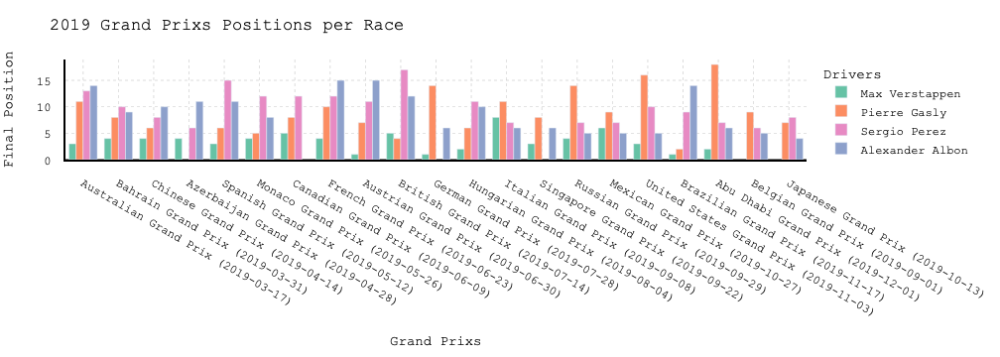

In [79]:
# Position 2019 per Race
df_results_2019 = df_results[(df_results['year']==2019)&((df_results['code']=='VER')|(df_results['code']=='GAS')|(df_results['code']=='ALB')|(df_results['code']=='PER'))]

    
indexRB_ver_19 = df_results_2019[(df_results_2019['code'] == 'VER')].index
df_results_2019.loc[indexRB_ver_19,'color'] = '#66c2a5'

indexRB_gasly_19 = df_results_2019[(df_results_2019['code'] == 'GAS')].index
df_results_2019.loc[indexRB_gasly_19,'color'] = '#fc8d62'

indexRB_albon_19 = df_results_2019[(df_results_2019['code'] == 'ALB')].index
df_results_2019.loc[indexRB_albon_19,'color'] = '#8da0cb'

indexRB_perez_19 = df_results_2019[(df_results_2019['code'] == 'PER')].index
df_results_2019.loc[indexRB_perez_19,'color'] = '#e78ac3'



df_results_2019_ver =df_results_2019[df_results_2019['code']=='VER']
df_results_2019_ver= df_results_2019_ver.sort_values(by="date")
df_results_2019_ver['corrida']=df_results_2019_ver['name']+' ('+df_results_2019_ver['date']+')'

df_results_2019_gas =df_results_2019[df_results_2019['code']=='GAS']
df_results_2019_gas= df_results_2019_gas.sort_values(by="date")
df_results_2019_gas['corrida']=df_results_2019_gas['name']+' ('+df_results_2019_gas['date']+')'

df_results_2019_per =df_results_2019[df_results_2019['code']=='PER']
df_results_2019_per= df_results_2019_per.sort_values(by="date")
df_results_2019_per['corrida']=df_results_2019_per['name']+' ('+df_results_2019_per['date']+')'

df_results_2019_alb =df_results_2019[df_results_2019['code']=='ALB']
df_results_2019_alb= df_results_2019_alb.sort_values(by="date")
df_results_2019_alb['corrida']=df_results_2019_alb['name']+' ('+df_results_2019_alb['date']+')'


fig_results_2019 = go.Figure()

fig_results_2019 = go.Figure(data=[
    go.Bar(name ='Max Verstappen',x=df_results_2019_ver['corrida'], y=df_results_2019_ver['position'],marker_color=df_results_2019_ver['color']),
    go.Bar(name='Pierre Gasly',x=df_results_2019_gas['corrida'], y=df_results_2019_gas['position'],marker_color=df_results_2019_gas['color']),
    go.Bar(name='Sergio Perez',x=df_results_2019_per['corrida'], y=df_results_2019_per['position'],marker_color=df_results_2019_per['color']),
    go.Bar(name='Alexander Albon',x=df_results_2019_alb['corrida'], y=df_results_2019_alb['position'],marker_color=df_results_2019_alb['color']),
    
])

fig_results_2019.update_layout(layout_results)
fig_results_2019.update_layout(title = '2019 Grand Prixs Positions per Race',xaxis_title ="Grand Prixs",yaxis_title ="Final Position",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig_results_2019.show()


# PLOTLY EXPRESS
#fig = px.bar(df_results_2019, x='name', y='position',text_auto='.2s'
             #,hover_data=['driverRef', 'position']
 #            , color='driverRef', height=100,barmode='group', title  = 'Positions 2019')
#fig.update_traces(textfont_size=100, textangle=0, textposition="outside", cliponaxis=False)
#fig.update_layout(layout)
#fig.update_layout({
#'plot_bgcolor': 'rgba(0, 0, 0, 0)',
#'paper_bgcolor': 'rgba(0, 0, 0, 0)',
#})

#fig.show()

In [115]:
# TESTING BARS GRAPH OBJECTS
#barGraph = go.Figure()
#barGraph.add_trace(go.Bar(
 #   x=top['surname'],
  #  y=top['points'],
   # marker=marker,
    #base=dict(color=df_results_2019['driverRef']
    #         ))

#barGraph.update_layout(layout_results)

# Title and grid
#barGraph.update_layout(
 #   title="Points 2019",
  #  xaxis=dict(
   #     showgrid=False,
    #    zeroline=False
    #),
    #yaxis=dict(
     #   showgrid=True
    #)
#)

#barGraph.show()

/var/folders/s8/zqdvt79d34nd7fs16cr64b7r0000gn/T/ipykernel_3968/2295476192.py:19: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/s8/zqdvt79d34nd7fs16cr64b7r0000gn/T/ipykernel_3968/2295476192.py:22: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/s8/zqdvt79d34nd7fs16cr64b7r0000gn/T/ipykernel_3968/2295476192.py:25: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the d

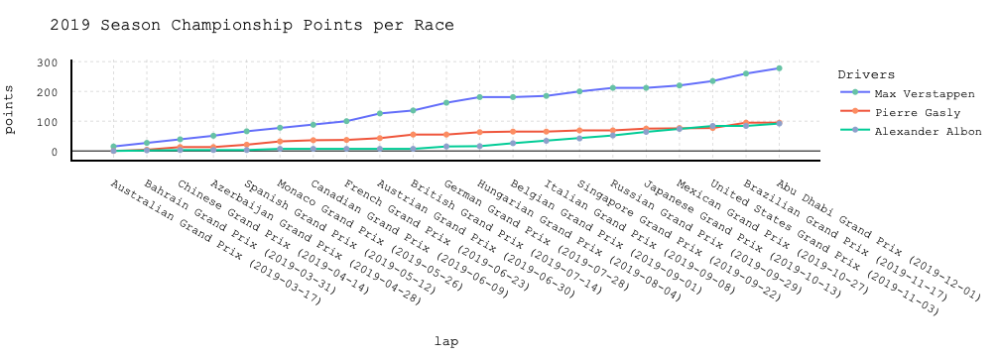

In [80]:
# 2019 Season Points per Race
season_Points_2019_ = season_Points_2019.query("code in ['GAS', 'VER','ALB','PER']")
season_Points_2019_ = season_Points_2019.sort_values(by="date")


indexRB_ver_19 = season_Points_2019[(season_Points_2019['code'] == 'VER')].index
season_Points_2019.loc[indexRB_ver_19,'color'] = '#66c2a5'

indexRB_gasly_19 = season_Points_2019[(season_Points_2019['code'] == 'GAS')].index
season_Points_2019.loc[indexRB_gasly_19,'color'] = '#fc8d62'

indexRB_albon_19 = season_Points_2019[(season_Points_2019['code'] == 'ALB')].index
season_Points_2019.loc[indexRB_albon_19,'color'] = '#8da0cb'

#indexRB_perez_19 = season_Points_2019[(season_Points_2019['code'] == 'PER')].index
#season_Points_2019.loc[indexRB_perez_19,'color'] = '#e78ac3'

season_Points_2019_ver =season_Points_2019[season_Points_2019['code']=='VER']
season_Points_2019_ver['corrida']=season_Points_2019_ver['name']+' ('+season_Points_2019_ver['date']+')'

season_Points_2019_gas =season_Points_2019[season_Points_2019['code']=='GAS']
season_Points_2019_gas['corrida']=season_Points_2019_gas['name']+' ('+season_Points_2019_gas['date']+')'

season_Points_2019_alb =season_Points_2019[season_Points_2019['code']=='ALB']
season_Points_2019_alb['corrida']=season_Points_2019_alb['name']+' ('+season_Points_2019_alb['date']+')'

#season_Points_2019_per =season_Points_2019[season_Points_2019['code']=='PER']

fig2019_season_points = go.Figure()

fig2019_season_points.add_trace(go.Scatter(x=season_Points_2019_ver['corrida'], y=season_Points_2019_ver['points'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = season_Points_2019_ver['color'],
                           marker=dict(color=season_Points_2019_ver['color'])
))
fig2019_season_points.add_trace(go.Scatter(x=season_Points_2019_gas['corrida'], y=season_Points_2019_gas['points'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = season_Points_2019_gas['color'],
                           marker=dict(color=season_Points_2019_gas['color'])
))


fig2019_season_points.add_trace(go.Scatter(x=season_Points_2019_alb['corrida'], y=season_Points_2019_alb['points'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=season_Points_2019_alb['color'])
))

#fig2019_season_points.add_trace(go.Scatter(x=season_Points_2019_per['name'], y=season_Points_2019_per['points'],
 #                   mode='lines+markers',
  #                  name='Sergio Perez',
   #                        marker=dict(color=season_Points_2019_per['color'])
#))

fig2019_season_points.update_layout(layout_results)
fig2019_season_points.update_layout(title = '2019 Season Championship Points per Race ',xaxis_title ="lap",yaxis_title ="points",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2019_season_points.show()


# Plotly EXPRESS
#fig = px.line(season_Points_2019_, x='name', y='points', color='code', markers=True, title = '2019 Red Bull WDC')
#fig.update_layout({
#'plot_bgcolor': 'rgba(0, 0, 0, 0)',
#'paper_bgcolor': 'rgba(0, 0, 0, 0)',
#})
#fig.show()

# 2020
##### Verstappen - Main driver
##### Albon - Teammate
##### Gasly - Alpha Tauri
##### Checo Pérez- Racing Point


In [81]:
# 2020 Season Gran Prixs info

df_laps_2020 = df[(df['year']==2020)&((df['code']=='VER')|(df['code']=='GAS'))|(df['driverRef']=='albon')|(df['driverRef']=='perez')].copy()
df_laps_2020.rename(columns={'position':'lap position'},inplace=True)
df_laps_2020 = df_laps_2020.merge(results[['raceId','driverId','position']],how='left',on=['raceId','driverId'])
df_laps_2020 = df_laps_2020.merge(pit_stops[['raceId','driverId','lap','stop']],how='left',on=['raceId','driverId','lap'])
df_laps_2020['stop'].fillna(0,inplace=True)
df_laps_2020['stop']=df_laps_2020['stop'].astype(int)
df_laps_2020['stop'][df_laps_2020['stop']==0] = ''
df_laps_2020['seconds']=df_laps_2020['milliseconds']/1000
df_laps_2020

/var/folders/s8/zqdvt79d34nd7fs16cr64b7r0000gn/T/ipykernel_3968/4100157713.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,raceId,driverId,lap,lap position,time,milliseconds,code,driverRef,name,date,year,position,stop,seconds
0,841,815,1,14,1:52.663,112663,PER,perez,Australian Grand Prix,2011-03-27,2011,\N,,112.663
1,841,815,2,14,1:37.576,97576,PER,perez,Australian Grand Prix,2011-03-27,2011,\N,,97.576
2,841,815,3,14,1:36.216,96216,PER,perez,Australian Grand Prix,2011-03-27,2011,\N,,96.216
3,841,815,4,14,1:35.617,95617,PER,perez,Australian Grand Prix,2011-03-27,2011,\N,,95.617
4,841,815,5,14,1:35.999,95999,PER,perez,Australian Grand Prix,2011-03-27,2011,\N,,95.999
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17098,1086,848,65,18,1:26.377,86377,ALB,albon,Hungarian Grand Prix,2022-07-31,2022,17,,86.377
17099,1086,848,66,17,1:34.127,94127,ALB,albon,Hungarian Grand Prix,2022-07-31,2022,17,,94.127
17100,1086,848,67,17,1:49.545,109545,ALB,albon,Hungarian Grand Prix,2022-07-31,2022,17,,109.545
17101,1086,848,68,16,1:28.621,88621,ALB,albon,Hungarian Grand Prix,2022-07-31,2022,17,,88.621


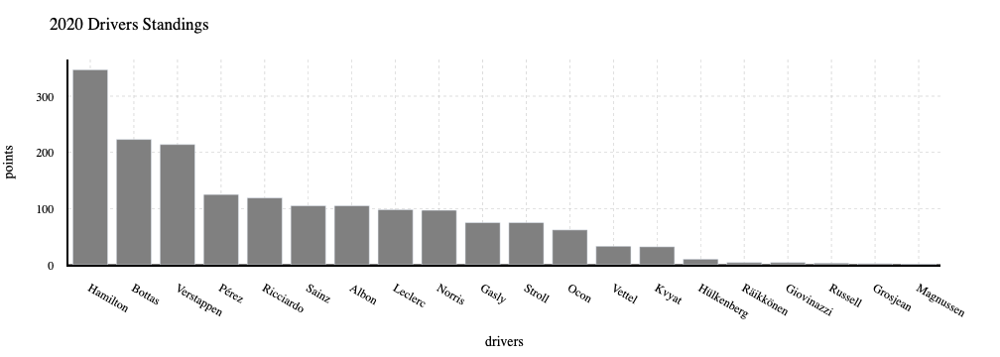

In [82]:
# 2020 Season Drivers Standings

h = driver_position.merge(circuits,left_on='circuitId',right_on='circuitId',how = 'left')
h.rename(columns={'name_y':'circuit_name'},inplace=True)
viz = h.loc[:,['date','year','circuit_name','surname','points','wins']]

viz.dropna(inplace = True)

viz.points = viz.points.astype('int64')
viz.wins = viz.wins.astype('int64')
viz.date = pd.to_datetime(viz.date)
    
top = viz[viz.loc[:,'year'] == 2020]
top = top.groupby(['surname'])[['points','wins']].max().sort_values('points',ascending = False).head(20).reset_index()


fig = go.Figure()
fig.add_trace(go.Bar(
    x=top['surname'],
    y=top['points'],
    name='2020 Drivers Standings',
    marker_color='grey'
))
fig.update_layout(layout_results)
fig.update_layout(title ="2020 Drivers Standings", xaxis_title="drivers",yaxis_title="points")

# Plotly Express
#fig = px.bar(top, x='surname', y='points',hover_data=['wins'], color='points',height=400,color_continuous_scale= 'turbo')
#fig.update_traces(textfont_size=20,marker=dict(line=dict(color='#000000', width=2)))
#fig.update_xaxes(showgrid=False)
#fig.update_yaxes(showgrid=False)
#fig.update_layout({'plot_bgcolor': 'rgba(0, 0, 0, 0)','paper_bgcolor': 'rgba(0, 0, 0, 0)',})

fig.show()

In [83]:
# 2020 Season 
df_2020 = df_laps_2020[df_laps_2020['year'] == 2020]
df_2020


,raceId,driverId,lap,lap position,time,milliseconds,code,driverRef,name,date,year,position,stop,seconds
11009,1031,830,1,2,1:13.501,73501,VER,max_verstappen,Austrian Grand Prix,2020-07-05,2020,\N,,73.501
11010,1031,830,2,2,1:09.859,69859,VER,max_verstappen,Austrian Grand Prix,2020-07-05,2020,\N,,69.859
11011,1031,830,3,2,1:09.380,69380,VER,max_verstappen,Austrian Grand Prix,2020-07-05,2020,\N,,69.380
11012,1031,830,4,2,1:09.428,69428,VER,max_verstappen,Austrian Grand Prix,2020-07-05,2020,\N,,69.428
11013,1031,830,5,2,1:09.351,69351,VER,max_verstappen,Austrian Grand Prix,2020-07-05,2020,\N,,69.351
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14536,1047,815,4,17,1:44.762,104762,PER,perez,Abu Dhabi Grand Prix,2020-12-13,2020,\N,,104.762
14537,1047,815,5,16,1:43.786,103786,PER,perez,Abu Dhabi Grand Prix,2020-12-13,2020,\N,,103.786
14538,1047,815,6,15,1:43.263,103263,PER,perez,Abu Dhabi Grand Prix,2020-12-13,2020,\N,,103.263
14539,1047,815,7,15,1:45.123,105123,PER,perez,Abu Dhabi Grand Prix,2020-12-13,2020,\N,,105.123


In [84]:
# 2020 Season - drivers selected 
df_2020['driverRef'].unique()

array(['max_verstappen', 'albon', 'perez', 'gasly'], dtype=object)

In [85]:
# 2020 Season - All Grand Prix
df_2020['name'].unique()

array(['Austrian Grand Prix', 'Styrian Grand Prix',
       'Hungarian Grand Prix', 'British Grand Prix',
       '70th Anniversary Grand Prix', 'Spanish Grand Prix',
       'Belgian Grand Prix', 'Italian Grand Prix', 'Tuscan Grand Prix',
       'Russian Grand Prix', 'Eifel Grand Prix', 'Portuguese Grand Prix',
       'Emilia Romagna Grand Prix', 'Turkish Grand Prix',
       'Bahrain Grand Prix', 'Sakhir Grand Prix', 'Abu Dhabi Grand Prix'],
      dtype=object)

In [ ]:

# RACES: plotly express

#'Austrian Grand Prix', 'Styrian Grand Prix',
       #'Hungarian Grand Prix', 'British Grand Prix',
       #'70th Anniversary Grand Prix', 'Spanish Grand Prix',
       #'Belgian Grand Prix', 'Italian Grand Prix', 'Tuscan Grand Prix',
       #'Russian Grand Prix', 'Eifel Grand Prix', 'Portuguese Grand Prix',
       #'Emilia Romagna Grand Prix', 'Turkish Grand Prix',
       #'Bahrain Grand Prix', 'Sakhir Grand Prix', 'Abu Dhabi Grand Prix'
        
        
# Austrian Grand Prix

df_2020_F_AUS = df_2020[(df_2020['name'] == 'Austrian Grand Prix')]
df_2020_AUS = df_2020_F_AUS.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2020_AUS = df_2020_AUS.sort_values(by="time")

fig_2020_1 = px.scatter(df_2020_AUS, x="lap", y="time", color = "driverRef", title = "Austrian Grand Prix")
fig_2020_1.update_traces(textposition="bottom right")
#fig_2020_1.update_layout({
#'plot_bgcolor': 'rgba(0, 0, 0, 0)',
#'paper_bgcolor': 'rgba(0, 0, 0, 0)',
#})
fig_2020_1.show()

# Styrian Grand Prix

df_2020_F_STY = df_2020[(df_2020['name'] == 'Styrian Grand Prix')]
df_2020_STY = df_2020_F_STY.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2020_STY = df_2020_STY.sort_values(by="time")

fig_2020_2 = px.scatter(df_2020_STY, x="lap", y="time", color = "driverRef", title = "Styrian Grand Prix")
fig_2020_2.update_traces(textposition="bottom right")

#fig_2020_2.update_layout({
#'plot_bgcolor': 'rgba(0, 0, 0, 0)',
#'paper_bgcolor': 'rgba(0, 0, 0, 0)',
#})
fig_2020_2.show()


# Hungarian Grand Prix

df_2020_F_HUN = df_2020[(df_2020['name'] == 'Hungarian Grand Prix')]
df_2020_HUN = df_2020_F_HUN.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2020_HUN = df_2020_HUN.sort_values(by="time")

fig_2020_3 = px.scatter(df_2020_HUN, x="lap", y="time", color = "driverRef", title = "Hungarian Grand Prix")
fig_2020_3.update_traces(textposition="bottom right")

# SEM background
#fig_2020_3.update_layout({
#'plot_bgcolor': 'rgba(0, 0, 0, 0)',
#'paper_bgcolor': 'rgba(0, 0, 0, 0)',
#})
fig_2020_3.show()

# British Grand Prix

df_2020_F_BRIT = df_2020[(df_2020['name'] == 'British Grand Prix')]
df_2020_BRIT = df_2020_F_BRIT.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2020_BRIT = df_2020_BRIT.sort_values(by="time")

fig_2020_4 = px.scatter(df_2020_BRIT, x="lap", y="time", color = "driverRef", title = "British Grand Prix")
fig_2020_4.update_traces(textposition="bottom right")
fig_2020_4.show()

# 70th Anniversary Grand Prix

df_2020_F_70TH = df_2020[(df_2020['name'] == '70th Anniversary Grand Prix')]
df_2020_70TH = df_2020_F_70TH.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2020_70TH = df_2020_70TH.sort_values(by="time")

fig_2020_5 = px.scatter(df_2020_70TH, x="lap", y="time", color = "driverRef", title = "70th Anniversary Grand Prix")
fig_2020_5.update_traces(textposition="bottom right")
fig_2020_5.show()

# Spanish Grand Prix

df_2020_F_ESP = df_2020[(df_2020['name'] == 'Spanish Grand Prix')]
df_2020_ESP = df_2020_F_ESP.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2020_ESP = df_2020_ESP.sort_values(by="time")

fig_2020_6 = px.scatter(df_2020_ESP, x="lap", y="time", color = "driverRef", title = "Spanish Grand Prix")
fig_2020_6.update_traces(textposition="bottom right")
fig_2020_6.show()

# Belgian Grand Prix

df_2020_F_BEL = df_2020[(df_2020['name'] == 'Belgian Grand Prix')]
df_2020_BEL = df_2020_F_BEL.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2020_BEL = df_2020_BEL.sort_values(by="time")

fig_2020_7 = px.scatter(df_2020_BEL, x="lap", y="time", color = "driverRef", title = "Belgian Grand Prix")
fig_2020_7.update_traces(textposition="bottom right")
fig_2020_7.show()

# Italian Grand Prix

df_2020_F_ITA = df_2020[(df_2020['name'] == 'Italian Grand Prix')]
df_2020_ITA = df_2020_F_ITA.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2020_ITA = df_2020_ITA.sort_values(by="time")

fig_2020_8 = px.scatter(df_2020_ITA, x="lap", y="time", color = "driverRef", title = "Italian Grand Prix")
fig_2020_8.update_traces(textposition="bottom right")
fig_2020_8.show()


# Tuscan Grand Prix

df_2020_F_TUS = df_2020[(df_2020['name'] == 'Tuscan Grand Prix')]
df_2020_TUS = df_2020_F_TUS.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2020_TUS = df_2020_TUS.sort_values(by="time")

fig_2020_9 = px.scatter(df_2020_TUS, x="lap", y="time", color = "driverRef", title = "Tuscan Grand Prix")
fig_2020_9.update_traces(textposition="bottom right")
fig_2020_9.show()



# Russian Grand Prix

df_2020_F_RUS = df_2020[(df_2020['name'] == 'Russian Grand Prix')]
df_2020_RUS = df_2020_F_RUS.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2020_RUS = df_2020_RUS.sort_values(by="time")

fig_2020_10 = px.scatter(df_2020_RUS, x="lap", y="time", color = "driverRef", title = "Russian Grand Prix")
fig_2020_10.update_traces(textposition="bottom right")
fig_2020_10.show()

# Eifel Grand Prix

df_2020_F_EIF = df_2020[(df_2020['name'] == 'Eifel Grand Prix')]
df_2020_EIF = df_2020_F_EIF.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2020_EIF = df_2020_EIF.sort_values(by="time")

fig_2020_11 = px.scatter(df_2020_EIF, x="lap", y="time", color = "driverRef", title = "Eifel Grand Prix")
fig_2020_11.update_traces(textposition="bottom right")
fig_2020_11.show()

# Portuguese Grand Prix

df_2020_F_POR = df_2020[(df_2020['name'] == 'Portuguese Grand Prix')]
df_2020_POR = df_2020_F_POR.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2020_POR = df_2020_POR.sort_values(by="time")

fig_2020_12 = px.scatter(df_2020_POR, x="lap", y="time", color = "driverRef", title = "Portuguese Grand Prix")
fig_2020_12.update_traces(textposition="bottom right")
fig_2020_12.show()

# Emilia Romagna Grand Prix

df_2020_F_EMI = df_2020[(df_2020['name'] == 'Emilia Romagna Grand Prix')]
df_2020_EMI = df_2020_F_EMI.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2020_EMI = df_2020_EMI.sort_values(by="time")

fig_2020_13 = px.scatter(df_2020_EMI, x="lap", y="time", color = "driverRef", title = "Emilia Romagna Grand Prix")
fig_2020_13.update_traces(textposition="bottom right")
fig_2020_13.show()

# Turkish Grand Prix

df_2020_F_TUR = df_2020[(df_2020['name'] == 'Turkish Grand Prix')]
df_2020_TUR = df_2020_F_TUR.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2020_TUR = df_2020_TUR.sort_values(by="time")

fig_2020_14 = px.scatter(df_2020_TUR, x="lap", y="time", color = "driverRef", title = "Turkish Grand Prix")
fig_2020_14.update_traces(textposition="bottom right")
fig_2020_14.show()

# Bahrain Grand Prix

df_2020_F_BAH = df_2020[(df_2020['name'] == 'Bahrain Grand Prix')]
df_2020_BAH = df_2020_F_BAH.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2020_BAH = df_2020_BAH.sort_values(by="time")

fig_2020_15 = px.scatter(df_2020_BAH, x="lap", y="time", color = "driverRef", title = "Bahrain Grand Prix")
fig_2020_15.update_traces(textposition="bottom right")
fig_2020_15.show()

# Sakhir Grand Prix

df_2020_F_SAK = df_2020[(df_2020['name'] == 'Sakhir Grand Prix')]
df_2020_SAK = df_2020_F_SAK.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2020_SAK = df_2020_SAK.sort_values(by="time")

fig_2020_16 = px.scatter(df_2020_SAK, x="lap", y="time", color = "driverRef", title = "Sakhir Grand Prix")
fig_2020_16.update_traces(textposition="bottom right")
fig_2020_16.show()

# Abu Dhabi Grand Prix

df_2020_F_ABH = df_2020[(df_2020['name'] == 'Abu Dhabi Grand Prix')]
df_2020_ABH  = df_2020_F_ABH.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2020_ABH  = df_2020_ABH.sort_values(by="time")

fig_2020_21 = px.scatter(df_2020_ABH, x="lap", y="time", color = "driverRef", title = "Abu Dhabi Grand Prix")
fig_2020_21.update_traces(textposition="bottom right")
fig_2020_21.show()



In [86]:
df_2020['name'].unique()

array(['Austrian Grand Prix', 'Styrian Grand Prix',
       'Hungarian Grand Prix', 'British Grand Prix',
       '70th Anniversary Grand Prix', 'Spanish Grand Prix',
       'Belgian Grand Prix', 'Italian Grand Prix', 'Tuscan Grand Prix',
       'Russian Grand Prix', 'Eifel Grand Prix', 'Portuguese Grand Prix',
       'Emilia Romagna Grand Prix', 'Turkish Grand Prix',
       'Bahrain Grand Prix', 'Sakhir Grand Prix', 'Abu Dhabi Grand Prix'],
      dtype=object)

/Users/diogodoria/opt/anaconda3/lib/python3.9/site-packages/pandas/core/indexing.py:1684: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/diogodoria/opt/anaconda3/lib/python3.9/site-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



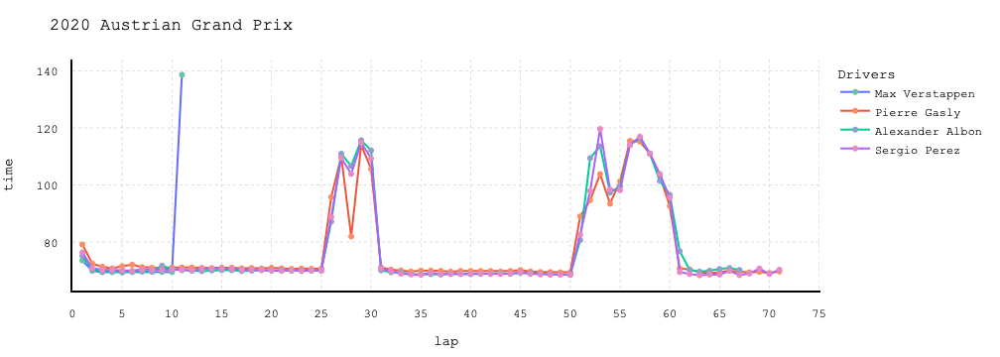

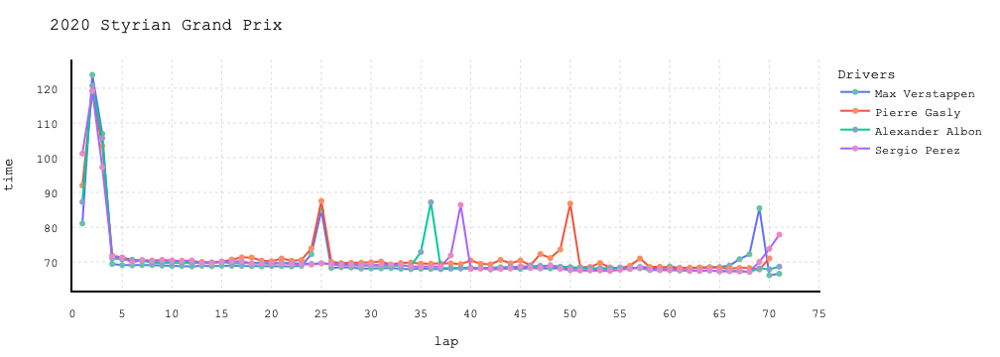

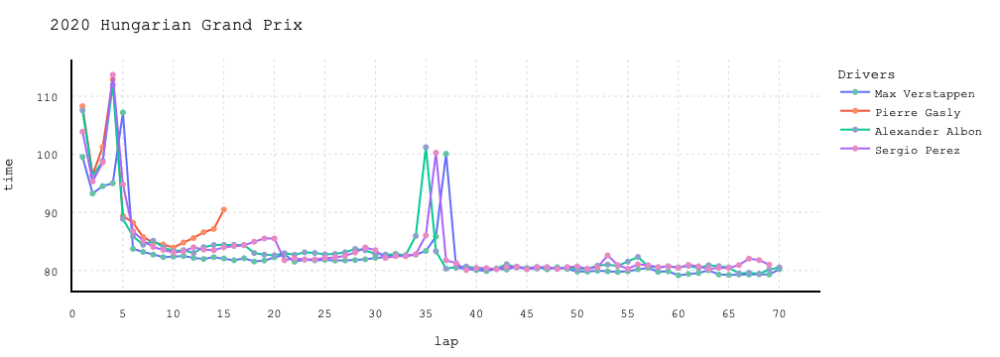

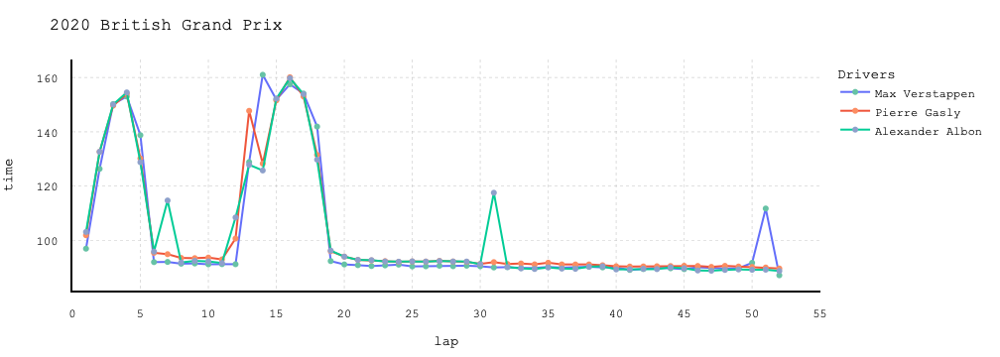

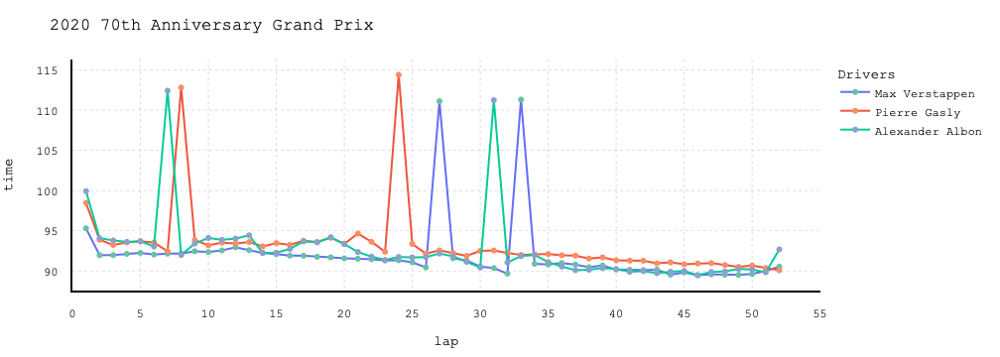

...

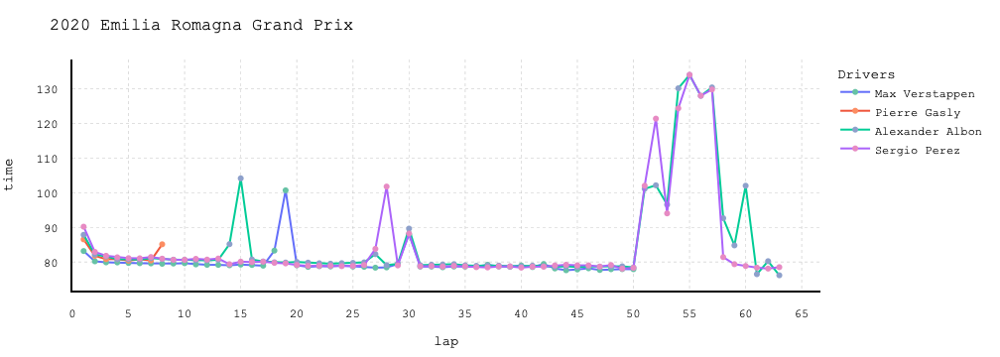

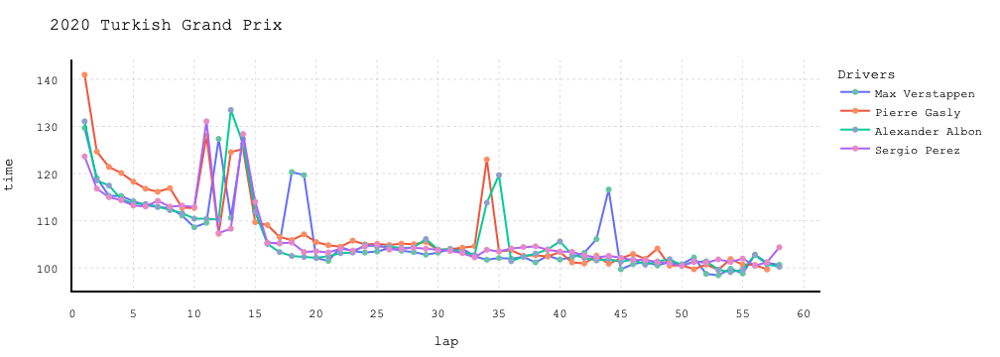

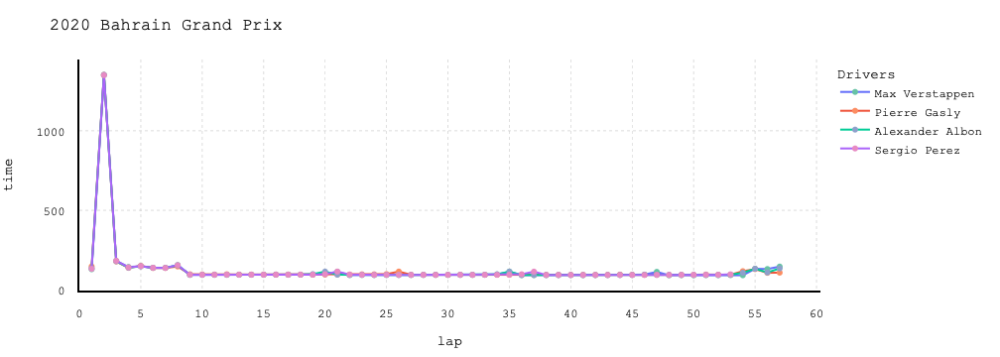

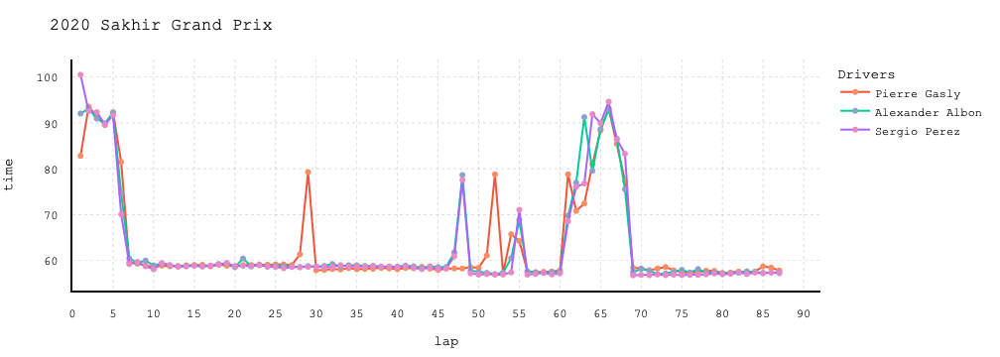

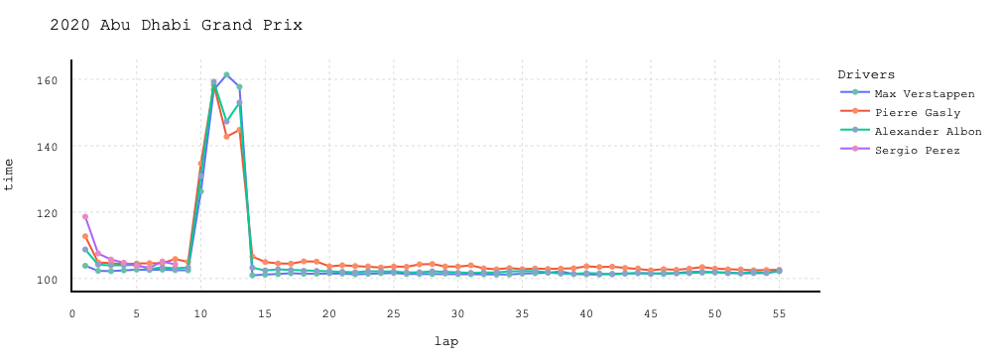

In [28]:

# RACES: GRAPH OBJECTS

#fig2019_1 = go.Figure()
#df_2019_AUST['color']='#ffa007'
#indices_gasly = [0,1,3,6,10,15]
#df.loc[indices,'A'] = 16

# Defining Colors for each driver 
indexRB_ver_20 = df_2020[(df_2020['code'] == 'VER')].index
df_2020.loc[indexRB_ver_20,'color'] = '#66c2a5'

indexRB_gasly_20 = df_2020[(df_2020['code'] == 'GAS')].index
df_2020.loc[indexRB_gasly_20,'color'] = '#fc8d62'

indexRB_albon_20 = df_2020[(df_2020['code'] == 'ALB')].index
df_2020.loc[indexRB_albon_20,'color'] = '#8da0cb'

indexRB_perez_20 = df_2020[(df_2020['code'] == 'PER')].index
df_2020.loc[indexRB_perez_20,'color'] = '#e78ac3'




# Austrian Grand Prix

df_2020_F_AUS = df_2020[(df_2020['name'] == 'Austrian Grand Prix')]
df_2020_AUS = df_2020_F_AUS.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2020_AUS = df_2020_AUS.sort_values(by="lap")



#fig25.add_trace(go.Scatter(x=df_2019_AUST['lap'], y=df_2019_AUST['seconds'],
 #                   mode='lines',
  #                  name='lines'))
#ver #ffa007
#gas #0035ff
#alb 00386b
df_2020_AUS_ver =df_2020_AUS[df_2020_AUS['code']=='VER']

df_2020_AUS_gas=df_2020_AUS[df_2020_AUS['code']=='GAS']

df_2020_AUS_alb =df_2020_AUS[df_2020_AUS['code']=='ALB']

df_2020_AUS_per =df_2020_AUS[df_2020_AUS['code']=='PER']

fig2020_1 = go.Figure()

fig2020_1.add_trace(go.Scatter(x=df_2020_AUS_ver['lap'], y=df_2020_AUS_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2020_AUS_ver['color'],
                           marker=dict(color=df_2020_AUS_ver['color'])
))
fig2020_1.add_trace(go.Scatter(x=df_2020_AUS_gas['lap'], y=df_2020_AUS_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2020_AUS_gas['color'],
                           marker=dict(color=df_2020_AUS_gas['color'])
))


fig2020_1.add_trace(go.Scatter(x=df_2020_AUS_alb['lap'], y=df_2020_AUS_alb['seconds'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=df_2020_AUS_alb['color'])
))

fig2020_1.add_trace(go.Scatter(x=df_2020_AUS_per['lap'], y=df_2020_AUS_per['seconds'],
                    mode='lines+markers',
                    name='Sergio Perez',
                           marker=dict(color=df_2020_AUS_per['color'])
))

fig2020_1.update_layout(layout)
fig2020_1.update_layout(title = '2020 Austrian Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2020_1.show()

# Styrian Grand Prix

df_2020_F_STY = df_2020[(df_2020['name'] == 'Styrian Grand Prix')]
df_2020_STY = df_2020_F_STY.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2020_STY = df_2020_STY.sort_values(by="lap")

df_2020_STY_ver =df_2020_STY[df_2020_STY['code']=='VER']

df_2020_STY_gas=df_2020_STY[df_2020_STY['code']=='GAS']

df_2020_STY_alb =df_2020_STY[df_2020_STY['code']=='ALB']

df_2020_STY_per =df_2020_STY[df_2020_STY['code']=='PER']

fig2020_2 = go.Figure()

fig2020_2.add_trace(go.Scatter(x=df_2020_STY_ver['lap'], y=df_2020_STY_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2020_STY_ver['color'],
                           marker=dict(color=df_2020_STY_ver['color'])
))
fig2020_2.add_trace(go.Scatter(x=df_2020_STY_gas['lap'], y=df_2020_STY_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2020_STY_gas['color'],
                           marker=dict(color=df_2020_STY_gas['color'])
))


fig2020_2.add_trace(go.Scatter(x=df_2020_STY_alb['lap'], y=df_2020_STY_alb['seconds'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=df_2020_STY_alb['color'])
))

fig2020_2.add_trace(go.Scatter(x=df_2020_STY_per['lap'], y=df_2020_STY_per['seconds'],
                    mode='lines+markers',
                    name='Sergio Perez',
                           marker=dict(color=df_2020_STY_per['color'])
))

fig2020_2.update_layout(layout)
fig2020_2.update_layout(title = '2020 Styrian Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2020_2.show()

# Hungarian Grand Prix

df_2020_F_HUN = df_2020[(df_2020['name'] == 'Hungarian Grand Prix')]
df_2020_HUN = df_2020_F_HUN.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2020_HUN = df_2020_HUN.sort_values(by="lap")

df_2020_HUN_ver =df_2020_HUN[df_2020_HUN['code']=='VER']

df_2020_HUN_gas=df_2020_HUN[df_2020_HUN['code']=='GAS']

df_2020_HUN_alb =df_2020_HUN[df_2020_HUN['code']=='ALB']

df_2020_HUN_per =df_2020_HUN[df_2020_HUN['code']=='PER']

fig2020_3 = go.Figure()

fig2020_3.add_trace(go.Scatter(x=df_2020_HUN_ver['lap'], y=df_2020_HUN_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2020_HUN_ver['color'],
                           marker=dict(color=df_2020_HUN_ver['color'])
))
fig2020_3.add_trace(go.Scatter(x=df_2020_HUN_gas['lap'], y=df_2020_HUN_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2020_HUN_gas['color'],
                           marker=dict(color=df_2020_HUN_gas['color'])
))


fig2020_3.add_trace(go.Scatter(x=df_2020_HUN_alb['lap'], y=df_2020_HUN_alb['seconds'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=df_2020_HUN_alb['color'])
))

fig2020_3.add_trace(go.Scatter(x=df_2020_HUN_per['lap'], y=df_2020_HUN_per['seconds'],
                    mode='lines+markers',
                    name='Sergio Perez',
                           marker=dict(color=df_2020_HUN_per['color'])
))

fig2020_3.update_layout(layout)
fig2020_3.update_layout(title = '2020 Hungarian Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2020_3.show()

# British Grand Prix

df_2020_F_BRIT = df_2020[(df_2020['name'] == 'British Grand Prix')]
df_2020_BRIT = df_2020_F_BRIT.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2020_BRIT = df_2020_BRIT.sort_values(by="lap")

df_2020_BRIT_ver =df_2020_BRIT[df_2020_BRIT['code']=='VER']

df_2020_BRIT_gas=df_2020_BRIT[df_2020_BRIT['code']=='GAS']

df_2020_BRIT_alb =df_2020_BRIT[df_2020_BRIT['code']=='ALB']

df_2020_BRIT_per =df_2020_BRIT[df_2020_BRIT['code']=='PER']

fig2020_4 = go.Figure()

fig2020_4.add_trace(go.Scatter(x=df_2020_BRIT_ver['lap'], y=df_2020_BRIT_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2020_BRIT_ver['color'],
                           marker=dict(color=df_2020_BRIT_ver['color'])
))
fig2020_4.add_trace(go.Scatter(x=df_2020_BRIT_gas['lap'], y=df_2020_BRIT_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2020_BRIT_gas['color'],
                           marker=dict(color=df_2020_BRIT_gas['color'])
))


fig2020_4.add_trace(go.Scatter(x=df_2020_BRIT_alb['lap'], y=df_2020_BRIT_alb['seconds'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=df_2020_BRIT_alb['color'])
))

fig2020_4.add_trace(go.Scatter(x=df_2020_BRIT_per['lap'], y=df_2020_BRIT_per['seconds'],
                    mode='lines+markers',
                    name='Sergio Perez',
                           marker=dict(color=df_2020_BRIT_per['color'])
))

fig2020_4.update_layout(layout)
fig2020_4.update_layout(title = '2020 British Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2020_4.show()


# 70th Anniversary Grand Prix

df_2020_F_70TH = df_2020[(df_2020['name'] == '70th Anniversary Grand Prix')]
df_2020_70TH = df_2020_F_70TH.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2020_70TH = df_2020_70TH.sort_values(by="lap")

df_2020_70TH_ver =df_2020_70TH[df_2020_70TH['code']=='VER']

df_2020_70TH_gas=df_2020_70TH[df_2020_70TH['code']=='GAS']

df_2020_70TH_alb =df_2020_70TH[df_2020_70TH['code']=='ALB']

df_2020_70TH_per =df_2020_70TH[df_2020_70TH['code']=='PER']

fig2020_5 = go.Figure()

fig2020_5.add_trace(go.Scatter(x=df_2020_70TH_ver['lap'], y=df_2020_70TH_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2020_70TH_ver['color'],
                           marker=dict(color=df_2020_70TH_ver['color'])
))
fig2020_5.add_trace(go.Scatter(x=df_2020_70TH_gas['lap'], y=df_2020_70TH_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2020_70TH_gas['color'],
                           marker=dict(color=df_2020_70TH_gas['color'])
))


fig2020_5.add_trace(go.Scatter(x=df_2020_70TH_alb['lap'], y=df_2020_70TH_alb['seconds'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=df_2020_70TH_alb['color'])
))

fig2020_5.add_trace(go.Scatter(x=df_2020_70TH_per['lap'], y=df_2020_70TH_per['seconds'],
                    mode='lines+markers',
                    name='Sergio Perez',
                           marker=dict(color=df_2020_70TH_per['color'])
))

fig2020_5.update_layout(layout)
fig2020_5.update_layout(title = '2020 70th Anniversary Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2020_5.show()

# Spanish Grand Prix

df_2020_F_ESP = df_2020[(df_2020['name'] == 'Spanish Grand Prix')]
df_2020_ESP = df_2020_F_ESP.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2020_ESP = df_2020_ESP.sort_values(by="lap")

df_2020_ESP_ver =df_2020_ESP[df_2020_ESP['code']=='VER']

df_2020_ESP_gas=df_2020_ESP[df_2020_ESP['code']=='GAS']

df_2020_ESP_alb =df_2020_ESP[df_2020_ESP['code']=='ALB']

df_2020_ESP_per =df_2020_ESP[df_2020_ESP['code']=='PER']

fig2020_6 = go.Figure()

fig2020_6.add_trace(go.Scatter(x=df_2020_ESP_ver['lap'], y=df_2020_ESP_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2020_ESP_ver['color'],
                           marker=dict(color=df_2020_ESP_ver['color'])
))
fig2020_6.add_trace(go.Scatter(x=df_2020_ESP_gas['lap'], y=df_2020_ESP_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2020_ESP_gas['color'],
                           marker=dict(color=df_2020_ESP_gas['color'])
))


fig2020_6.add_trace(go.Scatter(x=df_2020_ESP_alb['lap'], y=df_2020_ESP_alb['seconds'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=df_2020_ESP_alb['color'])
))

fig2020_6.add_trace(go.Scatter(x=df_2020_ESP_per['lap'], y=df_2020_ESP_per['seconds'],
                    mode='lines+markers',
                    name='Sergio Perez',
                           marker=dict(color=df_2020_ESP_per['color'])
))

fig2020_6.update_layout(layout)
fig2020_6.update_layout(title = '2020 Spanish Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2020_6.show()

# Belgian Grand Prix

df_2020_F_BEL = df_2020[(df_2020['name'] == 'Belgian Grand Prix')]
df_2020_BEL = df_2020_F_BEL.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2020_BEL = df_2020_BEL.sort_values(by="lap")

df_2020_BEL_ver =df_2020_BEL[df_2020_BEL['code']=='VER']

df_2020_BEL_gas=df_2020_BEL[df_2020_BEL['code']=='GAS']

df_2020_BEL_alb =df_2020_BEL[df_2020_BEL['code']=='ALB']

df_2020_BEL_per =df_2020_BEL[df_2020_BEL['code']=='PER']

fig2020_7 = go.Figure()

fig2020_7.add_trace(go.Scatter(x=df_2020_BEL_ver['lap'], y=df_2020_BEL_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2020_BEL_ver['color'],
                           marker=dict(color=df_2020_BEL_ver['color'])
))
fig2020_7.add_trace(go.Scatter(x=df_2020_BEL_gas['lap'], y=df_2020_BEL_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2020_BEL_gas['color'],
                           marker=dict(color=df_2020_BEL_gas['color'])
))


fig2020_7.add_trace(go.Scatter(x=df_2020_BEL_alb['lap'], y=df_2020_BEL_alb['seconds'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=df_2020_BEL_alb['color'])
))

fig2020_7.add_trace(go.Scatter(x=df_2020_BEL_per['lap'], y=df_2020_BEL_per['seconds'],
                    mode='lines+markers',
                    name='Sergio Perez',
                           marker=dict(color=df_2020_BEL_per['color'])
))

fig2020_7.update_layout(layout)
fig2020_7.update_layout(title = '2020 Belgian Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2020_7.show()

# Italian Grand Prix

df_2020_F_ITA = df_2020[(df_2020['name'] == 'Italian Grand Prix')]
df_2020_ITA = df_2020_F_ITA.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2020_ITA = df_2020_ITA.sort_values(by="lap")

df_2020_ITA_ver =df_2020_ITA[df_2020_ITA['code']=='VER']

df_2020_ITA_gas=df_2020_ITA[df_2020_ITA['code']=='GAS']

df_2020_ITA_alb =df_2020_ITA[df_2020_ITA['code']=='ALB']

df_2020_ITA_per =df_2020_ITA[df_2020_ITA['code']=='PER']

fig2020_8 = go.Figure()

fig2020_8.add_trace(go.Scatter(x=df_2020_ITA_ver['lap'], y=df_2020_ITA_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2020_ITA_ver['color'],
                           marker=dict(color=df_2020_ITA_ver['color'])
))
fig2020_8.add_trace(go.Scatter(x=df_2020_ITA_gas['lap'], y=df_2020_ITA_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2020_ITA_gas['color'],
                           marker=dict(color=df_2020_ITA_gas['color'])
))


fig2020_8.add_trace(go.Scatter(x=df_2020_ITA_alb['lap'], y=df_2020_ITA_alb['seconds'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=df_2020_ITA_alb['color'])
))

fig2020_8.add_trace(go.Scatter(x=df_2020_ITA_per['lap'], y=df_2020_ITA_per['seconds'],
                    mode='lines+markers',
                    name='Sergio Perez',
                           marker=dict(color=df_2020_ITA_per['color'])
))

fig2020_8.update_layout(layout)
fig2020_8.update_layout(title = '2020 Italian Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2020_8.show()

# Tuscan Grand Prix

df_2020_F_TUS = df_2020[(df_2020['name'] == 'Tuscan Grand Prix')]
df_2020_TUS = df_2020_F_TUS.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2020_TUS = df_2020_TUS.sort_values(by="lap")

df_2020_TUS_ver =df_2020_TUS[df_2020_TUS['code']=='VER']

df_2020_TUS_gas=df_2020_TUS[df_2020_TUS['code']=='GAS']

df_2020_TUS_alb =df_2020_TUS[df_2020_TUS['code']=='ALB']

df_2020_TUS_per =df_2020_TUS[df_2020_TUS['code']=='PER']

fig2020_9 = go.Figure()

fig2020_9.add_trace(go.Scatter(x=df_2020_TUS_ver['lap'], y=df_2020_TUS_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2020_TUS_ver['color'],
                           marker=dict(color=df_2020_TUS_ver['color'])
))
fig2020_9.add_trace(go.Scatter(x=df_2020_TUS_gas['lap'], y=df_2020_TUS_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2020_TUS_gas['color'],
                           marker=dict(color=df_2020_TUS_gas['color'])
))


fig2020_9.add_trace(go.Scatter(x=df_2020_TUS_alb['lap'], y=df_2020_TUS_alb['seconds'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=df_2020_TUS_alb['color'])
))

fig2020_9.add_trace(go.Scatter(x=df_2020_TUS_per['lap'], y=df_2020_TUS_per['seconds'],
                    mode='lines+markers',
                    name='Sergio Perez',
                           marker=dict(color=df_2020_TUS_per['color'])
))

fig2020_9.update_layout(layout)
fig2020_9.update_layout(title = '2020 Tuscan Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2020_9.show()

# Russian Grand Prix

df_2020_F_RUS = df_2020[(df_2020['name'] == 'Russian Grand Prix')]
df_2020_RUS = df_2020_F_RUS.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2020_RUS = df_2020_RUS.sort_values(by="lap")


df_2020_RUS_ver =df_2020_RUS[df_2020_RUS['code']=='VER']

df_2020_RUS_gas=df_2020_RUS[df_2020_RUS['code']=='GAS']

df_2020_RUS_alb =df_2020_RUS[df_2020_RUS['code']=='ALB']

df_2020_RUS_per =df_2020_RUS[df_2020_RUS['code']=='PER']

fig2020_10 = go.Figure()

fig2020_10.add_trace(go.Scatter(x=df_2020_RUS_ver['lap'], y=df_2020_RUS_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2020_RUS_ver['color'],
                           marker=dict(color=df_2020_RUS_ver['color'])
))
fig2020_10.add_trace(go.Scatter(x=df_2020_RUS_gas['lap'], y=df_2020_RUS_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2020_RUS_gas['color'],
                           marker=dict(color=df_2020_RUS_gas['color'])
))


fig2020_10.add_trace(go.Scatter(x=df_2020_RUS_alb['lap'], y=df_2020_RUS_alb['seconds'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=df_2020_RUS_alb['color'])
))

fig2020_10.add_trace(go.Scatter(x=df_2020_RUS_per['lap'], y=df_2020_RUS_per['seconds'],
                    mode='lines+markers',
                    name='Sergio Perez',
                           marker=dict(color=df_2020_RUS_per['color'])
))

fig2020_10.update_layout(layout)
fig2020_10.update_layout(title = '2020 Russian Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2020_10.show()


# Eifel Grand Prix

df_2020_F_EIF = df_2020[(df_2020['name'] == 'Eifel Grand Prix')]
df_2020_EIF = df_2020_F_EIF.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2020_EIF = df_2020_EIF.sort_values(by="lap")

df_2020_EIF_ver =df_2020_EIF[df_2020_EIF['code']=='VER']

df_2020_EIF_gas=df_2020_EIF[df_2020_EIF['code']=='GAS']

df_2020_EIF_alb =df_2020_EIF[df_2020_EIF['code']=='ALB']

df_2020_EIF_per =df_2020_EIF[df_2020_EIF['code']=='PER']

fig2020_11 = go.Figure()

fig2020_11.add_trace(go.Scatter(x=df_2020_EIF_ver['lap'], y=df_2020_EIF_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2020_EIF_ver['color'],
                           marker=dict(color=df_2020_EIF_ver['color'])
))
fig2020_11.add_trace(go.Scatter(x=df_2020_EIF_gas['lap'], y=df_2020_EIF_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2020_EIF_gas['color'],
                           marker=dict(color=df_2020_EIF_gas['color'])
))


fig2020_11.add_trace(go.Scatter(x=df_2020_EIF_alb['lap'], y=df_2020_EIF_alb['seconds'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=df_2020_EIF_alb['color'])
))

fig2020_11.add_trace(go.Scatter(x=df_2020_EIF_per['lap'], y=df_2020_EIF_per['seconds'],
                    mode='lines+markers',
                    name='Sergio Perez',
                           marker=dict(color=df_2020_EIF_per['color'])
))

fig2020_11.update_layout(layout)
fig2020_11.update_layout(title = '2020 Eifel Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2020_11.show()

# Portuguese Grand Prix

df_2020_F_POR = df_2020[(df_2020['name'] == 'Portuguese Grand Prix')]
df_2020_POR = df_2020_F_POR.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2020_POR = df_2020_POR.sort_values(by="lap")

df_2020_POR_ver =df_2020_POR[df_2020_POR['code']=='VER']

df_2020_POR_gas=df_2020_POR[df_2020_POR['code']=='GAS']

df_2020_POR_alb =df_2020_POR[df_2020_POR['code']=='ALB']

df_2020_POR_per =df_2020_POR[df_2020_POR['code']=='PER']

fig2020_12 = go.Figure()

fig2020_12.add_trace(go.Scatter(x=df_2020_POR_ver['lap'], y=df_2020_POR_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2020_POR_ver['color'],
                           marker=dict(color=df_2020_POR_ver['color'])
))
fig2020_12.add_trace(go.Scatter(x=df_2020_POR_gas['lap'], y=df_2020_POR_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2020_POR_gas['color'],
                           marker=dict(color=df_2020_POR_gas['color'])
))


fig2020_12.add_trace(go.Scatter(x=df_2020_POR_alb['lap'], y=df_2020_POR_alb['seconds'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=df_2020_POR_alb['color'])
))

fig2020_12.add_trace(go.Scatter(x=df_2020_POR_per['lap'], y=df_2020_POR_per['seconds'],
                    mode='lines+markers',
                    name='Sergio Perez',
                           marker=dict(color=df_2020_POR_per['color'])
))

fig2020_12.update_layout(layout)
fig2020_12.update_layout(title = '2020 Portuguese Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2020_12.show()

# Emilia Romagna Grand Prix

df_2020_F_EMI = df_2020[(df_2020['name'] == 'Emilia Romagna Grand Prix')]
df_2020_EMI = df_2020_F_EMI.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2020_EMI = df_2020_EMI.sort_values(by="lap")


df_2020_EMI_ver =df_2020_EMI[df_2020_EMI['code']=='VER']

df_2020_EMI_gas=df_2020_EMI[df_2020_EMI['code']=='GAS']

df_2020_EMI_alb =df_2020_EMI[df_2020_EMI['code']=='ALB']

df_2020_EMI_per =df_2020_EMI[df_2020_EMI['code']=='PER']

fig2020_13 = go.Figure()

fig2020_13.add_trace(go.Scatter(x=df_2020_EMI_ver['lap'], y=df_2020_EMI_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2020_EMI_ver['color'],
                           marker=dict(color=df_2020_EMI_ver['color'])
))
fig2020_13.add_trace(go.Scatter(x=df_2020_EMI_gas['lap'], y=df_2020_EMI_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2020_EMI_gas['color'],
                           marker=dict(color=df_2020_EMI_gas['color'])
))


fig2020_13.add_trace(go.Scatter(x=df_2020_EMI_alb['lap'], y=df_2020_EMI_alb['seconds'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=df_2020_EMI_alb['color'])
))

fig2020_13.add_trace(go.Scatter(x=df_2020_EMI_per['lap'], y=df_2020_EMI_per['seconds'],
                    mode='lines+markers',
                    name='Sergio Perez',
                           marker=dict(color=df_2020_EMI_per['color'])
))

fig2020_13.update_layout(layout)
fig2020_13.update_layout(title = '2020 Emilia Romagna Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2020_13.show()


# Turkish Grand Prix

df_2020_F_TUR = df_2020[(df_2020['name'] == 'Turkish Grand Prix')]
df_2020_TUR = df_2020_F_TUR.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2020_TUR = df_2020_TUR.sort_values(by="lap")

df_2020_TUR_ver =df_2020_TUR[df_2020_TUR['code']=='VER']

df_2020_TUR_gas=df_2020_TUR[df_2020_TUR['code']=='GAS']

df_2020_TUR_alb =df_2020_TUR[df_2020_TUR['code']=='ALB']

df_2020_TUR_per =df_2020_TUR[df_2020_TUR['code']=='PER']

fig2020_14 = go.Figure()

fig2020_14.add_trace(go.Scatter(x=df_2020_TUR_ver['lap'], y=df_2020_TUR_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2020_TUR_ver['color'],
                           marker=dict(color=df_2020_TUR_ver['color'])
))
fig2020_14.add_trace(go.Scatter(x=df_2020_TUR_gas['lap'], y=df_2020_TUR_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2020_TUR_gas['color'],
                           marker=dict(color=df_2020_TUR_gas['color'])
))


fig2020_14.add_trace(go.Scatter(x=df_2020_TUR_alb['lap'], y=df_2020_TUR_alb['seconds'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=df_2020_TUR_alb['color'])
))

fig2020_14.add_trace(go.Scatter(x=df_2020_TUR_per['lap'], y=df_2020_TUR_per['seconds'],
                    mode='lines+markers',
                    name='Sergio Perez',
                           marker=dict(color=df_2020_TUR_per['color'])
))

fig2020_14.update_layout(layout)
fig2020_14.update_layout(title = '2020 Turkish Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2020_14.show()

# Bahrain Grand Prix

df_2020_F_BAH = df_2020[(df_2020['name'] == 'Bahrain Grand Prix')]
df_2020_BAH = df_2020_F_BAH.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2020_BAH = df_2020_BAH.sort_values(by="lap")

df_2020_BAH_ver =df_2020_BAH[df_2020_BAH['code']=='VER']

df_2020_BAH_gas=df_2020_BAH[df_2020_BAH['code']=='GAS']

df_2020_BAH_alb =df_2020_BAH[df_2020_BAH['code']=='ALB']

df_2020_BAH_per =df_2020_BAH[df_2020_BAH['code']=='PER']

fig2020_15 = go.Figure()

fig2020_15.add_trace(go.Scatter(x=df_2020_BAH_ver['lap'], y=df_2020_BAH_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2020_BAH_ver['color'],
                           marker=dict(color=df_2020_BAH_ver['color'])
))
fig2020_15.add_trace(go.Scatter(x=df_2020_BAH_gas['lap'], y=df_2020_BAH_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2020_BAH_gas['color'],
                           marker=dict(color=df_2020_BAH_gas['color'])
))


fig2020_15.add_trace(go.Scatter(x=df_2020_BAH_alb['lap'], y=df_2020_BAH_alb['seconds'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=df_2020_BAH_alb['color'])
))

fig2020_15.add_trace(go.Scatter(x=df_2020_BAH_per['lap'], y=df_2020_BAH_per['seconds'],
                    mode='lines+markers',
                    name='Sergio Perez',
                           marker=dict(color=df_2020_BAH_per['color'])
))

fig2020_15.update_layout(layout)
fig2020_15.update_layout(title = '2020 Bahrain Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2020_15.show()

# Sakhir Grand Prix

df_2020_F_SAK = df_2020[(df_2020['name'] == 'Sakhir Grand Prix')]
df_2020_SAK = df_2020_F_SAK.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2020_SAK = df_2020_SAK.sort_values(by="lap")


df_2020_SAK_ver =df_2020_SAK[df_2020_SAK['code']=='VER']

df_2020_SAK_gas=df_2020_SAK[df_2020_SAK['code']=='GAS']

df_2020_SAK_alb =df_2020_SAK[df_2020_SAK['code']=='ALB']

df_2020_SAK_per =df_2020_SAK[df_2020_SAK['code']=='PER']

fig2020_16 = go.Figure()

fig2020_16.add_trace(go.Scatter(x=df_2020_SAK_ver['lap'], y=df_2020_SAK_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2020_SAK_ver['color'],
                           marker=dict(color=df_2020_SAK_ver['color'])
))
fig2020_16.add_trace(go.Scatter(x=df_2020_SAK_gas['lap'], y=df_2020_SAK_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2020_SAK_gas['color'],
                           marker=dict(color=df_2020_SAK_gas['color'])
))


fig2020_16.add_trace(go.Scatter(x=df_2020_SAK_alb['lap'], y=df_2020_SAK_alb['seconds'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=df_2020_SAK_alb['color'])
))

fig2020_16.add_trace(go.Scatter(x=df_2020_SAK_per['lap'], y=df_2020_SAK_per['seconds'],
                    mode='lines+markers',
                    name='Sergio Perez',
                           marker=dict(color=df_2020_SAK_per['color'])
))

fig2020_16.update_layout(layout)
fig2020_16.update_layout(title = '2020 Sakhir Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2020_16.show()

# Abu Dhabi Grand Prix

df_2020_F_ABH = df_2020[(df_2020['name'] == 'Abu Dhabi Grand Prix')]
df_2020_ABH  = df_2020_F_ABH.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2020_ABH  = df_2020_ABH.sort_values(by="lap")

df_2020_ABH_ver =df_2020_ABH[df_2020_ABH['code']=='VER']

df_2020_ABH_gas=df_2020_ABH[df_2020_ABH['code']=='GAS']

df_2020_ABH_alb =df_2020_ABH[df_2020_ABH['code']=='ALB']

df_2020_ABH_per =df_2020_ABH[df_2020_ABH['code']=='PER']

fig2020_17 = go.Figure()

fig2020_17.add_trace(go.Scatter(x=df_2020_ABH_ver['lap'], y=df_2020_ABH_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2020_ABH_ver['color'],
                           marker=dict(color=df_2020_ABH_ver['color'])
))
fig2020_17.add_trace(go.Scatter(x=df_2020_ABH_gas['lap'], y=df_2020_ABH_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2020_ABH_gas['color'],
                           marker=dict(color=df_2020_ABH_gas['color'])
))


fig2020_17.add_trace(go.Scatter(x=df_2020_ABH_alb['lap'], y=df_2020_ABH_alb['seconds'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=df_2020_ABH_alb['color'])
))

fig2020_17.add_trace(go.Scatter(x=df_2020_ABH_per['lap'], y=df_2020_ABH_per['seconds'],
                    mode='lines+markers',
                    name='Sergio Perez',
                           marker=dict(color=df_2020_ABH_per['color'])
))

fig2020_17.update_layout(layout)
fig2020_17.update_layout(title = '2020 Abu Dhabi Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2020_17.show()


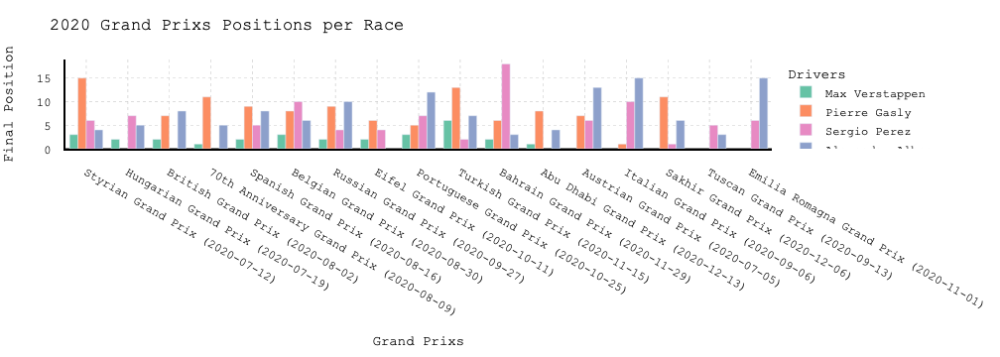

In [108]:
# Positions 2020 per Race
df_results_2020 = df_results[(df_results['year']==2020)&((df_results['code']=='VER')|(df_results['code']=='GAS')|(df_results['code']=='ALB')|(df_results['code']=='PER'))]
df_results_2020= df_results_2020.sort_values(by="date")
 

    
indexRB_ver_20 = df_results_2020[(df_results_2020['code'] == 'VER')].index
df_results_2020.loc[indexRB_ver_20,'color'] = '#66c2a5'

indexRB_gasly_20 = df_results_2020[(df_results_2020['code'] == 'GAS')].index
df_results_2020.loc[indexRB_gasly_20,'color'] = '#fc8d62'

indexRB_albon_20 = df_results_2020[(df_results_2020['code'] == 'ALB')].index
df_results_2020.loc[indexRB_albon_20,'color'] = '#8da0cb'

indexRB_perez_20 = df_results_2020[(df_results_2020['code'] == 'PER')].index
df_results_2020.loc[indexRB_perez_20,'color'] = '#e78ac3'



df_results_2020_ver =df_results_2020[df_results_2020['code']=='VER']
df_results_2020_ver= df_results_2020_ver.sort_values(by="date")
df_results_2020_ver['corrida']=df_results_2020_ver['name']+' ('+df_results_2020_ver['date']+')'

df_results_2020_gas =df_results_2020[df_results_2020['code']=='GAS']
df_results_2020_gas= df_results_2020_gas.sort_values(by="date")
df_results_2020_gas['corrida']=df_results_2020_gas['name']+' ('+df_results_2020_gas['date']+')'

df_results_2020_per =df_results_2020[df_results_2020['code']=='PER']
df_results_2020_per= df_results_2020_per.sort_values(by="date")
df_results_2020_per['corrida']=df_results_2020_per['name']+' ('+df_results_2020_per['date']+')'

df_results_2020_alb =df_results_2020[df_results_2020['code']=='ALB']
df_results_2020_alb= df_results_2020_alb.sort_values(by="date")
df_results_2020_alb['corrida']=df_results_2020_alb['name']+' ('+df_results_2020_alb['date']+')'

fig_results_2020 = go.Figure()

fig_results_2020 = go.Figure(data=[
    go.Bar(name ='Max Verstappen',x=df_results_2020_ver['corrida'], y=df_results_2020_ver['position'],marker_color=df_results_2020_ver['color']),
    go.Bar(name='Pierre Gasly',x=df_results_2020_gas['corrida'], y=df_results_2020_gas['position'],marker_color=df_results_2020_gas['color']),
    go.Bar(name='Sergio Perez',x=df_results_2020_per['corrida'], y=df_results_2020_per['position'],marker_color=df_results_2020_per['color']),
    go.Bar(name='Alexander Albon',x=df_results_2020_alb['corrida'], y=df_results_2020_alb['position'],marker_color=df_results_2020_alb['color']),
    
])

fig_results_2020.update_layout(layout_results)
fig_results_2020.update_layout(title = '2020 Grand Prixs Positions per Race',xaxis_title ="Grand Prixs",yaxis_title ="Final Position",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig_results_2020.show()


# Plotly EXPRESS
#fig = px.bar(df_results_2020, x='name', y='position'
             #,hover_data=['driverRef', 'position']
 #            , color='driverRef', height=100,barmode='group', title = 'Position 2020')
#fig.update_layout({
#'plot_bgcolor': 'rgba(0, 0, 0, 0)',
#'paper_bgcolor': 'rgba(0, 0, 0, 0)',
#})

#fig.show()


/var/folders/s8/zqdvt79d34nd7fs16cr64b7r0000gn/T/ipykernel_3968/2599556190.py:20: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/s8/zqdvt79d34nd7fs16cr64b7r0000gn/T/ipykernel_3968/2599556190.py:23: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/s8/zqdvt79d34nd7fs16cr64b7r0000gn/T/ipykernel_3968/2599556190.py:26: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the d

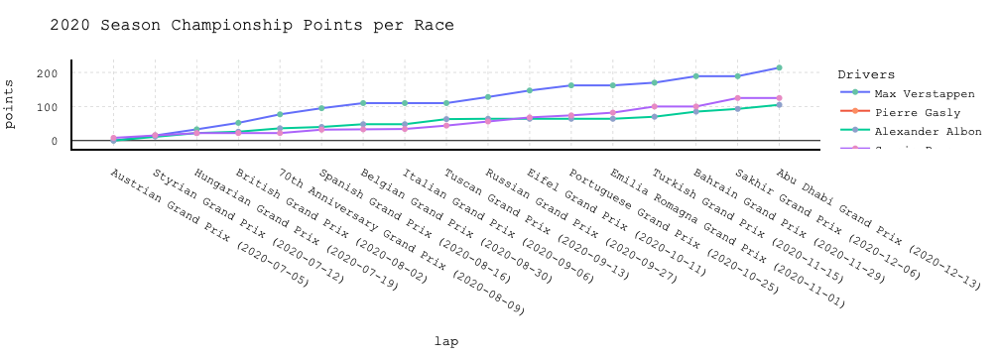

In [88]:
# 2020 Season Points per Race


season_Points_2020 = season_Points_2020.query("code in ['GAS', 'VER','ALB','PER']")
season_Points_2020 = season_Points_2020.sort_values(by="date")

indexRB_ver_20 = season_Points_2020[(season_Points_2020['code'] == 'VER')].index
season_Points_2020.loc[indexRB_ver_20,'color'] = '#66c2a5'

indexRB_gasly_20 = season_Points_2020[(season_Points_2020['code'] == 'GAS')].index
season_Points_2020.loc[indexRB_gasly_20,'color'] = '#fc8d62'

indexRB_albon_20 = season_Points_2020[(season_Points_2020['code'] == 'ALB')].index
season_Points_2020.loc[indexRB_albon_20,'color'] = '#8da0cb'

indexRB_perez_20 = season_Points_2020[(season_Points_2020['code'] == 'PER')].index
season_Points_2020.loc[indexRB_perez_20,'color'] = '#e78ac3'

season_Points_2020_ver =season_Points_2020[season_Points_2020['code']=='VER']
season_Points_2020_ver['corrida']=season_Points_2020_ver['name']+' ('+season_Points_2020_ver['date']+')'

season_Points_2020_gas =season_Points_2020[season_Points_2020['code']=='GAS']
season_Points_2020_gas['corrida']=season_Points_2019_gas['name']+' ('+season_Points_2019_gas['date']+')'

season_Points_2020_alb =season_Points_2020[season_Points_2020['code']=='ALB']
season_Points_2020_alb['corrida']=season_Points_2020_alb['name']+' ('+season_Points_2020_alb['date']+')'

season_Points_2020_per =season_Points_2020[season_Points_2020['code']=='PER']
season_Points_2020_per['corrida']=season_Points_2020_per['name']+' ('+season_Points_2020_per['date']+')'

fig2020_season_points = go.Figure()

fig2020_season_points.add_trace(go.Scatter(x=season_Points_2020_ver['corrida'], y=season_Points_2020_ver['points'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = season_Points_2020_ver['color'],
                           marker=dict(color=season_Points_2020_ver['color'])
))
fig2020_season_points.add_trace(go.Scatter(x=season_Points_2020_gas['corrida'], y=season_Points_2020_gas['points'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = season_Points_2020_gas['color'],
                           marker=dict(color=season_Points_2020_gas['color'])
))


fig2020_season_points.add_trace(go.Scatter(x=season_Points_2020_alb['corrida'], y=season_Points_2020_alb['points'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=season_Points_2020_alb['color'])
))

fig2020_season_points.add_trace(go.Scatter(x=season_Points_2020_per['corrida'], y=season_Points_2020_per['points'],
                    mode='lines+markers',
                    name='Sergio Perez',
                           marker=dict(color=season_Points_2020_per['color'])
))

fig2020_season_points.update_layout(layout_results)
fig2020_season_points.update_layout(title = '2020 Season Championship Points per Race ',xaxis_title ="lap",yaxis_title ="points",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2020_season_points.show()

# Plotly Express
#fig = px.line(season_Points_2020_, x='name', y='points', color='code', markers=True, title = '2020 Red Bull WDC')
#fig.update_layout({
#'plot_bgcolor': 'rgba(0, 0, 0, 0)',
#'paper_bgcolor': 'rgba(0, 0, 0, 0)',
#})
#fig.show()

# 2021
##### Verstappen - Main driver
##### Checo Pérez - Teammate 
##### Gasly - Alpha Tauri
##### Albon - RB reserve driver


In [89]:
# 2021 Season races info

df_laps_2021 = df[(df['year']==2021)&((df['code']=='VER')|(df['code']=='GAS'))|(df['driverRef']=='albon')|(df['driverRef']=='perez')].copy()
df_laps_2021.rename(columns={'position':'lap position'},inplace=True)
df_laps_2021 = df_laps_2021.merge(results[['raceId','driverId','position']],how='left',on=['raceId','driverId'])
df_laps_2021 = df_laps_2021.merge(pit_stops[['raceId','driverId','lap','stop']],how='left',on=['raceId','driverId','lap'])
df_laps_2021['stop'].fillna(0,inplace=True)
df_laps_2021['stop']=df_laps_2021['stop'].astype(int)
df_laps_2021['stop'][df_laps_2021['stop']==0] = ''
df_laps_2021['seconds']=df_laps_2021['milliseconds']/1000
df_laps_2021

/var/folders/s8/zqdvt79d34nd7fs16cr64b7r0000gn/T/ipykernel_3968/2606626810.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,raceId,driverId,lap,lap position,time,milliseconds,code,driverRef,name,date,year,position,stop,seconds
0,841,815,1,14,1:52.663,112663,PER,perez,Australian Grand Prix,2011-03-27,2011,\N,,112.663
1,841,815,2,14,1:37.576,97576,PER,perez,Australian Grand Prix,2011-03-27,2011,\N,,97.576
2,841,815,3,14,1:36.216,96216,PER,perez,Australian Grand Prix,2011-03-27,2011,\N,,96.216
3,841,815,4,14,1:35.617,95617,PER,perez,Australian Grand Prix,2011-03-27,2011,\N,,95.617
4,841,815,5,14,1:35.999,95999,PER,perez,Australian Grand Prix,2011-03-27,2011,\N,,95.999
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17776,1086,848,65,18,1:26.377,86377,ALB,albon,Hungarian Grand Prix,2022-07-31,2022,17,,86.377
17777,1086,848,66,17,1:34.127,94127,ALB,albon,Hungarian Grand Prix,2022-07-31,2022,17,,94.127
17778,1086,848,67,17,1:49.545,109545,ALB,albon,Hungarian Grand Prix,2022-07-31,2022,17,,109.545
17779,1086,848,68,16,1:28.621,88621,ALB,albon,Hungarian Grand Prix,2022-07-31,2022,17,,88.621


In [90]:
# 2021 Season
df_2021 = df_laps_2021[df_laps_2021['year'] == 2021]
df_2021

,raceId,driverId,lap,lap position,time,milliseconds,code,driverRef,name,date,year,position,stop,seconds
12882,1052,830,1,1,1:58.245,118245,VER,max_verstappen,Bahrain Grand Prix,2021-03-28,2021,2,,118.245
12883,1052,830,2,1,2:22.406,142406,VER,max_verstappen,Bahrain Grand Prix,2021-03-28,2021,2,,142.406
12884,1052,830,3,1,2:38.001,158001,VER,max_verstappen,Bahrain Grand Prix,2021-03-28,2021,2,,158.001
12885,1052,830,4,1,1:44.343,104343,VER,max_verstappen,Bahrain Grand Prix,2021-03-28,2021,2,,104.343
12886,1052,830,5,1,1:44.629,104629,VER,max_verstappen,Bahrain Grand Prix,2021-03-28,2021,2,,104.629
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16400,1073,842,54,6,1:50.389,110389,GAS,gasly,Abu Dhabi Grand Prix,2021-12-12,2021,5,2,110.389
16401,1073,842,55,7,2:00.394,120394,GAS,gasly,Abu Dhabi Grand Prix,2021-12-12,2021,5,,120.394
16402,1073,842,56,6,2:02.485,122485,GAS,gasly,Abu Dhabi Grand Prix,2021-12-12,2021,5,,122.485
16403,1073,842,57,6,2:16.957,136957,GAS,gasly,Abu Dhabi Grand Prix,2021-12-12,2021,5,,136.957


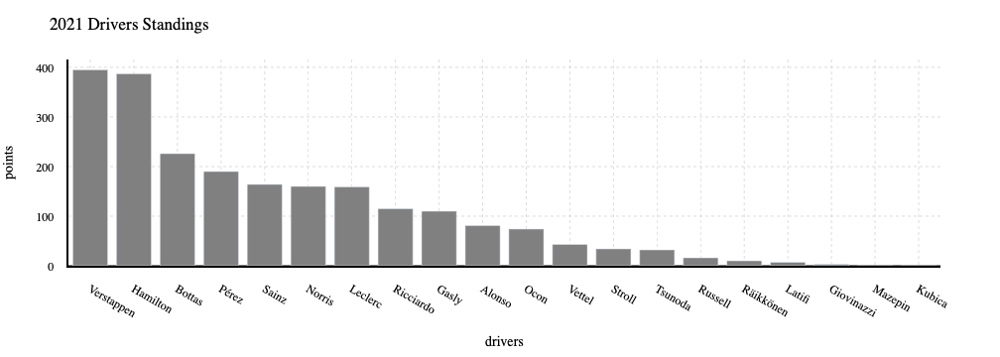

In [91]:
# 2021 Season - Driver Standings

h = driver_position.merge(circuits,left_on='circuitId',right_on='circuitId',how = 'left')
h.rename(columns={'name_y':'circuit_name'},inplace=True)
viz = h.loc[:,['date','year','circuit_name','surname','points','wins']]

viz.dropna(inplace = True)

viz.points = viz.points.astype('int64')
viz.wins = viz.wins.astype('int64')
viz.date = pd.to_datetime(viz.date)
    
top = viz[viz.loc[:,'year'] == 2021]
top = top.groupby(['surname'])[['points','wins']].max().sort_values('points',ascending = False).head(20).reset_index()

fig = go.Figure()
fig.add_trace(go.Bar(
    x=top['surname'],
    y=top['points'],
    name='2021 Drivers Standings',
    marker_color='grey'
))
fig.update_layout(layout_results)
fig.update_layout(title ="2021 Drivers Standings", xaxis_title="drivers",yaxis_title="points")


# Plotly EXPRESS
#fig = px.bar(top, x='surname', y='points',hover_data=['wins'], color='points',height=400,color_continuous_scale= 'turbo')
#fig.update_traces(textfont_size=20,marker=dict(line=dict(color='#000000', width=2)))
#fig.update_xaxes(showgrid=False)
#fig.update_yaxes(showgrid=False)
#fig.update_layout({
#'plot_bgcolor': 'rgba(0, 0, 0, 0)',
#'paper_bgcolor': 'rgba(0, 0, 0, 0)',
#})

fig.show()

In [92]:
# 2021 Season - drivers selected 
df_2021['driverRef'].unique()

array(['max_verstappen', 'gasly', 'perez'], dtype=object)

In [93]:
# 2020 Season - All Grand Prix
df_2021['name'].unique()

array(['Bahrain Grand Prix', 'Emilia Romagna Grand Prix',
       'Portuguese Grand Prix', 'Spanish Grand Prix', 'Monaco Grand Prix',
       'Azerbaijan Grand Prix', 'French Grand Prix', 'Styrian Grand Prix',
       'Austrian Grand Prix', 'British Grand Prix',
       'Hungarian Grand Prix', 'Belgian Grand Prix', 'Dutch Grand Prix',
       'Italian Grand Prix', 'Russian Grand Prix', 'Turkish Grand Prix',
       'United States Grand Prix', 'Mexico City Grand Prix',
       'São Paulo Grand Prix', 'Qatar Grand Prix',
       'Saudi Arabian Grand Prix', 'Abu Dhabi Grand Prix'], dtype=object)

In [ ]:

#   RACES: PLOTLY EXPRESS



#'Bahrain Grand Prix', 'Emilia Romagna Grand Prix',
 #      'Portuguese Grand Prix', 'Spanish Grand Prix', 'Monaco Grand Prix',
  #     'Azerbaijan Grand Prix', 'French Grand Prix', 'Styrian Grand Prix',
   #    'Austrian Grand Prix', 'British Grand Prix',
    #   'Hungarian Grand Prix', 'Belgian Grand Prix', 'Dutch Grand Prix',
     #  'Italian Grand Prix', 'Russian Grand Prix', 'Turkish Grand Prix',
      # 'United States Grand Prix', 'Mexico City Grand Prix',
       #'São Paulo Grand Prix', 'Qatar Grand Prix',
       #'Saudi Arabian Grand Prix', 'Abu Dhabi Grand Prix'
    

# Bahrain Grand Prix (1)

df_2021_F_BAH = df_2021[(df_2021['name'] == 'Bahrain Grand Prix')]
df_2021_BAH = df_2021_F_BAH.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_BAH = df_2021_BAH.sort_values(by="time")

fig_2021_1 = px.scatter(df_2021_BAH, x="lap", y="time", color = "driverRef", title = "Bahrain Grand Prix")
fig_2021_1.update_traces(textposition="bottom right")
fig_2021_1.show()

# Emilia Romagna Grand Prix (2)

df_2021_F_EMI = df_2021[(df_2021['name'] == 'Emilia Romagna Grand Prix')]
df_2021_EMI = df_2021_F_EMI.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_EMI = df_2021_EMI.sort_values(by="time")

fig_2021_2 = px.scatter(df_2021_EMI, x="lap", y="time", color = "driverRef", title = "Emilia Romagna Grand Prix")
fig_2021_2.update_traces(textposition="bottom right")
fig_2021_2.show()

# Portuguese Grand Prix (3)

df_2021_F_POR = df_2021[(df_2021['name'] == 'Portuguese Grand Prix')]
df_2021_POR = df_2021_F_POR.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_POR = df_2021_POR.sort_values(by="time")

fig_2021_3 = px.scatter(df_2021_POR, x="lap", y="time", color = "driverRef", title = "Portuguese Grand Prix")
fig_2021_3.update_traces(textposition="bottom right")
fig_2021_3.show()

# Spanish Grand Prix (4)

df_2021_F_ESP = df_2021[(df_2021['name'] == 'Spanish Grand Prix')]
df_2021_ESP = df_2021_F_ESP.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_ESP = df_2021_ESP.sort_values(by="time")

fig_2021_4 = px.scatter(df_2021_ESP, x="lap", y="time", color = "driverRef", title = "Spanish Grand Prix")
fig_2021_4.update_traces(textposition="bottom right")
fig_2021_4.show()

# Monaco Grand Prix (5)

df_2021_F_MON = df_2021[(df_2021['name'] == 'Monaco Grand Prix')]
df_2021_MON = df_2021_F_MON.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_MON = df_2021_MON.sort_values(by="time")

fig_2021_5 = px.scatter(df_2021_MON, x="lap", y="time", color = "driverRef", title = "Monaco Grand Prix")
fig_2021_5.update_traces(textposition="bottom right")
fig_2021_5.show()

# Azerbaijan Grand Prix (6)

df_2021_F_AZB = df_2021[(df_2021['name'] == 'Azerbaijan Grand Prix')]
df_2021_AZB = df_2021_F_AZB.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_AZB = df_2021_AZB.sort_values(by="time")

fig_2021_6 = px.scatter(df_2021_AZB, x="lap", y="time", color = "driverRef", title = "Azerbaijan Grand Prix")
fig_2021_6.update_traces(textposition="bottom right")
fig_2021_6.show()

# French Grand Prix (7)

df_2021_F_FRA = df_2021[(df_2021['name'] == 'French Grand Prix')]
df_2021_FRA = df_2021_F_FRA.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_FRA = df_2021_FRA.sort_values(by="time")

fig_2021_7 = px.scatter(df_2021_FRA, x="lap", y="time", color = "driverRef", title = "French Grand Prix")
fig_2021_7.update_traces(textposition="bottom right")
fig_2021_7.show()



# Styrian Grand Prix (8)

df_2021_F_STY = df_2021[(df_2021['name'] == 'Styrian Grand Prix')]
df_2021_STY = df_2021_F_STY.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_STY = df_2021_STY.sort_values(by="time")

fig_2021_8 = px.scatter(df_2021_STY, x="lap", y="time", color = "driverRef", title = "Styrian Grand Prix")
fig_2021_8.update_traces(textposition="bottom right")
fig_2021_8.show()

# Austrian Grand Prix (9)

df_2021_F_AUS = df_2021[(df_2021['name'] == 'Austrian Grand Prix')]
df_2021_AUS = df_2021_F_AUS.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_AUS = df_2021_AUS.sort_values(by="time")

fig_2021_9 = px.scatter(df_2021_AUS, x="lap", y="time", color = "driverRef", title = "Austrian Grand Prix")
fig_2021_9.update_traces(textposition="bottom right")
fig_2021_9.show()

# British Grand Prix (10)

df_2021_F_BRIT = df_2021[(df_2021['name'] == 'British Grand Prix')]
df_2021_BRIT = df_2021_F_BRIT.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_BRIT = df_2021_BRIT.sort_values(by="time")

fig_2021_10 = px.scatter(df_2021_BRIT, x="lap", y="time", color = "driverRef", title = "British Grand Prix")
fig_2021_10.update_traces(textposition="bottom right")
fig_2021_10.show()


# Hungarian Grand Prix (11)

df_2021_F_HUN = df_2021[(df_2021['name'] == 'Hungarian Grand Prix')]
df_2021_HUN = df_2021_F_HUN.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_HUN = df_2021_HUN.sort_values(by="time")

fig_2021_11 = px.scatter(df_2021_HUN, x="lap", y="time", color = "driverRef", title = "Hungarian Grand Prix")
fig_2021_11.update_traces(textposition="bottom right")
fig_2021_11.show()


# Belgian Grand Prix (12)

df_2021_F_BEL = df_2021[(df_2021['name'] == 'Belgian Grand Prix')]
df_2021_BEL = df_2021_F_BEL.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_BEL = df_2021_BEL.sort_values(by="time")

fig_2021_12 = px.scatter(df_2021_BEL, x="lap", y="time", color = "driverRef", title = "Belgian Grand Prix")
fig_2021_12.update_traces(textposition="bottom right")
fig_2021_12.show()



# Dutch Grand Prix (13)

df_2021_F_NED = df_2021[(df_2021['name'] == 'Dutch Grand Prix')]
df_2021_NED = df_2021_F_NED.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_NED = df_2021_NED.sort_values(by="time")

fig_2021_13 = px.scatter(df_2021_NED, x="lap", y="time", color = "driverRef", title = "Dutch Grand Prix")
fig_2021_13.update_traces(textposition="bottom right")
fig_2021_13.show()


# Italian Grand Prix (14)

df_2021_F_ITA = df_2021[(df_2021['name'] == 'Italian Grand Prix')]
df_2021_ITA = df_2021_F_ITA.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_ITA = df_2021_ITA.sort_values(by="time")

fig_2021_14 = px.scatter(df_2021_ITA, x="lap", y="time", color = "driverRef", title = "Italian Grand Prix")
fig_2021_14.update_traces(textposition="bottom right")
fig_2021_14.show()

# Russian Grand Prix (15)

df_2021_F_RUS = df_2021[(df_2021['name'] == 'Russian Grand Prix')]
df_2021_RUS = df_2021_F_RUS.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_RUS = df_2021_RUS.sort_values(by="time")

fig_2021_15 = px.scatter(df_2021_RUS, x="lap", y="time", color = "driverRef", title = "Russian Grand Prix")
fig_2021_15.update_traces(textposition="bottom right")
fig_2021_15.show()

# Turkish Grand Prix (16)

df_2021_F_TUR = df_2021[(df_2021['name'] == 'Turkish Grand Prix')]
df_2021_TUR = df_2021_F_TUR.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_TUR = df_2021_TUR.sort_values(by="time")

fig_2021_16 = px.scatter(df_2021_TUR, x="lap", y="time", color = "driverRef", title = "Turkish Grand Prix")
fig_2021_16.update_traces(textposition="bottom right")
fig_2021_16.show()

# United States Grand Prix (17)

df_2021_F_USA = df_2021[(df_2021['name'] == 'United States Grand Prix')]
df_2021_USA = df_2021_F_USA.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_USA = df_2021_USA.sort_values(by="time")

fig_2021_17 = px.scatter(df_2021_USA, x="lap", y="time", color = "driverRef", title = "United States Grand Prix")
fig_2021_17.update_traces(textposition="bottom right")
fig_2021_17.show()

# Mexico City Grand Prix (18)
df_2021_F_MEX = df_2021[(df_2021['name'] == 'Mexico City Grand Prix')]
df_2021_MEX = df_2021_F_MEX.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_MEX = df_2021_MEX.sort_values(by="time")

fig_2021_18 = px.scatter(df_2021_MEX, x="lap", y="time", color = "driverRef", title = "Mexico City Grand Prix")
fig_2021_18.update_traces(textposition="bottom right")
fig_2021_18.show()

# Qatar Grand Prix (19)

df_2021_F_QAT = df_2021[(df_2021['name'] == 'Qatar Grand Prix')]
df_2021_QAT = df_2021_F_QAT.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_QAT = df_2021_QAT.sort_values(by="time")

fig_2021_19 = px.scatter(df_2021_QAT, x="lap", y="time", color = "driverRef", title = "Qatar Grand Prix")
fig_2021_19.update_traces(textposition="bottom right")
fig_2021_19.show()


# São Paulo Grand Prix (20)

df_2021_F_BRZ = df_2021[(df_2021['name'] == 'São Paulo Grand Prix')]
df_2021_BRZ = df_2021_F_BRZ.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_BRZ = df_2021_BRZ.sort_values(by="time")

fig_2021_20 = px.scatter(df_2021_BRZ, x="lap", y="time", color = "driverRef", title = "São Paulo Grand Prix")
fig_2021_20.update_traces(textposition="bottom right")
fig_2021_20.show()


# Saudi Arabian Grand Prix (21)

df_2021_F_SAU = df_2021[(df_2021['name'] == 'Saudi Arabian Grand Prix')]
df_2021_SAU = df_2021_F_SAU.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_SAU = df_2021_SAU.sort_values(by="time")

fig_2021_21 = px.scatter(df_2021_SAU, x="lap", y="time", color = "driverRef", title = "Saudi Arabian Grand Prix")
fig_2021_21.update_traces(textposition="bottom right")
fig_2021_21.show()

# Abu Dhabi Grand Prix (22)

df_2021_F_ABH = df_2021[(df_2021['name'] == 'Abu Dhabi Grand Prix')]
df_2021_ABH  = df_2021_F_ABH.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_ABH  = df_2021_ABH.sort_values(by="time")

fig_2021_22 = px.scatter(df_2021_ABH, x="lap", y="time", color = "driverRef", title = "Abu Dhabi Grand Prix")
fig_2021_22.update_traces(textposition="bottom right")
fig_2021_22.show()



/Users/diogodoria/opt/anaconda3/lib/python3.9/site-packages/pandas/core/indexing.py:1684: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/diogodoria/opt/anaconda3/lib/python3.9/site-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



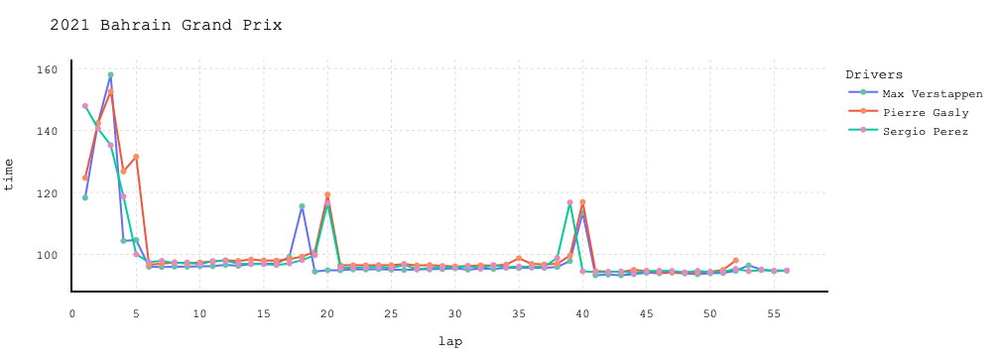

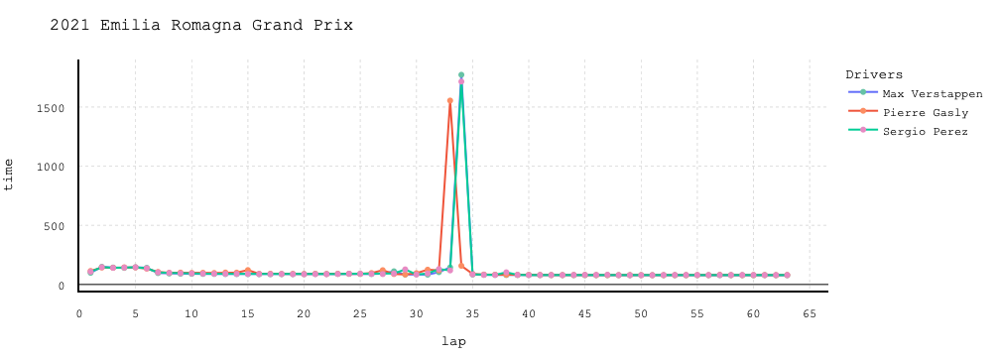

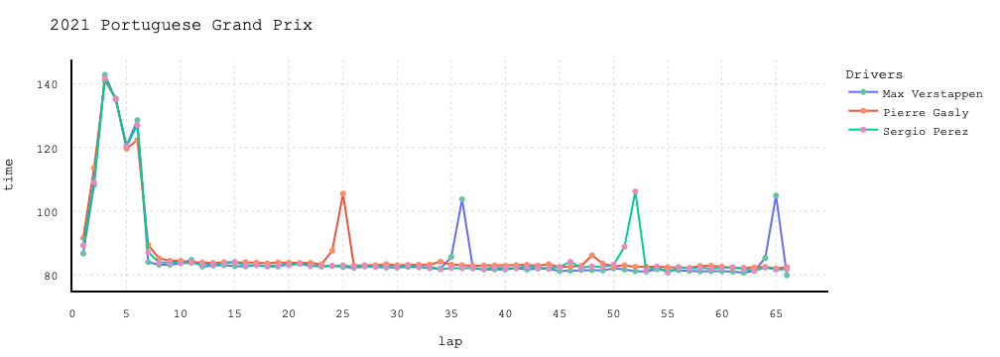

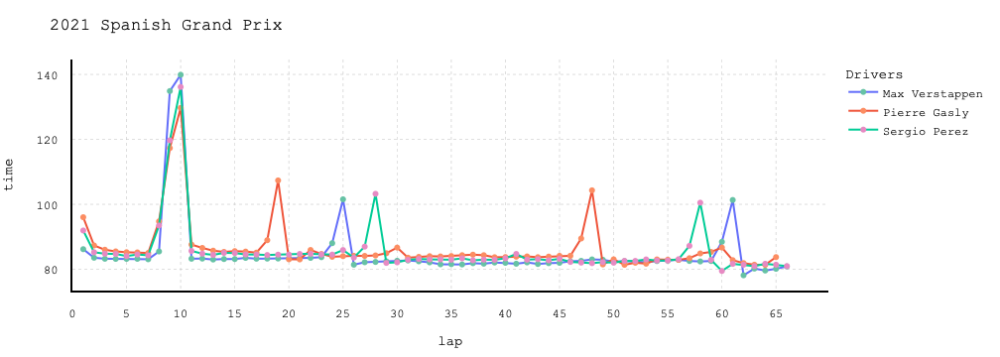

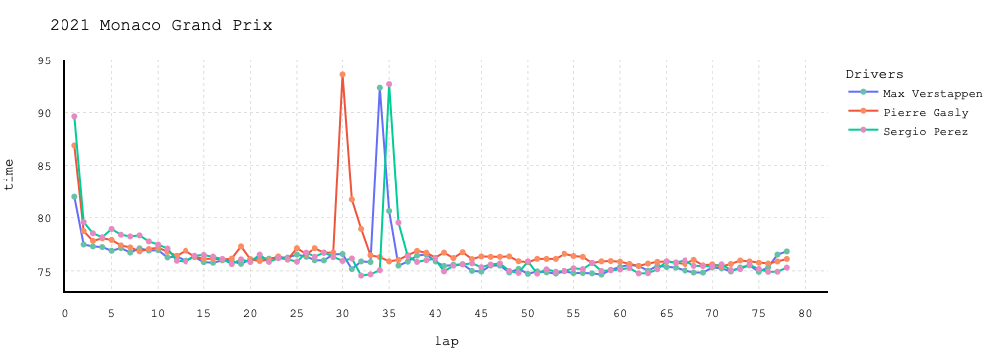

...

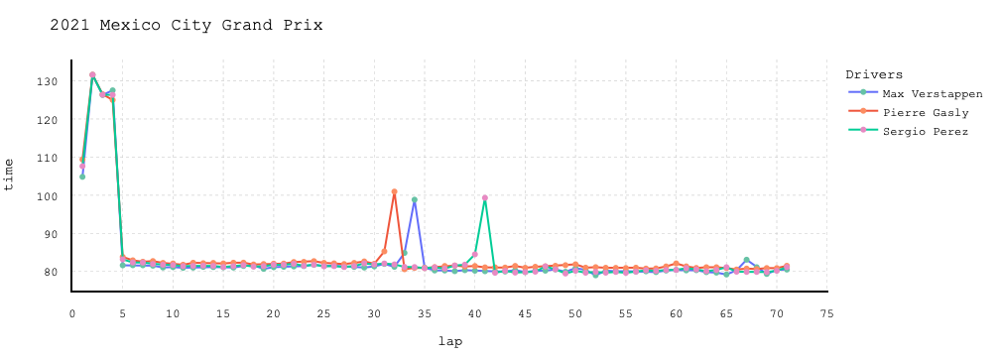

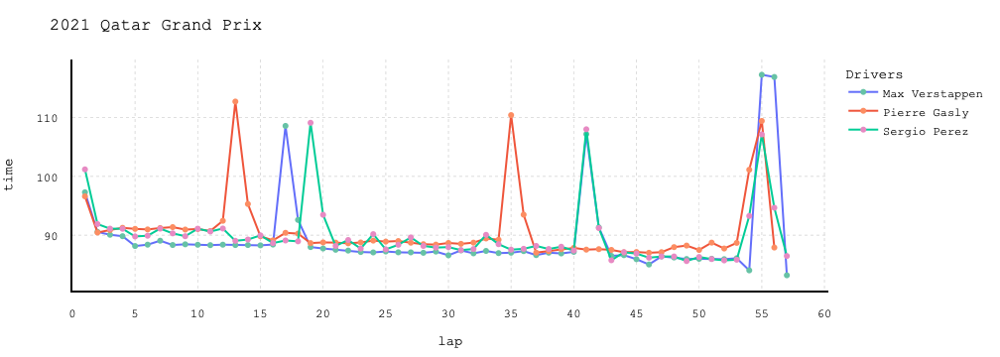

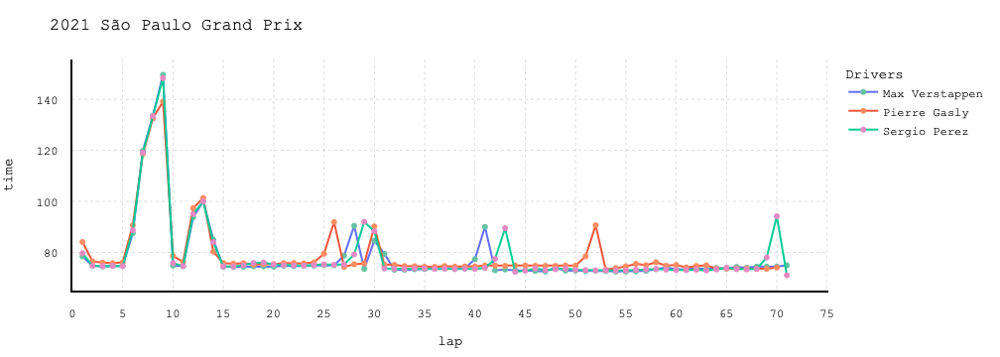

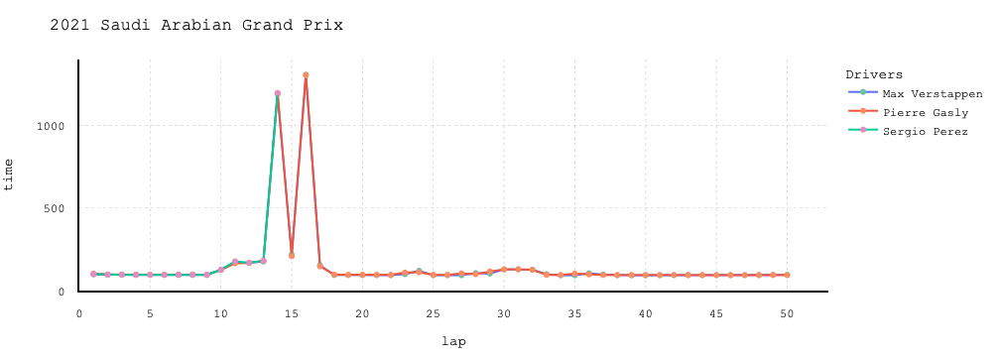

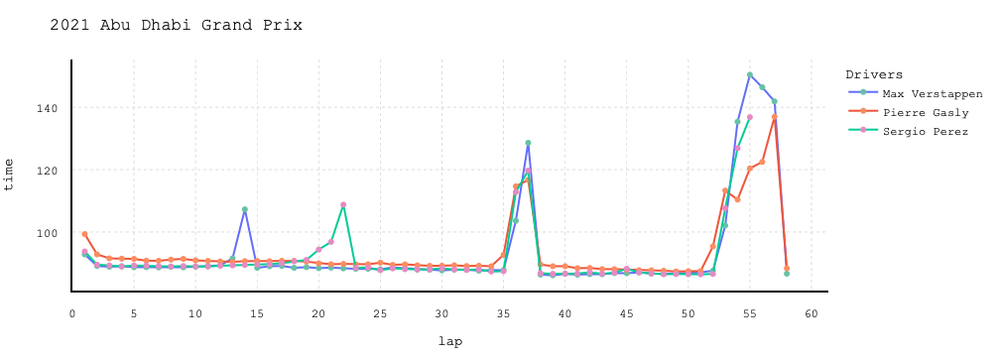

In [132]:

# RACES: GRAPH OBJECTS 


# Defining Colors for each driver 
indexRB_ver_21 = df_2021[(df_2021['code'] == 'VER')].index
df_2021.loc[indexRB_ver_21,'color'] = '#66c2a5'

indexRB_gasly_21 = df_2021[(df_2021['code'] == 'GAS')].index
df_2021.loc[indexRB_gasly_21,'color'] = '#fc8d62'


indexRB_perez_21 = df_2021[(df_2021['code'] == 'PER')].index
df_2021.loc[indexRB_perez_21,'color'] = '#e78ac3'


# Bahrain Grand Prix (1)

df_2021_F_BAH = df_2021[(df_2021['name'] == 'Bahrain Grand Prix')]
df_2021_BAH = df_2021_F_BAH.query("driverRef in ['gasly', 'max_verstappen','perez']")
df_2021_BAH = df_2021_BAH.sort_values(by="lap")

df_2021_BAH_ver =df_2021_BAH[df_2021_BAH['code']=='VER']

df_2021_BAH_gas=df_2021_BAH[df_2021_BAH['code']=='GAS']

df_2021_BAH_per =df_2021_BAH[df_2021_BAH['code']=='PER']

fig2021_1 = go.Figure()

fig2021_1.add_trace(go.Scatter(x=df_2021_BAH_ver['lap'], y=df_2021_BAH_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2021_BAH_ver['color'],
                           marker=dict(color=df_2021_BAH_ver['color'])
))
fig2021_1.add_trace(go.Scatter(x=df_2021_BAH_gas['lap'], y=df_2021_BAH_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2021_BAH_gas['color'],
                           marker=dict(color=df_2021_BAH_gas['color'])
))

fig2021_1.add_trace(go.Scatter(x=df_2021_BAH_per['lap'], y=df_2021_BAH_per['seconds'],
                    mode='lines+markers',
                    name='Sergio Perez',marker_color = df_2021_BAH_per['color'],
                           marker=dict(color=df_2021_BAH_per['color'])
))

fig2021_1.update_layout(layout)
fig2021_1.update_layout(title = '2021 Bahrain Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2021_1.show()

# Emilia Romagna Grand Prix (2)

df_2021_F_EMI = df_2021[(df_2021['name'] == 'Emilia Romagna Grand Prix')]
df_2021_EMI = df_2021_F_EMI.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_EMI = df_2021_EMI.sort_values(by="lap")

df_2021_EMI_ver =df_2021_EMI[df_2021_EMI['code']=='VER']

df_2021_EMI_gas=df_2021_EMI[df_2021_EMI['code']=='GAS']

df_2021_EMI_per =df_2021_EMI[df_2021_EMI['code']=='PER']

fig2021_2 = go.Figure()

fig2021_2.add_trace(go.Scatter(x=df_2021_EMI_ver['lap'], y=df_2021_EMI_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2021_EMI_ver['color'],
                           marker=dict(color=df_2021_EMI_ver['color'])
))
fig2021_2.add_trace(go.Scatter(x=df_2021_EMI_gas['lap'], y=df_2021_EMI_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2021_EMI_gas['color'],
                           marker=dict(color=df_2021_EMI_gas['color'])
))

fig2021_2.add_trace(go.Scatter(x=df_2021_EMI_per['lap'], y=df_2021_EMI_per['seconds'],
                    mode='lines+markers',
                    name='Sergio Perez',marker_color = df_2021_EMI_per['color'],
                           marker=dict(color=df_2021_EMI_per['color'])
))

fig2021_2.update_layout(layout)
fig2021_2.update_layout(title = '2021 Emilia Romagna Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2021_2.show()



# Portuguese Grand Prix (3)

df_2021_F_POR = df_2021[(df_2021['name'] == 'Portuguese Grand Prix')]
df_2021_POR = df_2021_F_POR.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_POR = df_2021_POR.sort_values(by="lap")

df_2021_POR_ver =df_2021_POR[df_2021_POR['code']=='VER']

df_2021_POR_gas=df_2021_POR[df_2021_POR['code']=='GAS']

df_2021_POR_per =df_2021_POR[df_2021_POR['code']=='PER']

fig2021_3 = go.Figure()

fig2021_3.add_trace(go.Scatter(x=df_2021_POR_ver['lap'], y=df_2021_POR_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2021_POR_ver['color'],
                           marker=dict(color=df_2021_POR_ver['color'])
))
fig2021_3.add_trace(go.Scatter(x=df_2021_POR_gas['lap'], y=df_2021_POR_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2021_POR_gas['color'],
                           marker=dict(color=df_2021_POR_gas['color'])
))

fig2021_3.add_trace(go.Scatter(x=df_2021_POR_per['lap'], y=df_2021_POR_per['seconds'],
                    mode='lines+markers',
                    name='Sergio Perez',marker_color = df_2021_POR_per['color'],
                           marker=dict(color=df_2021_POR_per['color'])
))

fig2021_3.update_layout(layout)
fig2021_3.update_layout(title = '2021 Portuguese Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2021_3.show()




# Spanish Grand Prix (4)

df_2021_F_ESP = df_2021[(df_2021['name'] == 'Spanish Grand Prix')]
df_2021_ESP = df_2021_F_ESP.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_ESP = df_2021_ESP.sort_values(by="lap")

df_2021_ESP_ver =df_2021_ESP[df_2021_ESP['code']=='VER']

df_2021_ESP_gas=df_2021_ESP[df_2021_ESP['code']=='GAS']

df_2021_ESP_per =df_2021_ESP[df_2021_ESP['code']=='PER']

fig2021_4 = go.Figure()

fig2021_4.add_trace(go.Scatter(x=df_2021_ESP_ver['lap'], y=df_2021_ESP_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2021_ESP_ver['color'],
                           marker=dict(color=df_2021_ESP_ver['color'])
))
fig2021_4.add_trace(go.Scatter(x=df_2021_ESP_gas['lap'], y=df_2021_ESP_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2021_ESP_gas['color'],
                           marker=dict(color=df_2021_ESP_gas['color'])
))

fig2021_4.add_trace(go.Scatter(x=df_2021_ESP_per['lap'], y=df_2021_ESP_per['seconds'],
                    mode='lines+markers',
                    name='Sergio Perez',marker_color = df_2021_ESP_per['color'],
                           marker=dict(color=df_2021_ESP_per['color'])
))

fig2021_4.update_layout(layout)
fig2021_4.update_layout(title = '2021 Spanish Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2021_4.show()


# Monaco Grand Prix (5)

df_2021_F_MON = df_2021[(df_2021['name'] == 'Monaco Grand Prix')]
df_2021_MON = df_2021_F_MON.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_MON = df_2021_MON.sort_values(by="lap")

df_2021_MON_ver =df_2021_MON[df_2021_MON['code']=='VER']

df_2021_MON_gas=df_2021_MON[df_2021_MON['code']=='GAS']

df_2021_MON_per =df_2021_MON[df_2021_MON['code']=='PER']

fig2021_5 = go.Figure()

fig2021_5.add_trace(go.Scatter(x=df_2021_MON_ver['lap'], y=df_2021_MON_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2021_MON_ver['color'],
                           marker=dict(color=df_2021_MON_ver['color'])
))
fig2021_5.add_trace(go.Scatter(x=df_2021_MON_gas['lap'], y=df_2021_MON_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2021_MON_gas['color'],
                           marker=dict(color=df_2021_MON_gas['color'])
))

fig2021_5.add_trace(go.Scatter(x=df_2021_MON_per['lap'], y=df_2021_MON_per['seconds'],
                    mode='lines+markers',
                    name='Sergio Perez',marker_color = df_2021_MON_per['color'],
                           marker=dict(color=df_2021_MON_per['color'])
))

fig2021_5.update_layout(layout)
fig2021_5.update_layout(title = '2021 Monaco Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2021_5.show()

# Azerbaijan Grand Prix (6)

df_2021_F_AZB = df_2021[(df_2021['name'] == 'Azerbaijan Grand Prix')]
df_2021_AZB = df_2021_F_AZB.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_AZB = df_2021_AZB.sort_values(by="lap")

df_2021_AZB_ver =df_2021_AZB[df_2021_AZB['code']=='VER']

df_2021_AZB_gas=df_2021_AZB[df_2021_AZB['code']=='GAS']

df_2021_AZB_per =df_2021_AZB[df_2021_AZB['code']=='PER']

fig2021_6 = go.Figure()

fig2021_6.add_trace(go.Scatter(x=df_2021_AZB_ver['lap'], y=df_2021_AZB_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2021_AZB_ver['color'],
                           marker=dict(color=df_2021_AZB_ver['color'])
))
fig2021_6.add_trace(go.Scatter(x=df_2021_AZB_gas['lap'], y=df_2021_AZB_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2021_AZB_gas['color'],
                           marker=dict(color=df_2021_AZB_gas['color'])
))

fig2021_6.add_trace(go.Scatter(x=df_2021_AZB_per['lap'], y=df_2021_AZB_per['seconds'],
                    mode='lines+markers',
                    name='Sergio Perez',marker_color = df_2021_AZB_per['color'],
                           marker=dict(color=df_2021_AZB_per['color'])
))

fig2021_6.update_layout(layout)
fig2021_6.update_layout(title = '2021 Azerbaijan Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2021_6.show()



# French Grand Prix (7)

df_2021_F_FRA = df_2021[(df_2021['name'] == 'French Grand Prix')]
df_2021_FRA = df_2021_F_FRA.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_FRA = df_2021_FRA.sort_values(by="lap")

df_2021_FRA_ver =df_2021_FRA[df_2021_FRA['code']=='VER']

df_2021_FRA_gas=df_2021_FRA[df_2021_FRA['code']=='GAS']

df_2021_FRA_per =df_2021_FRA[df_2021_FRA['code']=='PER']

fig2021_7 = go.Figure()

fig2021_7.add_trace(go.Scatter(x=df_2021_FRA_ver['lap'], y=df_2021_FRA_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2021_FRA_ver['color'],
                           marker=dict(color=df_2021_FRA_ver['color'])
))
fig2021_7.add_trace(go.Scatter(x=df_2021_FRA_gas['lap'], y=df_2021_FRA_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2021_FRA_gas['color'],
                           marker=dict(color=df_2021_FRA_gas['color'])
))

fig2021_7.add_trace(go.Scatter(x=df_2021_FRA_per['lap'], y=df_2021_FRA_per['seconds'],
                    mode='lines+markers',
                    name='Sergio Perez',marker_color = df_2021_FRA_per['color'],
                           marker=dict(color=df_2021_FRA_per['color'])
))

fig2021_7.update_layout(layout)
fig2021_7.update_layout(title = '2021 French Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2021_7.show()


# Styrian Grand Prix (8)

df_2021_F_STY = df_2021[(df_2021['name'] == 'Styrian Grand Prix')]
df_2021_STY = df_2021_F_STY.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_STY = df_2021_STY.sort_values(by="lap")

df_2021_STY_ver =df_2021_STY[df_2021_STY['code']=='VER']

df_2021_STY_gas=df_2021_STY[df_2021_STY['code']=='GAS']

df_2021_STY_per =df_2021_STY[df_2021_STY['code']=='PER']

fig2021_8 = go.Figure()

fig2021_8.add_trace(go.Scatter(x=df_2021_STY_ver['lap'], y=df_2021_STY_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2021_STY_ver['color'],
                           marker=dict(color=df_2021_STY_ver['color'])
))
fig2021_8.add_trace(go.Scatter(x=df_2021_STY_gas['lap'], y=df_2021_STY_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2021_STY_gas['color'],
                           marker=dict(color=df_2021_STY_gas['color'])
))

fig2021_8.add_trace(go.Scatter(x=df_2021_STY_per['lap'], y=df_2021_STY_per['seconds'],
                    mode='lines+markers',
                    name='Sergio Perez',marker_color = df_2021_STY_per['color'],
                           marker=dict(color=df_2021_STY_per['color'])
))

fig2021_8.update_layout(layout)
fig2021_8.update_layout(title = '2021 Styrian Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2021_8.show()

# Austrian Grand Prix (9)

df_2021_F_AUS = df_2021[(df_2021['name'] == 'Austrian Grand Prix')]
df_2021_AUS = df_2021_F_AUS.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_AUS = df_2021_AUS.sort_values(by="lap")

df_2021_AUS_ver =df_2021_AUS[df_2021_AUS['code']=='VER']

df_2021_AUS_gas=df_2021_AUS[df_2021_AUS['code']=='GAS']

df_2021_AUS_per =df_2021_AUS[df_2021_AUS['code']=='PER']

fig2021_9 = go.Figure()

fig2021_9.add_trace(go.Scatter(x=df_2021_AUS_ver['lap'], y=df_2021_AUS_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2021_AUS_ver['color'],
                           marker=dict(color=df_2021_AUS_ver['color'])
))
fig2021_9.add_trace(go.Scatter(x=df_2021_AUS_gas['lap'], y=df_2021_AUS_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2021_AUS_gas['color'],
                           marker=dict(color=df_2021_AUS_gas['color'])
))

fig2021_9.add_trace(go.Scatter(x=df_2021_AUS_per['lap'], y=df_2021_AUS_per['seconds'],
                    mode='lines+markers',
                    name='Sergio Perez',marker_color = df_2021_AUS_per['color'],
                           marker=dict(color=df_2021_AUS_per['color'])
))

fig2021_9.update_layout(layout)
fig2021_9.update_layout(title = '2021 Austrian Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2021_9.show()




# British Grand Prix (10)

df_2021_F_BRIT = df_2021[(df_2021['name'] == 'British Grand Prix')]
df_2021_BRIT = df_2021_F_BRIT.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_BRIT = df_2021_BRIT.sort_values(by="lap")

df_2021_BRIT_ver =df_2021_BRIT[df_2021_BRIT['code']=='VER']

df_2021_BRIT_gas=df_2021_BRIT[df_2021_BRIT['code']=='GAS']

df_2021_BRIT_per =df_2021_BRIT[df_2021_BRIT['code']=='PER']

fig2021_10 = go.Figure()

fig2021_10.add_trace(go.Scatter(x=df_2021_BRIT_ver['lap'], y=df_2021_BRIT_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2021_BRIT_ver['color'],
                           marker=dict(color=df_2021_BRIT_ver['color'])
))
fig2021_10.add_trace(go.Scatter(x=df_2021_BRIT_gas['lap'], y=df_2021_BRIT_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2021_BRIT_gas['color'],
                           marker=dict(color=df_2021_BRIT_gas['color'])
))

fig2021_10.add_trace(go.Scatter(x=df_2021_BRIT_per['lap'], y=df_2021_BRIT_per['seconds'],
                    mode='lines+markers',
                    name='Sergio Perez',marker_color = df_2021_BRIT_per['color'],
                           marker=dict(color=df_2021_BRIT_per['color'])
))

fig2021_10.update_layout(layout)
fig2021_10.update_layout(title = '2021 British Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2021_10.show()


# Hungarian Grand Prix (11)

df_2021_F_HUN = df_2021[(df_2021['name'] == 'Hungarian Grand Prix')]
df_2021_HUN = df_2021_F_HUN.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_HUN = df_2021_HUN.sort_values(by="lap")

df_2021_HUN_ver =df_2021_HUN[df_2021_HUN['code']=='VER']

df_2021_HUN_gas=df_2021_HUN[df_2021_HUN['code']=='GAS']

df_2021_HUN_per =df_2021_HUN[df_2021_HUN['code']=='PER']

fig2021_11 = go.Figure()

fig2021_11.add_trace(go.Scatter(x=df_2021_HUN_ver['lap'], y=df_2021_HUN_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2021_HUN_ver['color'],
                           marker=dict(color=df_2021_HUN_ver['color'])
))
fig2021_11.add_trace(go.Scatter(x=df_2021_HUN_gas['lap'], y=df_2021_HUN_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2021_HUN_gas['color'],
                           marker=dict(color=df_2021_HUN_gas['color'])
))

fig2021_11.add_trace(go.Scatter(x=df_2021_HUN_per['lap'], y=df_2021_HUN_per['seconds'],
                    mode='lines+markers',
                    name='Sergio Perez',marker_color = df_2021_HUN_per['color'],
                           marker=dict(color=df_2021_HUN_per['color'])
))

fig2021_11.update_layout(layout)
fig2021_11.update_layout(title = '2021 Hungarian Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2021_11.show()

# Belgian Grand Prix (12)

df_2021_F_BEL = df_2021[(df_2021['name'] == 'Belgian Grand Prix')]
df_2021_BEL = df_2021_F_BEL.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_BEL = df_2021_BEL.sort_values(by="lap")

df_2021_BEL_ver =df_2021_BEL[df_2021_BEL['code']=='VER']

df_2021_BEL_gas=df_2021_BEL[df_2021_BEL['code']=='GAS']

df_2021_BEL_per =df_2021_BEL[df_2021_BEL['code']=='PER']

fig2021_12 = go.Figure()

fig2021_12.add_trace(go.Scatter(x=df_2021_BEL_ver['lap'], y=df_2021_BEL_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2021_BEL_ver['color'],
                           marker=dict(color=df_2021_BEL_ver['color'])
))
fig2021_12.add_trace(go.Scatter(x=df_2021_BEL_gas['lap'], y=df_2021_BEL_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2021_BEL_gas['color'],
                           marker=dict(color=df_2021_BEL_gas['color'])
))

fig2021_12.add_trace(go.Scatter(x=df_2021_BEL_per['lap'], y=df_2021_BEL_per['seconds'],
                    mode='lines+markers',
                    name='Sergio Perez',marker_color = df_2021_BEL_per['color'],
                           marker=dict(color=df_2021_BEL_per['color'])
))

fig2021_12.update_layout(layout)
fig2021_12.update_layout(title = '2021 Belgian Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2021_12.show()





# Dutch Grand Prix (13)

df_2021_F_NED = df_2021[(df_2021['name'] == 'Dutch Grand Prix')]
df_2021_NED = df_2021_F_NED.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_NED = df_2021_NED.sort_values(by="lap")


df_2021_NED_ver =df_2021_NED[df_2021_NED['code']=='VER']

df_2021_NED_gas=df_2021_NED[df_2021_NED['code']=='GAS']

df_2021_NED_per =df_2021_NED[df_2021_NED['code']=='PER']

fig2021_13 = go.Figure()

fig2021_13.add_trace(go.Scatter(x=df_2021_NED_ver['lap'], y=df_2021_NED_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2021_NED_ver['color'],
                           marker=dict(color=df_2021_NED_ver['color'])
))
fig2021_13.add_trace(go.Scatter(x=df_2021_NED_gas['lap'], y=df_2021_NED_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2021_NED_gas['color'],
                           marker=dict(color=df_2021_NED_gas['color'])
))

fig2021_13.add_trace(go.Scatter(x=df_2021_NED_per['lap'], y=df_2021_NED_per['seconds'],
                    mode='lines+markers',
                    name='Sergio Perez',marker_color = df_2021_NED_per['color'],
                           marker=dict(color=df_2021_NED_per['color'])
))

fig2021_13.update_layout(layout)
fig2021_13.update_layout(title = '2021 Dutch Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2021_13.show()




# Italian Grand Prix (14)

df_2021_F_ITA = df_2021[(df_2021['name'] == 'Italian Grand Prix')]
df_2021_ITA = df_2021_F_ITA.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_ITA = df_2021_ITA.sort_values(by="lap")

df_2021_ITA_ver =df_2021_ITA[df_2021_ITA['code']=='VER']

df_2021_ITA_gas=df_2021_ITA[df_2021_ITA['code']=='GAS']

df_2021_ITA_per =df_2021_ITA[df_2021_ITA['code']=='PER']

fig2021_14 = go.Figure()

fig2021_14.add_trace(go.Scatter(x=df_2021_ITA_ver['lap'], y=df_2021_ITA_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2021_ITA_ver['color'],
                           marker=dict(color=df_2021_ITA_ver['color'])
))
fig2021_14.add_trace(go.Scatter(x=df_2021_ITA_gas['lap'], y=df_2021_ITA_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2021_ITA_gas['color'],
                           marker=dict(color=df_2021_ITA_gas['color'])
))

fig2021_14.add_trace(go.Scatter(x=df_2021_ITA_per['lap'], y=df_2021_ITA_per['seconds'],
                    mode='lines+markers',
                    name='Sergio Perez',marker_color = df_2021_ITA_per['color'],
                           marker=dict(color=df_2021_ITA_per['color'])
))

fig2021_14.update_layout(layout)
fig2021_14.update_layout(title = '2021 Italian Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2021_14.show()




# Russian Grand Prix (15)

df_2021_F_RUS = df_2021[(df_2021['name'] == 'Russian Grand Prix')]
df_2021_RUS = df_2021_F_RUS.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_RUS = df_2021_RUS.sort_values(by="lap")

df_2021_RUS_ver =df_2021_RUS[df_2021_RUS['code']=='VER']

df_2021_RUS_gas=df_2021_RUS[df_2021_RUS['code']=='GAS']

df_2021_RUS_per =df_2021_RUS[df_2021_RUS['code']=='PER']

fig2021_15 = go.Figure()

fig2021_15.add_trace(go.Scatter(x=df_2021_RUS_ver['lap'], y=df_2021_RUS_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2021_RUS_ver['color'],
                           marker=dict(color=df_2021_RUS_ver['color'])
))
fig2021_15.add_trace(go.Scatter(x=df_2021_RUS_gas['lap'], y=df_2021_RUS_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2021_RUS_gas['color'],
                           marker=dict(color=df_2021_RUS_gas['color'])
))

fig2021_15.add_trace(go.Scatter(x=df_2021_RUS_per['lap'], y=df_2021_RUS_per['seconds'],
                    mode='lines+markers',
                    name='Sergio Perez',marker_color = df_2021_RUS_per['color'],
                           marker=dict(color=df_2021_RUS_per['color'])
))

fig2021_15.update_layout(layout)
fig2021_15.update_layout(title = '2021 Russian Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2021_15.show()



# Turkish Grand Prix (16)

df_2021_F_TUR = df_2021[(df_2021['name'] == 'Turkish Grand Prix')]
df_2021_TUR = df_2021_F_TUR.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_TUR = df_2021_TUR.sort_values(by="lap")

df_2021_TUR_ver =df_2021_TUR[df_2021_TUR['code']=='VER']

df_2021_TUR_gas=df_2021_TUR[df_2021_TUR['code']=='GAS']

df_2021_TUR_per =df_2021_TUR[df_2021_TUR['code']=='PER']

fig2021_16 = go.Figure()

fig2021_16.add_trace(go.Scatter(x=df_2021_TUR_ver['lap'], y=df_2021_TUR_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2021_TUR_ver['color'],
                           marker=dict(color=df_2021_TUR_ver['color'])
))
fig2021_16.add_trace(go.Scatter(x=df_2021_TUR_gas['lap'], y=df_2021_TUR_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2021_TUR_gas['color'],
                           marker=dict(color=df_2021_TUR_gas['color'])
))

fig2021_16.add_trace(go.Scatter(x=df_2021_TUR_per['lap'], y=df_2021_TUR_per['seconds'],
                    mode='lines+markers',
                    name='Sergio Perez',marker_color = df_2021_TUR_per['color'],
                           marker=dict(color=df_2021_TUR_per['color'])
))

fig2021_16.update_layout(layout)
fig2021_16.update_layout(title = '2021 Turkish Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2021_16.show()

# United States Grand Prix (17)

df_2021_F_USA = df_2021[(df_2021['name'] == 'United States Grand Prix')]
df_2021_USA = df_2021_F_USA.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_USA = df_2021_USA.sort_values(by="lap")

df_2021_USA_ver =df_2021_USA[df_2021_USA['code']=='VER']

df_2021_USA_gas=df_2021_USA[df_2021_USA['code']=='GAS']

df_2021_USA_per =df_2021_USA[df_2021_USA['code']=='PER']

fig2021_17 = go.Figure()

fig2021_17.add_trace(go.Scatter(x=df_2021_USA_ver['lap'], y=df_2021_USA_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2021_USA_ver['color'],
                           marker=dict(color=df_2021_USA_ver['color'])
))
fig2021_17.add_trace(go.Scatter(x=df_2021_USA_gas['lap'], y=df_2021_USA_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2021_USA_gas['color'],
                           marker=dict(color=df_2021_USA_gas['color'])
))

fig2021_17.add_trace(go.Scatter(x=df_2021_USA_per['lap'], y=df_2021_USA_per['seconds'],
                    mode='lines+markers',
                    name='Sergio Perez',marker_color = df_2021_USA_per['color'],
                           marker=dict(color=df_2021_USA_per['color'])
))

fig2021_17.update_layout(layout)
fig2021_17.update_layout(title = '2021 United States Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2021_17.show()


# Mexico City Grand Prix (18)
df_2021_F_MEX = df_2021[(df_2021['name'] == 'Mexico City Grand Prix')]
df_2021_MEX = df_2021_F_MEX.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_MEX = df_2021_MEX.sort_values(by="lap")

df_2021_MEX_ver =df_2021_MEX[df_2021_MEX['code']=='VER']

df_2021_MEX_gas=df_2021_MEX[df_2021_MEX['code']=='GAS']

df_2021_MEX_per =df_2021_MEX[df_2021_MEX['code']=='PER']

fig2021_18 = go.Figure()

fig2021_18.add_trace(go.Scatter(x=df_2021_MEX_ver['lap'], y=df_2021_MEX_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2021_MEX_ver['color'],
                           marker=dict(color=df_2021_MEX_ver['color'])
))
fig2021_18.add_trace(go.Scatter(x=df_2021_MEX_gas['lap'], y=df_2021_MEX_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2021_MEX_gas['color'],
                           marker=dict(color=df_2021_MEX_gas['color'])
))

fig2021_18.add_trace(go.Scatter(x=df_2021_MEX_per['lap'], y=df_2021_MEX_per['seconds'],
                    mode='lines+markers',
                    name='Sergio Perez',marker_color = df_2021_MEX_per['color'],
                           marker=dict(color=df_2021_MEX_per['color'])
))

fig2021_18.update_layout(layout)
fig2021_18.update_layout(title = '2021 Mexico City Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2021_18.show()


# Qatar Grand Prix (19)

df_2021_F_QAT = df_2021[(df_2021['name'] == 'Qatar Grand Prix')]
df_2021_QAT = df_2021_F_QAT.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_QAT = df_2021_QAT.sort_values(by="lap")

df_2021_QAT_ver =df_2021_QAT[df_2021_QAT['code']=='VER']

df_2021_QAT_gas=df_2021_QAT[df_2021_QAT['code']=='GAS']

df_2021_QAT_per =df_2021_QAT[df_2021_QAT['code']=='PER']

fig2021_19 = go.Figure()

fig2021_19.add_trace(go.Scatter(x=df_2021_QAT_ver['lap'], y=df_2021_QAT_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2021_QAT_ver['color'],
                           marker=dict(color=df_2021_QAT_ver['color'])
))
fig2021_19.add_trace(go.Scatter(x=df_2021_QAT_gas['lap'], y=df_2021_QAT_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2021_QAT_gas['color'],
                           marker=dict(color=df_2021_QAT_gas['color'])
))

fig2021_19.add_trace(go.Scatter(x=df_2021_QAT_per['lap'], y=df_2021_QAT_per['seconds'],
                    mode='lines+markers',
                    name='Sergio Perez',marker_color = df_2021_QAT_per['color'],
                           marker=dict(color=df_2021_QAT_per['color'])
))

fig2021_19.update_layout(layout)
fig2021_19.update_layout(title = '2021 Qatar Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2021_19.show()

# São Paulo Grand Prix (20)

df_2021_F_BRZ = df_2021[(df_2021['name'] == 'São Paulo Grand Prix')]
df_2021_BRZ = df_2021_F_BRZ.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_BRZ = df_2021_BRZ.sort_values(by="lap")

df_2021_BRZ_ver =df_2021_BRZ[df_2021_BRZ['code']=='VER']

df_2021_BRZ_gas =df_2021_BRZ[df_2021_BRZ['code']=='GAS']

df_2021_BRZ_per =df_2021_BRZ[df_2021_BRZ['code']=='PER']

fig2021_20 = go.Figure()

fig2021_20.add_trace(go.Scatter(x=df_2021_BRZ_ver['lap'], y=df_2021_BRZ_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2021_BRZ_ver['color'],
                           marker=dict(color=df_2021_BRZ_ver['color'])
))
fig2021_20.add_trace(go.Scatter(x=df_2021_BRZ_gas['lap'], y=df_2021_BRZ_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2021_BRZ_gas['color'],
                           marker=dict(color=df_2021_BRZ_gas['color'])
))

fig2021_20.add_trace(go.Scatter(x=df_2021_BRZ_per['lap'], y=df_2021_BRZ_per['seconds'],
                    mode='lines+markers',
                    name='Sergio Perez',marker_color = df_2021_BRZ_per['color'],
                           marker=dict(color=df_2021_BRZ_per['color'])
))

fig2021_20.update_layout(layout)
fig2021_20.update_layout(title = '2021 São Paulo Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2021_20.show()

# Saudi Arabian Grand Prix (21)

df_2021_F_SAU = df_2021[(df_2021['name'] == 'Saudi Arabian Grand Prix')]
df_2021_SAU = df_2021_F_SAU.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_SAU = df_2021_SAU.sort_values(by="lap")

df_2021_SAU_ver =df_2021_SAU[df_2021_SAU['code']=='VER']

df_2021_SAU_gas =df_2021_SAU[df_2021_SAU['code']=='GAS']

df_2021_SAU_per =df_2021_SAU[df_2021_SAU['code']=='PER']

fig2021_21 = go.Figure()

fig2021_21.add_trace(go.Scatter(x=df_2021_SAU_ver['lap'], y=df_2021_SAU_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2021_SAU_ver['color'],
                           marker=dict(color=df_2021_SAU_ver['color'])
))
fig2021_21.add_trace(go.Scatter(x=df_2021_SAU_gas['lap'], y=df_2021_SAU_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2021_SAU_gas['color'],
                           marker=dict(color=df_2021_SAU_gas['color'])
))

fig2021_21.add_trace(go.Scatter(x=df_2021_SAU_per['lap'], y=df_2021_SAU_per['seconds'],
                    mode='lines+markers',
                    name='Sergio Perez',marker_color = df_2021_SAU_per['color'],
                           marker=dict(color=df_2021_SAU_per['color'])
))

fig2021_21.update_layout(layout)
fig2021_21.update_layout(title = '2021 Saudi Arabian Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2021_21.show()

# Abu Dhabi Grand Prix (22)

df_2021_F_ABH = df_2021[(df_2021['name'] == 'Abu Dhabi Grand Prix')]
df_2021_ABH  = df_2021_F_ABH.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2021_ABH  = df_2021_ABH.sort_values(by="lap")

df_2021_ABH_ver =df_2021_ABH[df_2021_ABH['code']=='VER']

df_2021_ABH_gas =df_2021_ABH[df_2021_ABH['code']=='GAS']

df_2021_ABH_per =df_2021_ABH[df_2021_ABH['code']=='PER']

fig2021_22 = go.Figure()

fig2021_22.add_trace(go.Scatter(x=df_2021_ABH_ver['lap'], y=df_2021_ABH_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2021_ABH_ver['color'],
                           marker=dict(color=df_2021_ABH_ver['color'])
))
fig2021_22.add_trace(go.Scatter(x=df_2021_ABH_gas['lap'], y=df_2021_ABH_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2021_ABH_gas['color'],
                           marker=dict(color=df_2021_ABH_gas['color'])
))

fig2021_22.add_trace(go.Scatter(x=df_2021_ABH_per['lap'], y=df_2021_ABH_per['seconds'],
                    mode='lines+markers',
                    name='Sergio Perez',marker_color = df_2021_ABH_per['color'],
                           marker=dict(color=df_2021_ABH_per['color'])
))

fig2021_22.update_layout(layout)
fig2021_22.update_layout(title = '2021 Abu Dhabi Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2021_22.show()



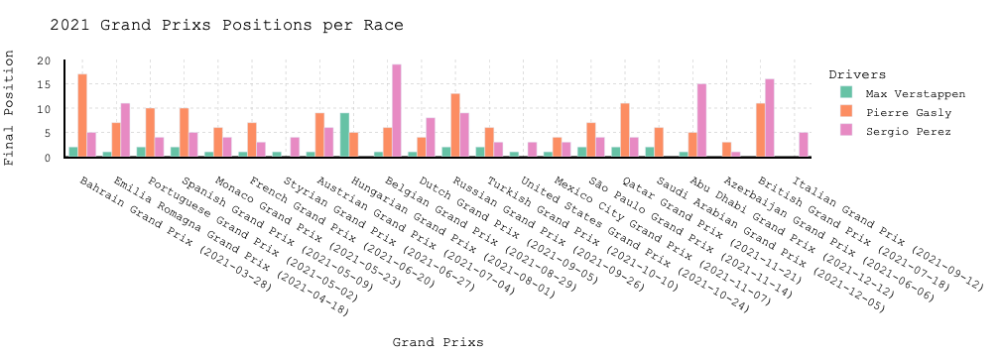

In [107]:
# Positions 2021 per Race
 
df_results_2021 = df_results[(df_results['year']==2021)&((df_results['code']=='VER')|(df_results['code']=='GAS')|(df_results['code']=='ALB')|(df_results['code']=='PER'))]
df_results_2021r= df_results_2021.sort_values(by="date")

indexRB_ver_21 = df_results_2021[(df_results_2021['code'] == 'VER')].index
df_results_2021.loc[indexRB_ver_21,'color'] = '#66c2a5'

indexRB_gasly_21 = df_results_2021[(df_results_2021['code'] == 'GAS')].index
df_results_2021.loc[indexRB_gasly_21,'color'] = '#fc8d62'


indexRB_perez_21 = df_results_2021[(df_results_2021['code'] == 'PER')].index
df_results_2021.loc[indexRB_perez_21,'color'] = '#e78ac3'


df_results_2021_ver =df_results_2021[df_results_2021['code']=='VER']
df_results_2021_ver= df_results_2021_ver.sort_values(by="date")
df_results_2021_ver['corrida']=df_results_2021_ver['name']+' ('+df_results_2021_ver['date']+')'

df_results_2021_gas =df_results_2021[df_results_2021['code']=='GAS']
df_results_2021_gas= df_results_2021_gas.sort_values(by="date")
df_results_2021_gas['corrida']=df_results_2021_gas['name']+' ('+df_results_2021_gas['date']+')'

df_results_2021_per =df_results_2021[df_results_2021['code']=='PER']
df_results_2021_per= df_results_2021_per.sort_values(by="date")
df_results_2021_per['corrida']=df_results_2021_per['name']+' ('+df_results_2021_per['date']+')'

fig_results_2021 = go.Figure()

fig_results_2021 = go.Figure(data=[
    go.Bar(name ='Max Verstappen',x=df_results_2021_ver['corrida'], y=df_results_2021_ver['position'],marker_color=df_results_2021_ver['color']),
    go.Bar(name='Pierre Gasly',x=df_results_2021_gas['corrida'], y=df_results_2021_gas['position'],marker_color=df_results_2021_gas['color']),
    go.Bar(name='Sergio Perez',x=df_results_2021_per['corrida'], y=df_results_2021_per['position'],marker_color=df_results_2021_per['color']),
    
])

fig_results_2021.update_layout(layout_results)
fig_results_2021.update_layout(title = '2021 Grand Prixs Positions per Race',xaxis_title ="Grand Prixs",yaxis_title ="Final Position",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig_results_2021.show()

#fig = px.bar(df_results_2021, x='name', y='position'
             #,hover_data=['driverRef', 'position']
 #            , color='driverRef', height=100,barmode='group', title = 'Position 2021')
#fig.update_layout({
#'plot_bgcolor': 'rgba(0, 0, 0, 0)',
#'paper_bgcolor': 'rgba(0, 0, 0, 0)',
#})
#fig.show()


# Change the bar mode
#fig.update_layout(barmode='group')
#fig.show()

#fig_results_2021.add_trace(go.Scatter(x=df_results_2021_ver['name'], y=df_results_2021_ver['position'],
 #                   mode='lines+markers',
  #                  name='Max Verstappen',marker_color = df_results_2021_ver['color'],
   #                        marker=dict(color=df_results_2021_ver['color'])
#))
#fig_results_2021.add_trace(go.Scatter(x=df_results_2021_gas['name'], y=df_results_2021_gas['position'],
 #                   mode='lines+markers',
  #                  name='Pierre Gasly',
   #                        marker_color = df_results_2021_gas['color'],
    #                       marker=dict(color=df_results_2021_gas['color'])
#))

#fig_results_2021.add_trace(go.Scatter(x=df_results_2021_per['name'], y=df_results_2021_per['position'],
 #                   mode='lines+markers',
  #                  name='Sergio Perez',marker_color = df_results_2021_per['color'],
   #                        marker=dict(color=df_results_2021_per['color'])
#))


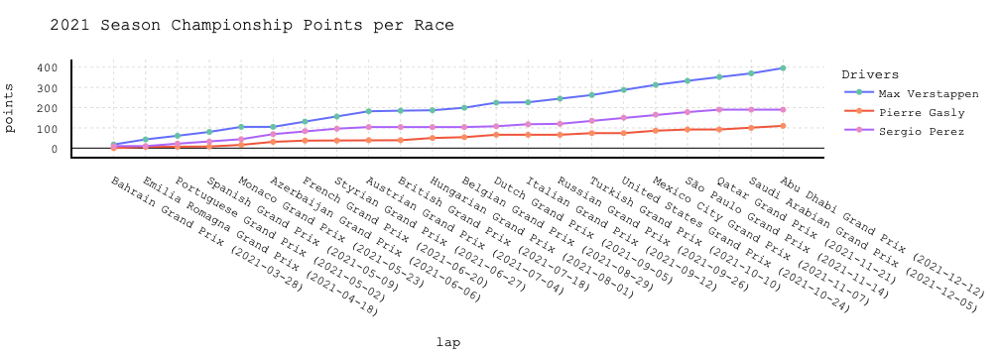

In [96]:
season_Points_2021_ = season_Points_2021.query("code in ['GAS', 'VER','ALB','PER']")
season_Points_2021_ = season_Points_2021.sort_values(by="date")

indexRB_ver_21 = season_Points_2021[(season_Points_2021['code'] == 'VER')].index
season_Points_2021.loc[indexRB_ver_21,'color'] = '#66c2a5'

indexRB_gasly_21 = season_Points_2021[(season_Points_2021['code'] == 'GAS')].index
season_Points_2021.loc[indexRB_gasly_21,'color'] = '#fc8d62'

indexRB_albon_21 = season_Points_2021[(season_Points_2021['code'] == 'ALB')].index
season_Points_2021.loc[indexRB_albon_21,'color'] = '#8da0cb'

indexRB_perez_21 = season_Points_2021[(season_Points_2021['code'] == 'PER')].index
season_Points_2021.loc[indexRB_perez_21,'color'] = '#e78ac3'

season_Points_2021_ver =season_Points_2021[season_Points_2021['code']=='VER']
season_Points_2021_ver = season_Points_2021_ver.sort_values(by="date")
season_Points_2021_ver['corrida']=season_Points_2021_ver['name']+' ('+season_Points_2021_ver['date']+')'

season_Points_2021_gas =season_Points_2021[season_Points_2021['code']=='GAS']
season_Points_2021_gas = season_Points_2021_gas.sort_values(by="date")
season_Points_2021_gas['corrida']=season_Points_2021_gas['name']+' ('+season_Points_2021_gas['date']+')'

season_Points_2021_alb =season_Points_2021[season_Points_2021['code']=='ALB']
season_Points_2021_alb = season_Points_2021_alb.sort_values(by="date")
season_Points_2021_alb['corrida']=season_Points_2021_alb['name']+' ('+season_Points_2021_alb['date']+')'

season_Points_2021_per =season_Points_2021[season_Points_2021['code']=='PER']
season_Points_2021_per = season_Points_2021_per.sort_values(by="date")
season_Points_2021_per['corrida']=season_Points_2021_per['name']+' ('+season_Points_2021_per['date']+')'

fig2021_season_points = go.Figure()

fig2021_season_points.add_trace(go.Scatter(x=season_Points_2021_ver['corrida'], y=season_Points_2021_ver['points'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = season_Points_2021_ver['color'],
                           marker=dict(color=season_Points_2021_ver['color'])
))
fig2021_season_points.add_trace(go.Scatter(x=season_Points_2021_gas['corrida'], y=season_Points_2021_gas['points'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = season_Points_2021_gas['color'],
                           marker=dict(color=season_Points_2021_gas['color'])
))


fig2021_season_points.add_trace(go.Scatter(x=season_Points_2021_alb['corrida'], y=season_Points_2021_alb['points'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=season_Points_2021_alb['color'])
))

fig2021_season_points.add_trace(go.Scatter(x=season_Points_2021_per['corrida'], y=season_Points_2021_per['points'],
                    mode='lines+markers',
                    name='Sergio Perez',
                           marker=dict(color=season_Points_2021_per['color'])
))

fig2021_season_points.update_layout(layout_results)
fig2021_season_points.update_layout(title = '2021 Season Championship Points per Race ',xaxis_title ="lap",yaxis_title ="points",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2021_season_points.show()


#fig = px.line(season_Points_2021_, x='name', y='points', color='code', markers=True, title = '2021 Red Bull WDC')
#fig.update_layout({
#'plot_bgcolor': 'rgba(0, 0, 0, 0)',
#'paper_bgcolor': 'rgba(0, 0, 0, 0)',
#})
#fig.show()

# 2022
##### Verstappen - Main driver
##### Checo Pérez - Teammate
##### Gasly - Alpha Tauri 
##### Albon - Williams



In [97]:
# 2022 Season races info

df_laps_2022 = df[(df['year']==2022)&((df['code']=='VER')|(df['code']=='GAS'))|(df['driverRef']=='albon')|(df['driverRef']=='perez')].copy()
df_laps_2022.rename(columns={'position':'lap position'},inplace=True)
df_laps_2022 = df_laps_2022.merge(results[['raceId','driverId','position']],how='left',on=['raceId','driverId'])
df_laps_2022 = df_laps_2022.merge(pit_stops[['raceId','driverId','lap','stop']],how='left',on=['raceId','driverId','lap'])
df_laps_2022['stop'].fillna(0,inplace=True)
df_laps_2022['stop']=df_laps_2022['stop'].astype(int)
df_laps_2022['stop'][df_laps_2022['stop']==0] = ''
df_laps_2022['seconds']=df_laps_2022['milliseconds']/1000
df_laps_2022

/var/folders/s8/zqdvt79d34nd7fs16cr64b7r0000gn/T/ipykernel_3968/91406386.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,raceId,driverId,lap,lap position,time,milliseconds,code,driverRef,name,date,year,position,stop,seconds
0,841,815,1,14,1:52.663,112663,PER,perez,Australian Grand Prix,2011-03-27,2011,\N,,112.663
1,841,815,2,14,1:37.576,97576,PER,perez,Australian Grand Prix,2011-03-27,2011,\N,,97.576
2,841,815,3,14,1:36.216,96216,PER,perez,Australian Grand Prix,2011-03-27,2011,\N,,96.216
3,841,815,4,14,1:35.617,95617,PER,perez,Australian Grand Prix,2011-03-27,2011,\N,,95.617
4,841,815,5,14,1:35.999,95999,PER,perez,Australian Grand Prix,2011-03-27,2011,\N,,95.999
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16925,1086,842,65,13,1:25.989,85989,GAS,gasly,Hungarian Grand Prix,2022-07-31,2022,12,,85.989
16926,1086,842,66,12,1:25.187,85187,GAS,gasly,Hungarian Grand Prix,2022-07-31,2022,12,,85.187
16927,1086,842,67,12,1:47.355,107355,GAS,gasly,Hungarian Grand Prix,2022-07-31,2022,12,,107.355
16928,1086,842,68,12,1:37.587,97587,GAS,gasly,Hungarian Grand Prix,2022-07-31,2022,12,,97.587


In [98]:
# 2022 Season
df_2022 = df_laps_2022[df_laps_2022['year'] == 2022]
df_2022

,raceId,driverId,lap,lap position,time,milliseconds,code,driverRef,name,date,year,position,stop,seconds
14068,1074,830,1,2,1:40.236,100236,VER,max_verstappen,Bahrain Grand Prix,2022-03-20,2022,19,,100.236
14069,1074,830,2,2,1:37.880,97880,VER,max_verstappen,Bahrain Grand Prix,2022-03-20,2022,19,,97.880
14070,1074,830,3,2,1:38.357,98357,VER,max_verstappen,Bahrain Grand Prix,2022-03-20,2022,19,,98.357
14071,1074,830,4,2,1:38.566,98566,VER,max_verstappen,Bahrain Grand Prix,2022-03-20,2022,19,,98.566
14072,1074,830,5,2,1:38.877,98877,VER,max_verstappen,Bahrain Grand Prix,2022-03-20,2022,19,,98.877
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16925,1086,842,65,13,1:25.989,85989,GAS,gasly,Hungarian Grand Prix,2022-07-31,2022,12,,85.989
16926,1086,842,66,12,1:25.187,85187,GAS,gasly,Hungarian Grand Prix,2022-07-31,2022,12,,85.187
16927,1086,842,67,12,1:47.355,107355,GAS,gasly,Hungarian Grand Prix,2022-07-31,2022,12,,107.355
16928,1086,842,68,12,1:37.587,97587,GAS,gasly,Hungarian Grand Prix,2022-07-31,2022,12,,97.587


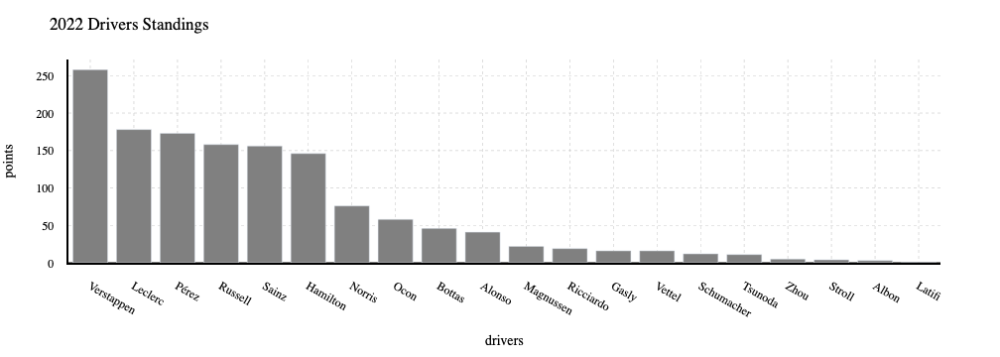

In [99]:
# 2022 Drivers Standings 

h = driver_position.merge(circuits,left_on='circuitId',right_on='circuitId',how = 'left')
h.rename(columns={'name_y':'circuit_name'},inplace=True)
viz = h.loc[:,['date','year','circuit_name','surname','points','wins']]

viz.dropna(inplace = True)

viz.points = viz.points.astype('int64')
viz.wins = viz.wins.astype('int64')
viz.date = pd.to_datetime(viz.date)
    
top = viz[viz.loc[:,'year'] == 2022]
top = top.groupby(['surname'])[['points','wins']].max().sort_values('points',ascending = False).head(20).reset_index()

fig = go.Figure()
fig.add_trace(go.Bar(
    x=top['surname'],
    y=top['points'],
    name='2022 Drivers Standings',
    marker_color='grey'
))
fig.update_layout(layout_results)
fig.update_layout(title ="2022 Drivers Standings", xaxis_title="drivers",yaxis_title="points")


#fig = px.bar(top, x='surname', y='points',hover_data=['wins'], color='points',height=400,color_continuous_scale= 'turbo')
#fig.update_traces(textfont_size=20,marker=dict(line=dict(color='#000000', width=2)))
#fig.update_xaxes(showgrid=False)
#fig.update_yaxes(showgrid=False)
#fig.update_layout({
#'plot_bgcolor': 'rgba(0, 0, 0, 0)',
#'paper_bgcolor': 'rgba(0, 0, 0, 0)',
#})

fig.show()

In [100]:
# 2022 Season - drivers selected 
df_2022['driverRef'].unique()

array(['max_verstappen', 'perez', 'gasly', 'albon'], dtype=object)

In [101]:
# 2022 Season - All Grand Prix 
df_2022['name'].unique()

array(['Bahrain Grand Prix', 'Saudi Arabian Grand Prix',
       'Australian Grand Prix', 'Emilia Romagna Grand Prix',
       'Miami Grand Prix', 'Spanish Grand Prix', 'Monaco Grand Prix',
       'Azerbaijan Grand Prix', 'Canadian Grand Prix',
       'British Grand Prix', 'Austrian Grand Prix', 'French Grand Prix',
       'Hungarian Grand Prix'], dtype=object)

In [ ]:

# RACES: PLOTLY EXPRESS


#'Bahrain Grand Prix', 'Saudi Arabian Grand Prix',
 #      'Australian Grand Prix', 'Emilia Romagna Grand Prix',
  #     'Miami Grand Prix', 'Spanish Grand Prix', 'Monaco Grand Prix',
   #    'Azerbaijan Grand Prix', 'Canadian Grand Prix',
    #   'British Grand Prix', 'Austrian Grand Prix', 'French Grand Prix',
     #  'Hungarian Grand Prix'
        
# Bahrain Grand Prix (1)

df_2022_F_BAH = df_2022[(df_2022['name'] == 'Bahrain Grand Prix')]
df_2022_BAH = df_2022_F_BAH.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2022_BAH = df_2022_BAH.sort_values(by="time")

fig_2022_1 = px.scatter(df_2022_BAH, x="lap", y="time", color = "driverRef", title = "Bahrain Grand Prix")
fig_2022_1.update_traces(textposition="bottom right")
fig_2022_1.show()





# Saudi Arabian Grand Prix (2)

df_2022_F_SAU = df_2022[(df_2022['name'] == 'Saudi Arabian Grand Prix')]
df_2022_SAU = df_2022_F_SAU.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2022_SAU = df_2022_SAU.sort_values(by="time")

fig_2022_2 = px.scatter(df_2022_SAU, x="lap", y="time", color = "driverRef", title = "Saudi Arabian Grand Prix")
fig_2022_2.update_traces(textposition="bottom right")
fig_2022_2.show()

# Australian Grand Prix (3)

df_2022_F_AUST = df_2022[(df_2022['name'] == 'Australian Grand Prix')]
df_2022_AUST = df_2022_F_AUST.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2022_AUST = df_2022_AUST.sort_values(by="time")

fig_2022_3 = px.scatter(df_2022_AUST, x="lap", y="time", color = "driverRef", title = "Australian Grand Prix")
fig_2022_3.update_traces(textposition="bottom right")
fig_2022_3.show()




# Emilia Romagna Grand Prix (4)

df_2022_F_EMI = df_2022[(df_2022['name'] == 'Emilia Romagna Grand Prix')]
df_2022_EMI = df_2022_F_EMI.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2022_EMI = df_2022_EMI.sort_values(by="time")

fig_2022_4 = px.scatter(df_2022_EMI, x="lap", y="time", color = "driverRef", title = "Emilia Romagna Grand Prix")
fig_2022_4.update_traces(textposition="bottom right")
fig_2022_4.show()

# Miami Grand Prix (5)

df_2022_F_MIA = df_2022[(df_2022['name'] == 'Miami Grand Prix')]
df_2022_MIA = df_2022_F_MIA.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2022_MIA = df_2022_MIA.sort_values(by="time")

fig_2022_5 = px.scatter(df_2022_MIA, x="lap", y="time", color = "driverRef", title = "Miami Grand Prix")
fig_2022_5.update_traces(textposition="bottom right")
fig_2022_5.show()

# Spanish Grand Prix (6)

df_2022_F_ESP = df_2022[(df_2022['name'] == 'Spanish Grand Prix')]
df_2022_ESP = df_2022_F_ESP.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2022_ESP = df_2022_ESP.sort_values(by="time")

fig_2022_6 = px.scatter(df_2022_ESP, x="lap", y="time", color = "driverRef", title = "Spanish Grand Prix")
fig_2022_6.update_traces(textposition="bottom right")
fig_2022_6.show()

# Monaco Grand Prix (7)

df_2022_F_MON = df_2022[(df_2022['name'] == 'Monaco Grand Prix')]
df_2022_MON = df_2022_F_MON.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2022_MON = df_2022_MON.sort_values(by="time")

fig_2022_7 = px.scatter(df_2022_MON, x="lap", y="time", color = "driverRef", title = "Monaco Grand Prix")
fig_2022_7.update_traces(textposition="bottom right")
fig_2022_7.show()

# Azerbaijan Grand Prix (8)

df_2022_F_AZB = df_2022[(df_2022['name'] == 'Azerbaijan Grand Prix')]
df_2022_AZB = df_2022_F_AZB.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2022_AZB = df_2022_AZB.sort_values(by="time")

fig_2022_8 = px.scatter(df_2022_AZB, x="lap", y="time", color = "driverRef", title = "Azerbaijan Grand Prix")
fig_2022_8.update_traces(textposition="bottom right")
fig_2022_8.show()

# Canadian Grand Prix (9)

df_2022_F_CAN = df_2022[(df_2022['name'] == 'Canadian Grand Prix')]
df_2022_CAN = df_2022_F_CAN.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2022_CAN = df_2022_CAN.sort_values(by="time")

fig_2022_9 = px.scatter(df_2022_CAN, x="lap", y="time", color = "driverRef", title = "Canadian Grand Prix")
fig_2022_9.update_traces(textposition="bottom right")
fig_2022_9.show()

# British Grand Prix (10)

df_2022_F_BRIT = df_2022[(df_2022['name'] == 'British Grand Prix')]
df_2022_BRIT = df_2022_F_BRIT.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2022_BRIT = df_2022_BRIT.sort_values(by="time")

fig_2022_10 = px.scatter(df_2022_BRIT, x="lap", y="time", color = "driverRef", title = "British Grand Prix")
fig_2022_10.update_traces(textposition="bottom right")
fig_2022_10.show()

# Austrian Grand Prix (11)

df_2022_F_AUS = df_2022[(df_2022['name'] == 'Austrian Grand Prix')]
df_2022_AUS = df_2022_F_AUS.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2022_AUS = df_2022_AUS.sort_values(by="time")

fig_2022_11 = px.scatter(df_2022_AUS, x="lap", y="time", color = "driverRef", title = "Austrian Grand Prix")
fig_2022_11.update_traces(textposition="bottom right")
fig_2022_11.show()

# French Grand Prix (12)

df_2022_F_FRA = df_2022[(df_2022['name'] == 'French Grand Prix')]
df_2022_FRA = df_2022_F_FRA.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2022_FRA = df_2022_FRA.sort_values(by="time")

fig_2022_12 = px.scatter(df_2022_FRA, x="lap", y="time", color = "driverRef", title = "French Grand Prix")
fig_2022_12.update_traces(textposition="bottom right")
fig_2022_12.show()


# Hungarian Grand Prix (13)

df_2022_F_HUN = df_2022[(df_2022['name'] == 'Hungarian Grand Prix')]
df_2022_HUN = df_2022_F_HUN.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2022_HUN = df_2022_HUN.sort_values(by="time")

fig_2022_13 = px.scatter(df_2022_HUN, x="lap", y="time", color = "driverRef", title = "Hungarian Grand Prix")
fig_2022_13.update_traces(textposition="bottom right")
fig_2022_13.show()


# Belgian Grand Prix (14)

#df_2022_F_BEL = df_2022[(df_2022['name'] == 'Belgian Grand Prix')]
#df_2022_BEL = df_2022_F_BEL.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
#df_2022_BEL = df_2022_BEL.sort_values(by="time")

#fig_2022_14 = px.scatter(df_2022_BEL, x="lap", y="time", color = "driverRef", title = "Belgian Grand Prix")
#fig_2022_14.update_traces(textposition="bottom right")
#fig_2022_14.show()



# Dutch Grand Prix (15)

#df_2022_F_NED = df_2022[(df_2022['name'] == 'Dutch Grand Prix')]
#df_2022_NED = df_2022_F_NED.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
#df_2022_NED = df_2022_NED.sort_values(by="time")

#fig_2022_15 = px.scatter(df_2022_NED, x="lap", y="time", color = "driverRef", title = "Dutch Grand Prix")
#fig_2022_15.update_traces(textposition="bottom right")
#fig_2022_15.show()


# Italian Grand Prix (16)

#df_2022_F_ITA = df_2022[(df_2022['name'] == 'Italian Grand Prix')]
#df_2022_ITA = df_2022_F_ITA.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
#df_2022_ITA = df_2022_ITA.sort_values(by="time")

#fig_2022_16 = px.scatter(df_2022_ITA, x="lap", y="time", color = "driverRef", title = "Italian Grand Prix")
#fig_2022_16.update_traces(textposition="bottom right")
#fig_2022_16.show()



# Singapore Grand Prix (17)

#df_2022_F_RUS = df_2022[(df_2022['name'] == 'Russian Grand Prix')]
#df_2022_RUS = df_2022_F_RUS.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
#df_2022_RUS = df_2022_RUS.sort_values(by="time")

#fig_2022_17 = px.scatter(df_2022_RUS, x="lap", y="time", color = "driverRef", title = "Russian Grand Prix")
#fig_2022_17.update_traces(textposition="bottom right")
#fig_2022_17.show()

# Japan Grand Prix (18)

#df_2022_F_TUR = df_2022[(df_2022['name'] == 'Turkish Grand Prix')]
#df_2022_TUR = df_2022_F_TUR.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
#df_2022_TUR = df_2022_TUR.sort_values(by="time")

#fig_2022_18 = px.scatter(df_2022_TUR, x="lap", y="time", color = "driverRef", title = "Turkish Grand Prix")
#fig_2022_18.update_traces(textposition="bottom right")
#fig_2022_18.show()

# United States Grand Prix (19)

#df_2022_F_USA = df_2022[(df_2022['name'] == 'United States Grand Prix')]
#df_2022_USA = df_2022_F_USA.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
#df_2022_USA = df_2022_USA.sort_values(by="time")

#fig_2022_19 = px.scatter(df_2022_USA, x="lap", y="time", color = "driverRef", title = "United States Grand Prix")
#fig_2022_19.update_traces(textposition="bottom right")
#fig_2022_19.show()

# Mexico City Grand Prix (20)

#df_2022_F_MEX = df_2022[(df_2022['name'] == 'Mexico City Grand Prix')]
#df_2022_MEX = df_2022_F_MEX.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
#df_2022_MEX = df_2022_MEX.sort_values(by="time")

#fig_2022_20 = px.scatter(df_2022_MEX, x="lap", y="time", color = "driverRef", title = "Mexico City Grand Prix ")
#fig_2022_20.update_traces(textposition="bottom right")
#fig_2022_20.show()


# São Paulo Grand Prix (21)

#df_2022_F_BRZ = df_2022[(df_2022['name'] == 'São Paulo Grand Prix')]
#df_2022_BRZ = df_2022_F_BRZ.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
#df_2022_BRZ = df_2022_BRZ.sort_values(by="time")

#fig_2022_21 = px.scatter(df_2022_BRZ, x="lap", y="time", color = "driverRef", title = "São Paulo Grand Prix")
#fig_2022_21.update_traces(textposition="bottom right")
#fig_2022_21.show()


# Abu Dhabi Grand Prix (22)

#df_2022_F_ABH = df_2022[(df_2022['name'] == 'Abu Dhabi Grand Prix')]
#df_2022_ABH  = df_2022_F_ABH.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
#df_2022_ABH  = df_2022_ABH.sort_values(by="time")

#fig_2022_22 = px.scatter(df_2022_ABH, x="lap", y="time", color = "driverRef", title = "Abu Dhabi Grand Prix")
#fig_2022_22.update_traces(textposition="bottom right")
#fig_2022_22.show()

/Users/diogodoria/opt/anaconda3/lib/python3.9/site-packages/pandas/core/indexing.py:1684: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/diogodoria/opt/anaconda3/lib/python3.9/site-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



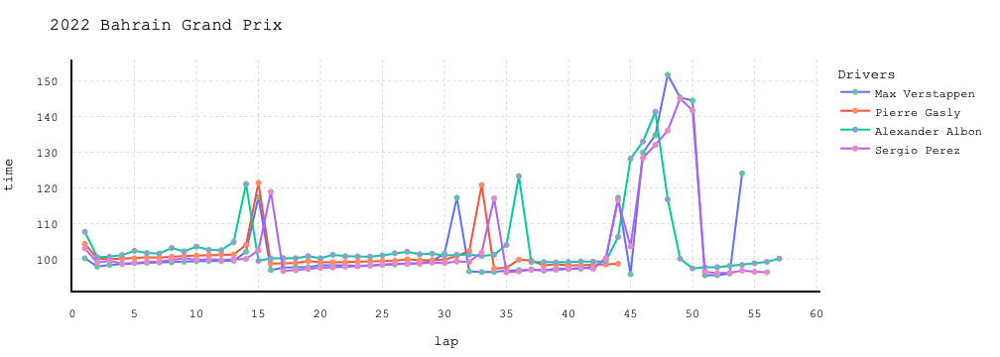

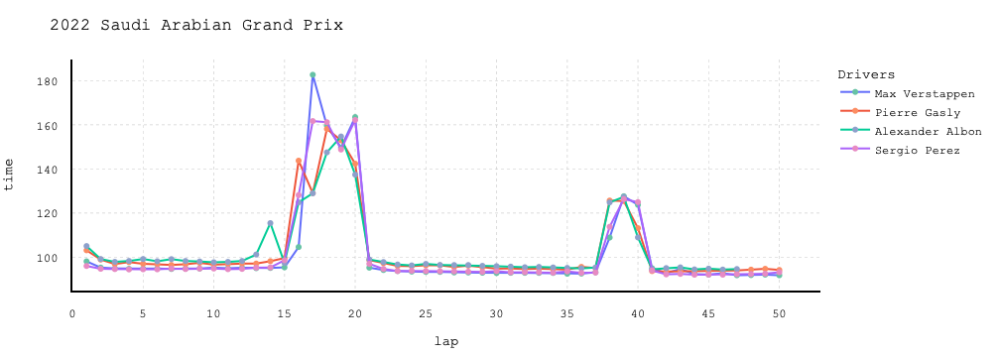

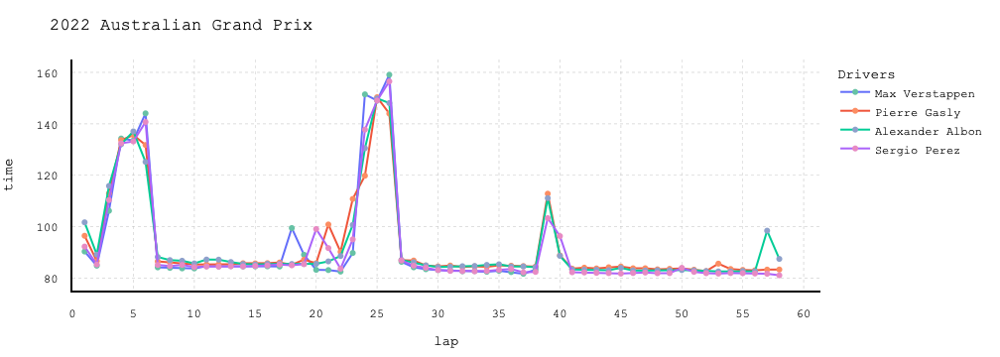

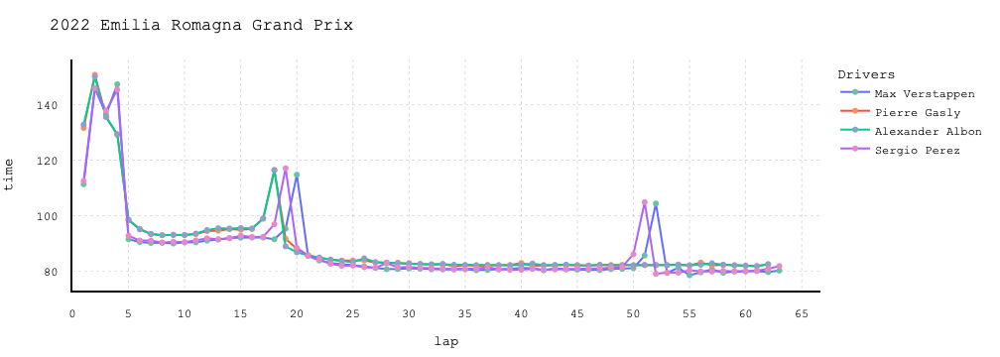

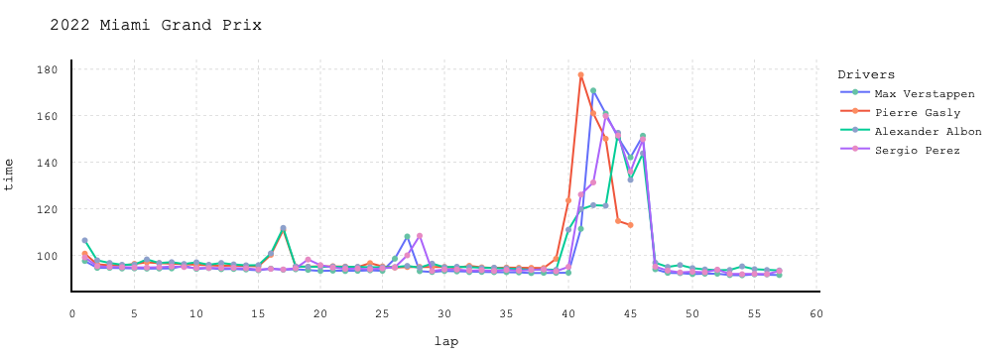

...

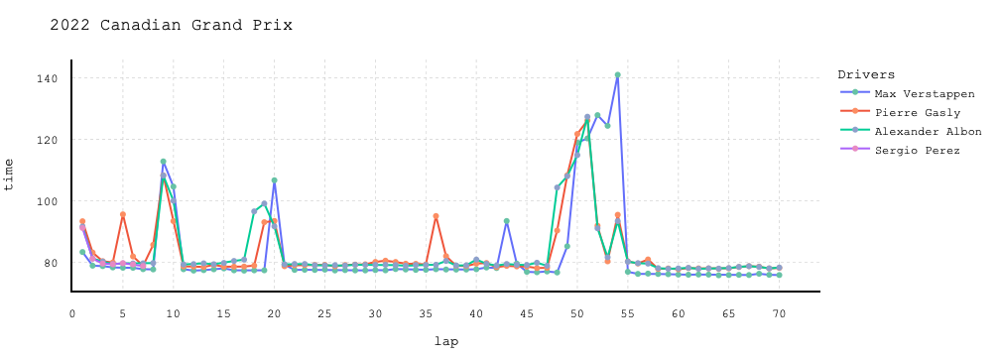

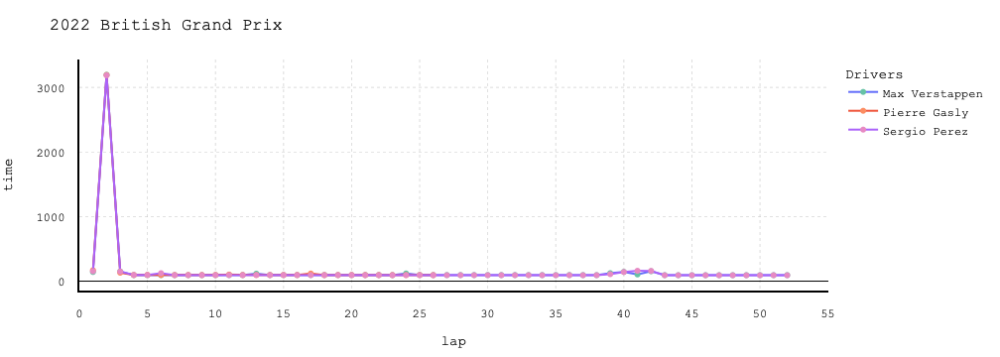

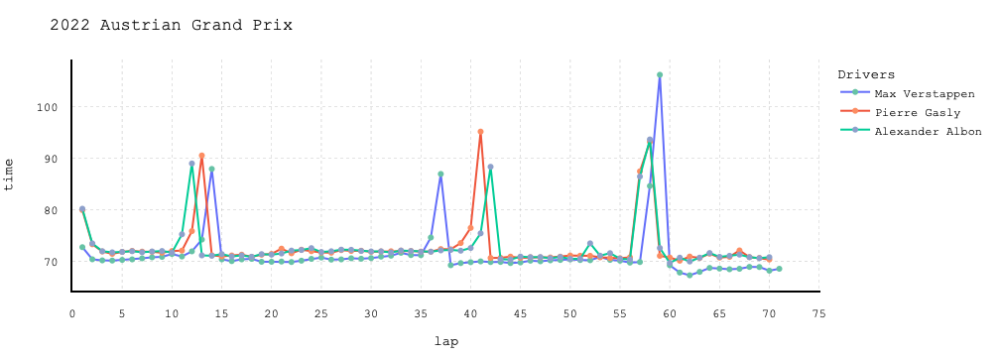

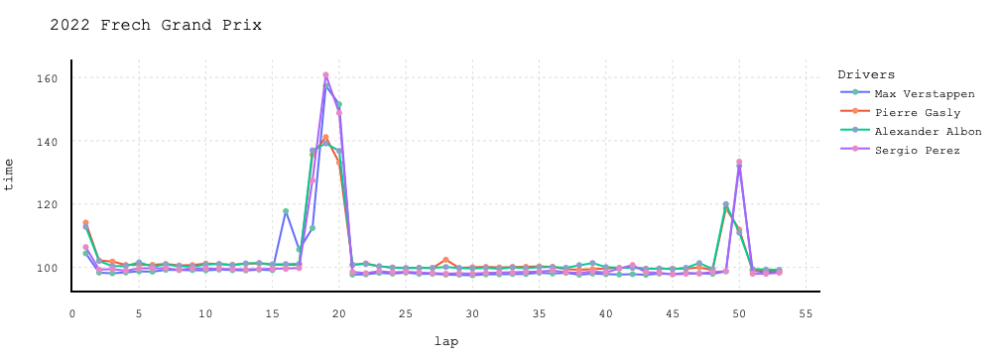

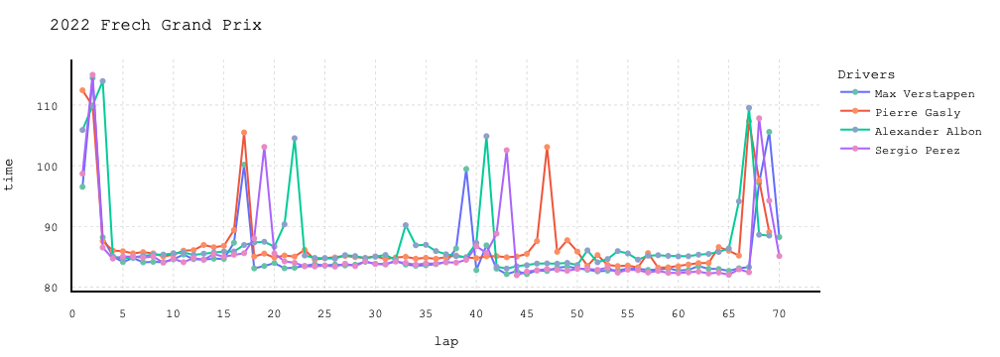

In [102]:

# RACES: GRAPH OBJECTS 
# Defining color of every driver

indexRB_ver_22 = df_2022[(df_2022['code'] == 'VER')].index
df_2022.loc[indexRB_ver_22,'color'] = '#66c2a5'

indexRB_gasly_22 = df_2022[(df_2022['code'] == 'GAS')].index
df_2022.loc[indexRB_gasly_22,'color'] = '#fc8d62'

indexRB_albon_22 = df_2022[(df_2022['code'] == 'ALB')].index
df_2022.loc[indexRB_albon_22,'color'] = '#8da0cb'

indexRB_perez_22 = df_2022[(df_2022['code'] == 'PER')].index
df_2022.loc[indexRB_perez_22,'color'] = '#e78ac3'



# Bahrain Grand Prix (1)

df_2022_F_BAH = df_2022[(df_2022['name'] == 'Bahrain Grand Prix')]
df_2022_BAH = df_2022_F_BAH.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2022_BAH = df_2022_BAH.sort_values(by="lap")

df_2022_BAH_ver =df_2022_BAH[df_2022_BAH['code']=='VER']

df_2022_BAH_gas =df_2022_BAH[df_2022_BAH['code']=='GAS']

df_2022_BAH_alb =df_2022_BAH[df_2022_BAH['code']=='ALB']

df_2022_BAH_per =df_2022_BAH[df_2022_BAH['code']=='PER']

fig2022_1 = go.Figure()

fig2022_1.add_trace(go.Scatter(x=df_2022_BAH_ver['lap'], y=df_2022_BAH_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2022_BAH_ver['color'],
                           marker=dict(color=df_2022_BAH_ver['color'])
))
fig2022_1.add_trace(go.Scatter(x=df_2022_BAH_gas['lap'], y=df_2022_BAH_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2022_BAH_gas['color'],
                           marker=dict(color=df_2022_BAH_gas['color'])
))


fig2022_1.add_trace(go.Scatter(x=df_2022_BAH_alb['lap'], y=df_2022_BAH_alb['seconds'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=df_2022_BAH_alb['color'])
))

fig2022_1.add_trace(go.Scatter(x=df_2022_BAH_per['lap'], y=df_2022_BAH_per['seconds'],
                    mode='lines+markers',
                    name='Sergio Perez',
                           marker=dict(color=df_2022_BAH_per['color'])
))

fig2022_1.update_layout(layout)
fig2022_1.update_layout(title = '2022 Bahrain Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2022_1.show()


# Saudi Arabian Grand Prix (2)

df_2022_F_SAU = df_2022[(df_2022['name'] == 'Saudi Arabian Grand Prix')]
df_2022_SAU = df_2022_F_SAU.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2022_SAU = df_2022_SAU.sort_values(by="lap")

df_2022_SAU_ver =df_2022_SAU[df_2022_SAU['code']=='VER']

df_2022_SAU_gas =df_2022_SAU[df_2022_SAU['code']=='GAS']

df_2022_SAU_alb =df_2022_SAU[df_2022_SAU['code']=='ALB']

df_2022_SAU_per =df_2022_SAU[df_2022_SAU['code']=='PER']

fig2022_2 = go.Figure()

fig2022_2.add_trace(go.Scatter(x=df_2022_SAU_ver['lap'], y=df_2022_SAU_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2022_SAU_ver['color'],
                           marker=dict(color=df_2022_SAU_ver['color'])
))
fig2022_2.add_trace(go.Scatter(x=df_2022_SAU_gas['lap'], y=df_2022_SAU_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2022_SAU_gas['color'],
                           marker=dict(color=df_2022_SAU_gas['color'])
))


fig2022_2.add_trace(go.Scatter(x=df_2022_SAU_alb['lap'], y=df_2022_SAU_alb['seconds'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=df_2022_SAU_alb['color'])
))

fig2022_2.add_trace(go.Scatter(x=df_2022_SAU_per['lap'], y=df_2022_SAU_per['seconds'],
                    mode='lines+markers',
                    name='Sergio Perez',
                           marker=dict(color=df_2022_SAU_per['color'])
))

fig2022_2.update_layout(layout)
fig2022_2.update_layout(title = '2022 Saudi Arabian Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2022_2.show()

# Australian Grand Prix (3)

df_2022_F_AUST = df_2022[(df_2022['name'] == 'Australian Grand Prix')]
df_2022_AUST = df_2022_F_AUST.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2022_AUST = df_2022_AUST.sort_values(by="lap")

df_2022_AUST_ver =df_2022_AUST[df_2022_AUST['code']=='VER']

df_2022_AUST_gas =df_2022_AUST[df_2022_AUST['code']=='GAS']

df_2022_AUST_alb =df_2022_AUST[df_2022_AUST['code']=='ALB']

df_2022_AUST_per =df_2022_AUST[df_2022_AUST['code']=='PER']

fig2022_3 = go.Figure()

fig2022_3.add_trace(go.Scatter(x=df_2022_AUST_ver['lap'], y=df_2022_AUST_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2022_AUST_ver['color'],
                           marker=dict(color=df_2022_AUST_ver['color'])
))
fig2022_3.add_trace(go.Scatter(x=df_2022_AUST_gas['lap'], y=df_2022_AUST_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2022_AUST_gas['color'],
                           marker=dict(color=df_2022_AUST_gas['color'])
))


fig2022_3.add_trace(go.Scatter(x=df_2022_AUST_alb['lap'], y=df_2022_AUST_alb['seconds'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=df_2022_AUST_alb['color'])
))

fig2022_3.add_trace(go.Scatter(x=df_2022_AUST_per['lap'], y=df_2022_AUST_per['seconds'],
                    mode='lines+markers',
                    name='Sergio Perez',
                           marker=dict(color=df_2022_AUST_per['color'])
))

fig2022_3.update_layout(layout)
fig2022_3.update_layout(title = '2022 Australian Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2022_3.show()



# Emilia Romagna Grand Prix (4)

df_2022_F_EMI = df_2022[(df_2022['name'] == 'Emilia Romagna Grand Prix')]
df_2022_EMI = df_2022_F_EMI.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2022_EMI = df_2022_EMI.sort_values(by="lap")

df_2022_EMI_ver =df_2022_EMI[df_2022_EMI['code']=='VER']

df_2022_EMI_gas =df_2022_EMI[df_2022_EMI['code']=='GAS']

df_2022_EMI_alb =df_2022_EMI[df_2022_EMI['code']=='ALB']

df_2022_EMI_per =df_2022_EMI[df_2022_EMI['code']=='PER']

fig2022_4 = go.Figure()

fig2022_4.add_trace(go.Scatter(x=df_2022_EMI_ver['lap'], y=df_2022_EMI_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2022_EMI_ver['color'],
                           marker=dict(color=df_2022_EMI_ver['color'])
))
fig2022_4.add_trace(go.Scatter(x=df_2022_EMI_gas['lap'], y=df_2022_EMI_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2022_EMI_gas['color'],
                           marker=dict(color=df_2022_EMI_gas['color'])
))


fig2022_4.add_trace(go.Scatter(x=df_2022_EMI_alb['lap'], y=df_2022_EMI_alb['seconds'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=df_2022_EMI_alb['color'])
))

fig2022_4.add_trace(go.Scatter(x=df_2022_EMI_per['lap'], y=df_2022_EMI_per['seconds'],
                    mode='lines+markers',
                    name='Sergio Perez',
                           marker=dict(color=df_2022_EMI_per['color'])
))

fig2022_4.update_layout(layout)
fig2022_4.update_layout(title = '2022 Emilia Romagna Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2022_4.show()


# Miami Grand Prix (5)

df_2022_F_MIA = df_2022[(df_2022['name'] == 'Miami Grand Prix')]
df_2022_MIA = df_2022_F_MIA.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2022_MIA = df_2022_MIA.sort_values(by="lap")

df_2022_MIA_ver =df_2022_MIA[df_2022_MIA['code']=='VER']

df_2022_MIA_gas =df_2022_MIA[df_2022_MIA['code']=='GAS']

df_2022_MIA_alb =df_2022_MIA[df_2022_MIA['code']=='ALB']

df_2022_MIA_per =df_2022_MIA[df_2022_MIA['code']=='PER']

fig2022_5 = go.Figure()

fig2022_5.add_trace(go.Scatter(x=df_2022_MIA_ver['lap'], y=df_2022_MIA_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2022_MIA_ver['color'],
                           marker=dict(color=df_2022_MIA_ver['color'])
))
fig2022_5.add_trace(go.Scatter(x=df_2022_MIA_gas['lap'], y=df_2022_MIA_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2022_MIA_gas['color'],
                           marker=dict(color=df_2022_MIA_gas['color'])
))


fig2022_5.add_trace(go.Scatter(x=df_2022_MIA_alb['lap'], y=df_2022_MIA_alb['seconds'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=df_2022_MIA_alb['color'])
))

fig2022_5.add_trace(go.Scatter(x=df_2022_MIA_per['lap'], y=df_2022_MIA_per['seconds'],
                    mode='lines+markers',
                    name='Sergio Perez',
                           marker=dict(color=df_2022_MIA_per['color'])
))

fig2022_5.update_layout(layout)
fig2022_5.update_layout(title = '2022 Miami Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2022_5.show()


# Spanish Grand Prix (6)

df_2022_F_ESP = df_2022[(df_2022['name'] == 'Spanish Grand Prix')]
df_2022_ESP = df_2022_F_ESP.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2022_ESP = df_2022_ESP.sort_values(by="lap")

df_2022_ESP_ver =df_2022_ESP[df_2022_ESP['code']=='VER']

df_2022_ESP_gas =df_2022_ESP[df_2022_ESP['code']=='GAS']

df_2022_ESP_alb =df_2022_ESP[df_2022_ESP['code']=='ALB']

df_2022_ESP_per =df_2022_ESP[df_2022_ESP['code']=='PER']

fig2022_6 = go.Figure()

fig2022_6.add_trace(go.Scatter(x=df_2022_ESP_ver['lap'], y=df_2022_ESP_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2022_ESP_ver['color'],
                           marker=dict(color=df_2022_ESP_ver['color'])
))
fig2022_6.add_trace(go.Scatter(x=df_2022_ESP_gas['lap'], y=df_2022_ESP_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2022_ESP_gas['color'],
                           marker=dict(color=df_2022_ESP_gas['color'])
))


fig2022_6.add_trace(go.Scatter(x=df_2022_ESP_alb['lap'], y=df_2022_ESP_alb['seconds'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=df_2022_ESP_alb['color'])
))

fig2022_6.add_trace(go.Scatter(x=df_2022_ESP_per['lap'], y=df_2022_ESP_per['seconds'],
                    mode='lines+markers',
                    name='Sergio Perez',
                           marker=dict(color=df_2022_ESP_per['color'])
))

fig2022_6.update_layout(layout)
fig2022_6.update_layout(title = '2022 Spanish Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2022_6.show()



# Monaco Grand Prix (7)

df_2022_F_MON = df_2022[(df_2022['name'] == 'Monaco Grand Prix')]
df_2022_MON = df_2022_F_MON.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2022_MON = df_2022_MON.sort_values(by="lap")

df_2022_MON_ver =df_2022_MON[df_2022_MON['code']=='VER']

df_2022_MON_gas =df_2022_MON[df_2022_MON['code']=='GAS']

df_2022_MON_alb =df_2022_MON[df_2022_MON['code']=='ALB']

df_2022_MON_per =df_2022_MON[df_2022_MON['code']=='PER']

fig2022_7 = go.Figure()

fig2022_7.add_trace(go.Scatter(x=df_2022_MON_ver['lap'], y=df_2022_MON_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2022_MON_ver['color'],
                           marker=dict(color=df_2022_MON_ver['color'])
))
fig2022_7.add_trace(go.Scatter(x=df_2022_MON_gas['lap'], y=df_2022_MON_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2022_MON_gas['color'],
                           marker=dict(color=df_2022_MON_gas['color'])
))


fig2022_7.add_trace(go.Scatter(x=df_2022_MON_alb['lap'], y=df_2022_MON_alb['seconds'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=df_2022_MON_alb['color'])
))

fig2022_7.add_trace(go.Scatter(x=df_2022_MON_per['lap'], y=df_2022_MON_per['seconds'],
                    mode='lines+markers',
                    name='Sergio Perez',
                           marker=dict(color=df_2022_MON_per['color'])
))

fig2022_7.update_layout(layout)
fig2022_7.update_layout(title = '2022 Monaco Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2022_7.show()

# Azerbaijan Grand Prix (8)

df_2022_F_AZB = df_2022[(df_2022['name'] == 'Azerbaijan Grand Prix')]
df_2022_AZB = df_2022_F_AZB.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2022_AZB = df_2022_AZB.sort_values(by="lap")

df_2022_AZB_ver =df_2022_AZB[df_2022_AZB['code']=='VER']

df_2022_AZB_gas =df_2022_AZB[df_2022_AZB['code']=='GAS']

df_2022_AZB_alb =df_2022_AZB[df_2022_AZB['code']=='ALB']

df_2022_AZB_per =df_2022_AZB[df_2022_AZB['code']=='PER']

fig2022_8 = go.Figure()

fig2022_8.add_trace(go.Scatter(x=df_2022_AZB_ver['lap'], y=df_2022_AZB_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2022_AZB_ver['color'],
                           marker=dict(color=df_2022_AZB_ver['color'])
))
fig2022_8.add_trace(go.Scatter(x=df_2022_AZB_gas['lap'], y=df_2022_AZB_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2022_AZB_gas['color'],
                           marker=dict(color=df_2022_AZB_gas['color'])
))


fig2022_8.add_trace(go.Scatter(x=df_2022_AZB_alb['lap'], y=df_2022_AZB_alb['seconds'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=df_2022_AZB_alb['color'])
))

fig2022_8.add_trace(go.Scatter(x=df_2022_AZB_per['lap'], y=df_2022_AZB_per['seconds'],
                    mode='lines+markers',
                    name='Sergio Perez',
                           marker=dict(color=df_2022_AZB_per['color'])
))

fig2022_8.update_layout(layout)
fig2022_8.update_layout(title = '2022 Azerbaijan Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2022_8.show()

# Canadian Grand Prix (9)

df_2022_F_CAN = df_2022[(df_2022['name'] == 'Canadian Grand Prix')]
df_2022_CAN = df_2022_F_CAN.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2022_CAN = df_2022_CAN.sort_values(by="lap")

df_2022_CAN_ver =df_2022_CAN[df_2022_CAN['code']=='VER']

df_2022_CAN_gas =df_2022_CAN[df_2022_CAN['code']=='GAS']

df_2022_CAN_alb =df_2022_CAN[df_2022_CAN['code']=='ALB']

df_2022_CAN_per =df_2022_CAN[df_2022_CAN['code']=='PER']

fig2022_9 = go.Figure()

fig2022_9.add_trace(go.Scatter(x=df_2022_CAN_ver['lap'], y=df_2022_CAN_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2022_CAN_ver['color'],
                           marker=dict(color=df_2022_CAN_ver['color'])
))
fig2022_9.add_trace(go.Scatter(x=df_2022_CAN_gas['lap'], y=df_2022_CAN_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2022_CAN_gas['color'],
                           marker=dict(color=df_2022_CAN_gas['color'])
))


fig2022_9.add_trace(go.Scatter(x=df_2022_CAN_alb['lap'], y=df_2022_CAN_alb['seconds'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=df_2022_CAN_alb['color'])
))

fig2022_9.add_trace(go.Scatter(x=df_2022_CAN_per['lap'], y=df_2022_CAN_per['seconds'],
                    mode='lines+markers',
                    name='Sergio Perez',
                           marker=dict(color=df_2022_CAN_per['color'])
))

fig2022_9.update_layout(layout)
fig2022_9.update_layout(title = '2022 Canadian Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2022_9.show()


# British Grand Prix (10)

df_2022_F_BRIT = df_2022[(df_2022['name'] == 'British Grand Prix')]
df_2022_BRIT = df_2022_F_BRIT.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2022_BRIT = df_2022_BRIT.sort_values(by="lap")

df_2022_BRIT_ver =df_2022_BRIT[df_2022_BRIT['code']=='VER']

df_2022_BRIT_gas =df_2022_BRIT[df_2022_BRIT['code']=='GAS']

df_2022_BRIT_alb =df_2022_BRIT[df_2022_BRIT['code']=='ALB']

df_2022_BRIT_per =df_2022_BRIT[df_2022_BRIT['code']=='PER']

fig2022_10 = go.Figure()

fig2022_10.add_trace(go.Scatter(x=df_2022_BRIT_ver['lap'], y=df_2022_BRIT_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2022_BRIT_ver['color'],
                           marker=dict(color=df_2022_BRIT_ver['color'])
))
fig2022_10.add_trace(go.Scatter(x=df_2022_BRIT_gas['lap'], y=df_2022_BRIT_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2022_BRIT_gas['color'],
                           marker=dict(color=df_2022_BRIT_gas['color'])
))


fig2022_10.add_trace(go.Scatter(x=df_2022_BRIT_alb['lap'], y=df_2022_BRIT_alb['seconds'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=df_2022_BRIT_alb['color'])
))

fig2022_10.add_trace(go.Scatter(x=df_2022_BRIT_per['lap'], y=df_2022_BRIT_per['seconds'],
                    mode='lines+markers',
                    name='Sergio Perez',
                           marker=dict(color=df_2022_BRIT_per['color'])
))

fig2022_10.update_layout(layout)
fig2022_10.update_layout(title = '2022 British Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2022_10.show()


# Austrian Grand Prix (11)

df_2022_F_AUS = df_2022[(df_2022['name'] == 'Austrian Grand Prix')]
df_2022_AUS = df_2022_F_AUS.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2022_AUS = df_2022_AUS.sort_values(by="lap")

df_2022_AUS_ver =df_2022_AUS[df_2022_AUS['code']=='VER']

df_2022_AUS_gas =df_2022_AUS[df_2022_AUS['code']=='GAS']

df_2022_AUS_alb =df_2022_AUS[df_2022_AUS['code']=='ALB']

df_2022_AUS_per =df_2022_AUS[df_2022_AUS['code']=='PER']

fig2022_11 = go.Figure()

fig2022_11.add_trace(go.Scatter(x=df_2022_AUS_ver['lap'], y=df_2022_AUS_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2022_AUS_ver['color'],
                           marker=dict(color=df_2022_AUS_ver['color'])
))
fig2022_11.add_trace(go.Scatter(x=df_2022_AUS_gas['lap'], y=df_2022_AUS_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2022_AUS_gas['color'],
                           marker=dict(color=df_2022_AUS_gas['color'])
))


fig2022_11.add_trace(go.Scatter(x=df_2022_AUS_alb['lap'], y=df_2022_AUS_alb['seconds'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=df_2022_AUS_alb['color'])
))

fig2022_10.add_trace(go.Scatter(x=df_2022_AUS_per['lap'], y=df_2022_AUS_per['seconds'],
                    mode='lines+markers',
                    name='Sergio Perez',
                           marker=dict(color=df_2022_AUS_per['color'])
))

fig2022_11.update_layout(layout)
fig2022_11.update_layout(title = '2022 Austrian Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2022_11.show()

# French Grand Prix (12)

df_2022_F_FRA = df_2022[(df_2022['name'] == 'French Grand Prix')]
df_2022_FRA = df_2022_F_FRA.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2022_FRA = df_2022_FRA.sort_values(by="lap")

df_2022_FRA_ver =df_2022_FRA[df_2022_FRA['code']=='VER']

df_2022_FRA_gas =df_2022_FRA[df_2022_FRA['code']=='GAS']

df_2022_FRA_alb =df_2022_FRA[df_2022_FRA['code']=='ALB']

df_2022_FRA_per =df_2022_FRA[df_2022_FRA['code']=='PER']

fig2022_12 = go.Figure()

fig2022_12.add_trace(go.Scatter(x=df_2022_FRA_ver['lap'], y=df_2022_FRA_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2022_FRA_ver['color'],
                           marker=dict(color=df_2022_FRA_ver['color'])
))
fig2022_12.add_trace(go.Scatter(x=df_2022_FRA_gas['lap'], y=df_2022_FRA_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2022_FRA_gas['color'],
                           marker=dict(color=df_2022_FRA_gas['color'])
))


fig2022_12.add_trace(go.Scatter(x=df_2022_FRA_alb['lap'], y=df_2022_FRA_alb['seconds'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=df_2022_FRA_alb['color'])
))

fig2022_12.add_trace(go.Scatter(x=df_2022_FRA_per['lap'], y=df_2022_FRA_per['seconds'],
                    mode='lines+markers',
                    name='Sergio Perez',
                           marker=dict(color=df_2022_FRA_per['color'])
))

fig2022_12.update_layout(layout)
fig2022_12.update_layout(title = '2022 Frech Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2022_12.show()




# Hungarian Grand Prix (13)

df_2022_F_HUN = df_2022[(df_2022['name'] == 'Hungarian Grand Prix')]
df_2022_HUN = df_2022_F_HUN.query("driverRef in ['gasly', 'max_verstappen','albon','perez']")
df_2022_HUN = df_2022_HUN.sort_values(by="lap")

df_2022_HUN_ver =df_2022_HUN[df_2022_HUN['code']=='VER']

df_2022_HUN_gas =df_2022_HUN[df_2022_HUN['code']=='GAS']

df_2022_HUN_alb =df_2022_HUN[df_2022_HUN['code']=='ALB']

df_2022_HUN_per =df_2022_HUN[df_2022_HUN['code']=='PER']

fig2022_12 = go.Figure()

fig2022_12.add_trace(go.Scatter(x=df_2022_HUN_ver['lap'], y=df_2022_HUN_ver['seconds'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = df_2022_HUN_ver['color'],
                           marker=dict(color=df_2022_HUN_ver['color'])
))
fig2022_12.add_trace(go.Scatter(x=df_2022_HUN_gas['lap'], y=df_2022_HUN_gas['seconds'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = df_2022_HUN_gas['color'],
                           marker=dict(color=df_2022_HUN_gas['color'])
))


fig2022_12.add_trace(go.Scatter(x=df_2022_HUN_alb['lap'], y=df_2022_HUN_alb['seconds'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=df_2022_HUN_alb['color'])
))

fig2022_12.add_trace(go.Scatter(x=df_2022_HUN_per['lap'], y=df_2022_HUN_per['seconds'],
                    mode='lines+markers',
                    name='Sergio Perez',
                           marker=dict(color=df_2022_HUN_per['color'])
))

fig2022_12.update_layout(layout)
fig2022_12.update_layout(title = '2022 Frech Grand Prix',xaxis_title ="lap",yaxis_title ="time",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2022_12.show()






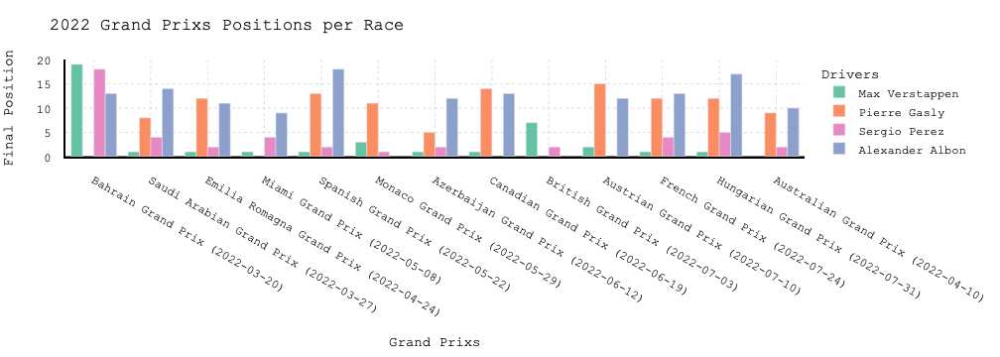

In [106]:
# Positions 2022
df_results_2022 = df_results[(df_results['year']==2022)&((df_results['code']=='VER')|(df_results['code']=='GAS')|(df_results['code']=='ALB')|(df_results['code']=='PER'))]
df_results_2022= df_results_2022.sort_values(by="date")
    
indexRB_ver_22 = df_results_2022[(df_results_2022['code'] == 'VER')].index
df_results_2022.loc[indexRB_ver_22,'color'] = '#66c2a5'

indexRB_gasly_22 = df_results_2022[(df_results_2022['code'] == 'GAS')].index
df_results_2022.loc[indexRB_gasly_22,'color'] = '#fc8d62'

indexRB_albon_22 = df_results_2022[(df_results_2022['code'] == 'ALB')].index
df_results_2022.loc[indexRB_albon_22,'color'] = '#8da0cb'

indexRB_perez_22 = df_results_2022[(df_results_2022['code'] == 'PER')].index
df_results_2022.loc[indexRB_perez_22,'color'] = '#e78ac3'



df_results_2022_ver =df_results_2022[df_results_2022['code']=='VER']
df_results_2022_ver= df_results_2022_ver.sort_values(by="date")
df_results_2022_ver['corrida']=df_results_2022_ver['name']+' ('+df_results_2022_ver['date']+')'

df_results_2022_gas =df_results_2022[df_results_2022['code']=='GAS']
df_results_2022_gas= df_results_2022_gas.sort_values(by="date")
df_results_2022_gas['corrida']=df_results_2022_gas['name']+' ('+df_results_2022_gas['date']+')'

df_results_2022_per =df_results_2022[df_results_2022['code']=='PER']
df_results_2022_per= df_results_2022_per.sort_values(by="date")
df_results_2022_per['corrida']=df_results_2022_per['name']+' ('+df_results_2022_per['date']+')'

df_results_2022_alb =df_results_2022[df_results_2022['code']=='ALB']
df_results_2022_alb= df_results_2022_alb.sort_values(by="date")
df_results_2022_alb['corrida']=df_results_2022_alb['name']+' ('+df_results_2022_alb['date']+')'

fig_results_2022 = go.Figure()

fig_results_2022 = go.Figure(data=[
    go.Bar(name ='Max Verstappen',x=df_results_2022_ver['corrida'], y=df_results_2022_ver['position'],marker_color=df_results_2022_ver['color']),
    go.Bar(name='Pierre Gasly',x=df_results_2022_gas['corrida'], y=df_results_2022_gas['position'],marker_color=df_results_2022_gas['color']),
    go.Bar(name='Sergio Perez',x=df_results_2022_per['corrida'], y=df_results_2022_per['position'],marker_color=df_results_2022_per['color']),
    go.Bar(name='Alexander Albon',x=df_results_2022_alb['corrida'], y=df_results_2022_alb['position'],marker_color=df_results_2022_alb['color']),
    
])

fig_results_2022.update_layout(layout_results)
fig_results_2022.update_layout(title = '2022 Grand Prixs Positions per Race',xaxis_title ="Grand Prixs",yaxis_title ="Final Position",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig_results_2022.show()
#fig = px.bar(df_results_2022, x='name', y='position'
             #,hover_data=['driverRef', 'position']
 #            , color='driverRef', height=100,barmode='group', title = 'Position 2022')
#fig.update_layout({
#'plot_bgcolor': 'rgba(0, 0, 0, 0)',
#'paper_bgcolor': 'rgba(0, 0, 0, 0)',
#})
#fig.show()

/var/folders/s8/zqdvt79d34nd7fs16cr64b7r0000gn/T/ipykernel_3968/617452407.py:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/s8/zqdvt79d34nd7fs16cr64b7r0000gn/T/ipykernel_3968/617452407.py:21: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/s8/zqdvt79d34nd7fs16cr64b7r0000gn/T/ipykernel_3968/617452407.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

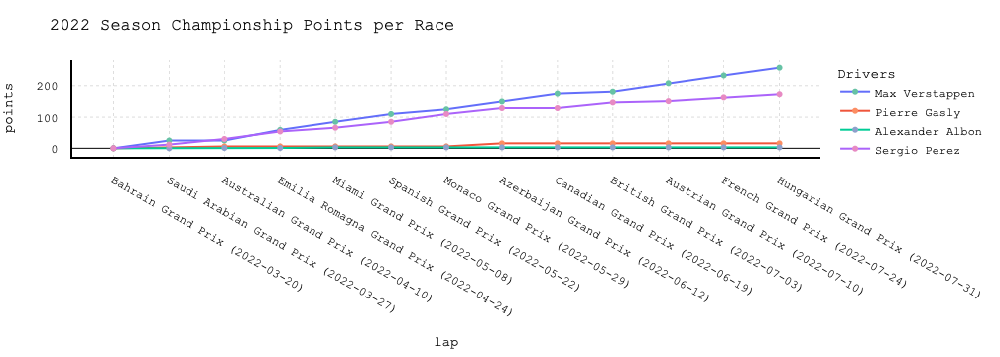

In [104]:
# Season Points
season_Points_2022 = season_Points_2022.query("code in ['GAS', 'VER','ALB','PER']")
season_Points_2022 = season_Points_2022.sort_values(by="date")

indexRB_ver_22 = season_Points_2022[(season_Points_2022['code'] == 'VER')].index
season_Points_2022.loc[indexRB_ver_22,'color'] = '#66c2a5'

indexRB_gasly_22 = season_Points_2022[(season_Points_2022['code'] == 'GAS')].index
season_Points_2022.loc[indexRB_gasly_22,'color'] = '#fc8d62'

indexRB_albon_22 = season_Points_2022[(season_Points_2022['code'] == 'ALB')].index
season_Points_2022.loc[indexRB_albon_22,'color'] = '#8da0cb'

indexRB_perez_22 = season_Points_2022[(season_Points_2022['code'] == 'PER')].index
season_Points_2022.loc[indexRB_perez_22,'color'] = '#e78ac3'

season_Points_2022_ver =season_Points_2022[season_Points_2022['code']=='VER']
season_Points_2022_ver['corrida']=season_Points_2022_ver['name']+' ('+season_Points_2022_ver['date']+')'

season_Points_2022_gas =season_Points_2022[season_Points_2022['code']=='GAS']
season_Points_2022_gas['corrida']=season_Points_2022_gas['name']+' ('+season_Points_2022_gas['date']+')'

season_Points_2022_alb =season_Points_2022[season_Points_2022['code']=='ALB']
season_Points_2022_alb['corrida']=season_Points_2022_alb['name']+' ('+season_Points_2022_alb['date']+')'

season_Points_2022_per =season_Points_2022[season_Points_2022['code']=='PER']
season_Points_2022_per['corrida']=season_Points_2022_per['name']+' ('+season_Points_2022_per['date']+')'

fig2022_season_points = go.Figure()

fig2022_season_points.add_trace(go.Scatter(x=season_Points_2022_ver['corrida'], y=season_Points_2022_ver['points'],
                    mode='lines+markers',
                    name='Max Verstappen',marker_color = season_Points_2022_ver['color'],
                           marker=dict(color=season_Points_2022_ver['color'])
))
fig2022_season_points.add_trace(go.Scatter(x=season_Points_2022_gas['corrida'], y=season_Points_2022_gas['points'],
                    mode='lines+markers',
                    name='Pierre Gasly',
                           marker_color = season_Points_2022_gas['color'],
                           marker=dict(color=season_Points_2022_gas['color'])
))


fig2022_season_points.add_trace(go.Scatter(x=season_Points_2022_alb['corrida'], y=season_Points_2022_alb['points'],
                    mode='lines+markers',
                    name='Alexander Albon',
                           marker=dict(color=season_Points_2022_alb['color'])
))

fig2022_season_points.add_trace(go.Scatter(x=season_Points_2022_per['corrida'], y=season_Points_2022_per['points'],
                    mode='lines+markers',
                    name='Sergio Perez',
                           marker=dict(color=season_Points_2022_per['color'])
))

fig2022_season_points.update_layout(layout_results)
fig2022_season_points.update_layout(title = '2022 Season Championship Points per Race ',xaxis_title ="lap",yaxis_title ="points",
                        legend_title="Drivers",font=dict(family="Courier New, monospace",size=12,color="Black"))
fig2022_season_points.show()


#fig = px.line(season_Points_2022_, x='name', y='points', color='code', markers=True, title = '2022 Red Bull WDC')
#fig.update_layout({
#'plot_bgcolor': 'rgba(0, 0, 0, 0)',
#'paper_bgcolor': 'rgba(0, 0, 0, 0)',
#})
#fig.show()

In [84]:
# TESTING
#df_2022_BAH1 =  df_2022_BAH
#df_2022_BAH1.time.astype('int64')
#df_2022_BAH1.info()

In [ ]:
# New generation 
# Drivers:

# George Russel 2019 Williams 2022 Mercedes

# Pierre Gasly 2017-18 toro roso 2019 Red Bull + toro roso with danill

# Lando Norris 2019 mclaren

# Zhou 2022 sauber alfa romeo

# Mick Schumacher 2021 haas 

# Charles Leclerc 2018 sauber alfa romeo 2019 Ferrari

# Yuki Tsunoda 2021 alpha tauri

# Max Verstappen 2015 toro roso 2016 Red Bull Racing

# Alexander Albon 2019 Toro roso + 2020 Red bull 2022 Williams




# 2019  Russel vs Alex vs Lando 
# 2018  Pierre vs Charles 
# 2021  Mick vs Yuki
# Max vs RB drivers 

In [35]:
#fig_2022_01 = px.bar(df_2022, x="driverRef", y="position", color="driverRef", title="Australian Grand Prix")
#fig_2022_01.show()

In [36]:
#fig = px.bar(df_2022, x='name', y='position',
 #            hover_data=['driverRef', 'position'], color='driverRef',
  #           labels={'pop':'position'}, height=400)
#fig.show()


In [42]:
# NÃO

#df_driver_standings = driver_standings.head()
#df_driver_standings = df_driver_standings.merge(drivers[['driverId','code','driverRef']],how='left',on='driverId')
#df_driver_standings = df_driver_standings.merge(races[['raceId','name','date','year']],how='left',on='raceId')
#df_driver_standings.head()
#df_driver_standings = df_driver_standings[(df_driver_standings['year']==2019)&((df_driver_standings['code']=='VER')|(df_driver_standings['code']=='GAS'))]
#df_driver_standings.sort_values(['date'],inplace=True)

#df_results[(df_results['year']==2019)&((df_results['code']=='VER')|(df_results['code']=='GAS')|(df_results['code']=='ALB')|(df_results['code']=='PER'))]

#sns.lineplot(data=df_driver_standings,x='name', y='points',hue='code',marker='.',palette=['black','orange'])
#plt.tight_layout()
#plt.xticks(rotation=90)
#plt.show()
#df_driver_standings.head()

In [85]:
# Line graph 
#fig = px.line(a2, x="name", y="points", title='2019 WDC')
#fig.show()

In [86]:
#pit_stops

In [57]:
b5 = pit_stops
b5 = pit_stops.merge(drivers[['driverId','code','driverRef']], how = 'left', on = 'driverId')
b6 = b5.merge(races[['raceId','name','date','year']],how='left',on='raceId')
b7 = b6
b7 = b6[(b6['year']==2019)&((b6['code']=='VER')|(b6['code']=='GAS')|(b6['code']=='ALB'))]
b8 = b7
b8['duration'] = b8['milliseconds']/1000
b8[b8['duration']<40].groupby(['code']).mean()['duration']

data25 = b8[b8['duration']<40].groupby(['name','code']).mean().reset_index()
#data25

fig25 = px.bar(data25, x='duration', y='name'
             ,hover_data=['driverRef', 'position']
               , color='code', height=1000,barmode='group')
fig25.show()
#b7.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 93 entries, 6794 to 7425
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   raceId        93 non-null     int64  
 1   driverId      93 non-null     int64  
 2   stop          93 non-null     int64  
 3   lap           93 non-null     int64  
 4   time          93 non-null     object 
 5   duration      93 non-null     float64
 6   milliseconds  93 non-null     int64  
 7   code          93 non-null     object 
 8   driverRef     93 non-null     object 
 9   name          93 non-null     object 
 10  date          93 non-null     object 
 11  year          93 non-null     int64  
dtypes: float64(1), int64(6), object(5)
memory usage: 9.4+ KB


/var/folders/s8/zqdvt79d34nd7fs16cr64b7r0000gn/T/ipykernel_4030/3504525125.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [153]:
c5 = qualifying
c6 = c5.merge(drivers[['driverId','code','driverRef']],how='left',on='driverId')
c7 = c6.merge(races[['raceId','name','date','year']],how='left',on='raceId')
c8 = c7[(c7['year']==2021)&((c7['code']=='VER')|(c7['code']=='GAS'))]

c9 = c8.copy()

c9.rename(columns={'position':'start_position'},inplace=True)
cfirst = df_laps[df_laps['lap']==1]
c10 = c9.merge(cfirst[['raceId','driverId','lap position']],on=['raceId','driverId'],how='left')
c10.rename(columns={'lap position':'lap_1_position'}, inplace=True)
c11 = c10.merge(results[['raceId','driverId','position']],on=['raceId','driverId'],how='left')
c11.rename(columns={'position':'final_position'},inplace=True)
#c11['Start to Lap 1']= -c11['lap 1 position'] + c11['start position']
#c11['Qualifying conversion']= -c11['final position'] + c11['start position']
#c11['Lap 1 conversion']= -c11['final position'] + c11['lap 1 position']

#c11.final_postion = positions.final_positio.astype('int64')
#a = a[a.position != '\\N']
#b = a[a['position'] == '1']
#b
#pd.to_numeric(c11['final position'])
c11['final_position'] = c11['final_position'].replace(['\\N'], '21')
c11.start_position = c11.start_position.astype('int64')
c11.lap_1_position = c11.lap_1_position.astype('int64')
c11.final_position = c11.final_position.astype('int64')
c11['Start_to_Lap_1']= -c11['lap_1_position'] + c11['start_position']
c11['Qualifying_conversion']= -c11['final_position'] + c11['start_position']
c11['Lap_1_conversion']= -c11['final_position'] + c11['lap_1_position']
c11.head()
c11.groupby(['code']).mean()[['Start_to_Lap_1','Qualifying_conversion','Lap_1_conversion']]
c11.info()
#fig50 = px.bar(c11, x='Start to Lap 1', y='name'
             #,hover_data=['driverRef', 'position']
 #            , color='code', height=1000,barmode='group')
#fig50.show()
#c11['final_postion'] = c11['final_postion'].replace(['\\N'], '21')

IntCastingNaNError: Cannot convert non-finite values (NA or inf) to integer

In [78]:
df_qualifying = pd.read_csv('/kaggle/input/formula-1-world-championship-1950-2020/qualifying.csv')
df_qualifying = df_qualifying.merge(df_drivers[['driverId','code','driverRef']],how='left',on='driverId')
df_qualifying = df_qualifying.merge(df_races[['raceId','name','date','year']],how='left',on='raceId')
df_qualifying = df_qualifying[(df_qualifying['year']==2021)&((df_qualifying['code']=='VER')|(df_qualifying['code']=='HAM'))]

df_conversions = df_qualifying.copy()
df_conversions.rename(columns={'position':'start position'},inplace=True)
df_first_lap = df_laps[df_laps['lap']==1]
df_conversions = df_conversions.merge(df_first_lap[['raceId','driverId','lap position']],on=['raceId','driverId'],how='left')
df_conversions.rename(columns={'lap position':'lap 1 position'}, inplace=True)
df_conversions = df_conversions.merge(df_results[['raceId','driverId','position']],on=['raceId','driverId'],how='left')
df_conversions.rename(columns={'position':'final position'},inplace=True)
df_conversions['Start to Lap 1']= -df_conversions['lap 1 position'] + df_conversions['start position']
df_conversions['Qualifying conversion']= -df_conversions['final position'] + df_conversions['start position']
df_conversions['Lap 1 conversion']= -df_conversions['final position'] + df_conversions['lap 1 position']

df_conversions.head()

df_conversions.groupby(['code']).mean()[['Start to Lap 1','Qualifying conversion','Lap 1 conversion']]

fig50 = px.bar(data25, x='duration', y='name'
             #,hover_data=['driverRef', 'position']
             , color='code', height=1000,barmode='group')
fig25.show()

sns.barplot(data=df_conversions,
            y='name', 
            x='Start to Lap 1',
            hue='code',
            palette=['orange','black'])
plt.tight_layout()
plt.xticks(rotation=90)
plt.show()

sns.barplot(data=df_conversions,
            y='name', 
            x='Qualifying conversion',
            hue='code',
            palette=['orange','black'])
plt.tight_layout()
plt.xticks(rotation=90)
plt.show()

sns.barplot(data=df_conversions,
            y='name', 
            x='Lap 1 conversion',
            hue='code',
            palette=['orange','black'])
plt.tight_layout()
plt.xticks(rotation=90)
plt.show()


ValueError: cannot reindex from a duplicate axis

<class 'pandas.core.frame.DataFrame'>
Int64Index: 90 entries, 0 to 89
Data columns (total 17 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   raceId        90 non-null     int64  
 1   driverId      90 non-null     int64  
 2   stop          90 non-null     int64  
 3   lap           90 non-null     int64  
 4   time          90 non-null     object 
 5   duration      90 non-null     float64
 6   milliseconds  90 non-null     int64  
 7   code_x        90 non-null     object 
 8   driverRef_x   90 non-null     object 
 9   name_x        90 non-null     object 
 10  date_x        90 non-null     object 
 11  year_x        90 non-null     int64  
 12  code_y        90 non-null     object 
 13  driverRef_y   90 non-null     object 
 14  name_y        90 non-null     object 
 15  date_y        90 non-null     object 
 16  year_y        90 non-null     int64  
dtypes: float64(1), int64(7), object(9)
memory usage: 12.7+ KB
